In [181]:
# Isaac Berez
# 17.01.23
import sys
from scipy.io import mmread
import os
import glob
import pandas as pd
import numpy as np
#from pandas_ods_reader import read_ods
from copy import deepcopy
import pprint
import json
import re
from datetime import datetime
import logging
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import HuberRegressor
from sklearn import preprocessing
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform
from sklearn.manifold import TSNE
from sklearn import metrics
from sklearn.cluster import DBSCAN
import seaborn as sns
from sklearn.neighbors import NearestNeighbors
from collections import Counter
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import harmonypy as hm
from matplotlib.cm import ScalarMappable
from datetime import date
import mpld3
import hvplot.pandas
import holoviews as hv
from holoviews import opts
import panel as pn
import bokeh
from bokeh.resources import INLINE
import csv
import scanpy as sc
import anndata as ad
import matplotlib as mpl 

import dimorph_processing as dp
import dimorph_processing_rc as dp_rc
import dimorph_processing_c as dp_c


today = str(date.today())
%matplotlib notebook
%load_ext autoreload
%autoreload 2

#change matplotlib font type to make compatibile with illustrator
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Table of Contents
1. [Introduction](#introduction)
2. [Data Loading](#data_loading)
3. [GABA Analysis](#gaba_analysis)
4. [Vglut1 Analysis](#vglut1_analysis)
5. [Vglut2 Analysis](#vglut2_analysis)
6. [Nonneuronal Analysis](#nn_analysis)

## Introduction <a name="introduction"></a>

This notebook continues the analysis from 'dimorph_processing_nb.ipynb' beginning with the analysis of each cell class: GABA, Vglut1, and Vglut2. It uses the same functions from dimorph_processing.py.

## Data Loading <a name="data_loading"></a>

In [6]:
today

'2025-02-13'

Load the original gene expression dataframe, then use an updated metafile to filter cells (previously performed in cell exclusion step of 'dimorph_processing_nb.ipynb')

In [7]:
df_orig = pd.read_feather('/bigdata/isaac/df_orig.feather')

#meta_data_df = pd.read_json('/bigdata/isaac/meta_data_df2024-05-01.json')

#use 2024-05-09 version of metadata - which fixed a bug in compute marker means () where prev NN cells were not being summed
#meta_data_df = pd.read_json('/bigdata/isaac/meta_data_df_mm_2024-05-09.json')

#latest metadata version 2024-05-19
meta_data_df = pd.read_json('/bigdata/isaac/meta_data_df_mm_2024-05-19.json')

In [8]:
Counter(np.array(meta_data_df.loc['cell_class',:]))

Counter({'GABA': 15039,
         'Vglut1': 11287,
         'Vglut2': 9806,
         'Nonneuronal': 2996,
         'Doublet': 1121})

In [6]:
print (len(np.where(df_orig.sum(axis=1)==0)[0]))

4963


In [9]:
sex_gene_list = []

with open('/bigdata/isaac/sex_gene_list.txt', 'r') as fh:
    for g in fh:
        sex_gene_list.append(g[:-1])

In [10]:
IEG_list = []

with open('/bigdata/isaac/IEG_cluster.txt', 'r') as fh:
    for g in fh:
        IEG_list.append(g[:-1])

In [11]:
df_orig.head()

,AAACCCAAGAGCATAT-1_10X51_2,AAACCCAAGCCTCAGC-1_10X51_2,AAACCCAAGTACTGTC-1_10X51_2,AAACCCACACAACGTT-1_10X51_2,AAACCCAGTAACATAG-1_10X51_2,AAACCCATCACTAGCA-1_10X51_2,AAACGAACACTCCGAG-1_10X51_2,AAACGAACAGCGCGTT-1_10X51_2,AAACGAACAGGACTTT-1_10X51_2,AAACGAAGTGAATAAC-1_10X51_2,...,TTTGGTTTCCACGAAT-1_10X37_2,TTTGGTTTCTTTCTAG-1_10X37_2,TTTGTTGAGAAATTCG-1_10X37_2,TTTGTTGAGTGCTCGC-1_10X37_2,TTTGTTGCAAGGTCAG-1_10X37_2,TTTGTTGCACCGCTGA-1_10X37_2,TTTGTTGGTCCATAGT-1_10X37_2,TTTGTTGGTTGCGAAG-1_10X37_2,TTTGTTGTCGAAGGAC-1_10X37_2,TTTGTTGTCTCTGCTG-1_10X37_2
gene,,,,,,,,,,,,,,,,,,,,,
0610007P14Rik,0,2,0,2,0,0,1,3,2,0,...,1,0,1,0,2,1,1,0,0,0
0610009B22Rik,0,0,0,1,0,2,2,0,1,0,...,0,0,0,0,2,0,0,0,0,0
0610009L18Rik,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,1,0,1,0,0,0
0610009O20Rik,1,0,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0610010F05Rik,0,0,1,0,0,0,2,1,1,0,...,1,0,2,0,1,0,1,0,0,0


In [12]:
meta_data_df

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
Serial_Number,68.0,68.0,68.0,68.0,63.0,103.0,97.0,103.0,102.0,99.0,...,65.0,64.0,103.0,64.0,98.0,64.0,103.0,99.0,66.0,102.0
Date_Captured,2019-11-25,2019-11-25,2019-11-25,2019-11-25,2019-11-20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,...,2019-11-24,2019-11-20,05/31/20,2019-11-20,05/31/20,2019-11-20,05/31/20,05/31/20,2019-11-24,05/31/20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,,,,,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,...,,,C57Bl/6,,C57Bl/6,,C57Bl/6,C57Bl/6,,C57Bl/6
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-M,Naïve-M,Naïve-M,Naïve-M,Naïve-F,Breeder-M,Breeder-F,Breeder-M,Breeder-F,Breeder-M,...,Naïve-M,Naïve-F,Breeder-M,Naïve-F,Breeder-F,Naïve-F,Breeder-M,Breeder-M,Naïve-M,Breeder-F
ChipID,10X37,10X37,10X37,10X37,10X35,10X52,10X51,10X52,10X52,10X51,...,10X36,10X35,10X52,10X35,10X51,10X35,10X52,10X51,10X36,10X52
SampleID,10X37_2,10X37_2,10X37_2,10X37_2,10X35_1,10X52_3,10X51_1,10X52_3,10X52_2,10X51_3,...,10X36_1,10X35_2,10X52_3,10X35_2,10X51_2,10X35_2,10X52_3,10X51_3,10X36_2,10X52_2
DonorID,"DI4,DI5","DI4,DI5","DI4,DI5","DI4,DI5","DI1,DI2",DI-B3-M,DI-B1-F,DI-B3-M,DI-B3-F,DI-B1-M,...,DI3,"DI1,DI2",DI-B3-M,"DI1,DI2",DI-B1-F,"DI1,DI2",DI-B3-M,DI-B1-M,DI3,DI-B3-F


In [13]:
meta_data_df.tail()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
ngperul_seqlib,16.0,16.0,16.0,16.0,13.6,20.4(second prep),19.2,20.4(second prep),17.5,22.0,...,11.4,17.6,20.4(second prep),17.6,22.2,17.6,20.4(second prep),22.0,12.1,17.5
lengthbp_seqlib,460.0,460.0,460.0,460.0,416.0,507.0,478.0,507.0,440.0,487.0,...,476.0,461.0,507.0,461.0,474.0,461.0,507.0,487.0,486.0,440.0
Sample_Index,F9,F9,F9,F9,D9,F12,G1,F12,E12,B2,...,H8,G8,F12,G8,A2,G8,F12,B2,A9,E12
cluster_label,26,26,26,26,26,26,26,26,26,26,...,37,37,37,37,37,37,37,37,37,37
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal


remove old cluster labels from original analysis to avoid confusion

In [14]:
meta_data_df = meta_data_df.drop(['cluster_label'])

In [15]:
df = df_orig.reindex(columns=meta_data_df.columns)

In [16]:
df.shape

(27933, 40249)

In [17]:
df.head()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
gene,,,,,,,,,,,,,,,,,,,,,
0610007P14Rik,1,0,0,0,1,0,0,0,0,0,...,1,3,0,1,0,0,1,0,0,0
0610009B22Rik,1,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
0610009L18Rik,1,0,0,0,0,0,0,0,0,1,...,0,0,1,0,1,0,1,1,1,0
0610009O20Rik,0,0,0,0,0,0,1,1,1,0,...,1,0,2,0,0,0,1,1,0,0
0610010F05Rik,0,0,0,5,3,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [18]:
meta_data_df.tail()

,GAGCCTGAGTCATGGG-1_10X37_2,TAGACTGAGCTTGTGT-1_10X37_2,CGAGGCTAGGAGGGTG-1_10X37_2,TGAGGGATCCTTACCG-1_10X37_2,CTCATCGGTAGTGATA-1_10X35_1,GATCATGTCGCTGACG-1_10X52_3,GTTACAGGTCCCTGTT-1_10X51_1,TGATTCTTCTTAATCC-1_10X52_3,GACATCACATAGGTTC-1_10X52_2,GTGAGGATCCCGAATA-1_10X51_3,...,TGGGATTTCGAACTCA-1_10X36_1,TGCATCCCACCTGATA-1_10X35_2,GAGTGAGAGGCTCCCA-1_10X52_3,TGTGGCGAGCCTCTGG-1_10X35_2,AGATGCTCAAAGGTTA-1_10X51_2,TTGATGGGTCCAGAAG-1_10X35_2,ACCTGTCAGTATTCCG-1_10X52_3,GCTTTCGTCACACGAT-1_10X51_3,GCGGAAAAGGTAGACC-1_10X36_2,ACATTTCGTACGAAAT-1_10X52_2
LIbConstructionComment,,,,,,,,,,,...,,,,,,,,,,
ngperul_seqlib,16.0,16.0,16.0,16.0,13.6,20.4(second prep),19.2,20.4(second prep),17.5,22.0,...,11.4,17.6,20.4(second prep),17.6,22.2,17.6,20.4(second prep),22.0,12.1,17.5
lengthbp_seqlib,460.0,460.0,460.0,460.0,416.0,507.0,478.0,507.0,440.0,487.0,...,476.0,461.0,507.0,461.0,474.0,461.0,507.0,487.0,486.0,440.0
Sample_Index,F9,F9,F9,F9,D9,F12,G1,F12,E12,B2,...,H8,G8,F12,G8,A2,G8,F12,B2,A9,E12
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal


In [19]:
np.all(meta_data_df.columns == df.columns)

True

## GABA Analysis <a name="gaba_analysis"></a>

## 1) Process (L2)

num m cells: 6881 num f cells: 8158


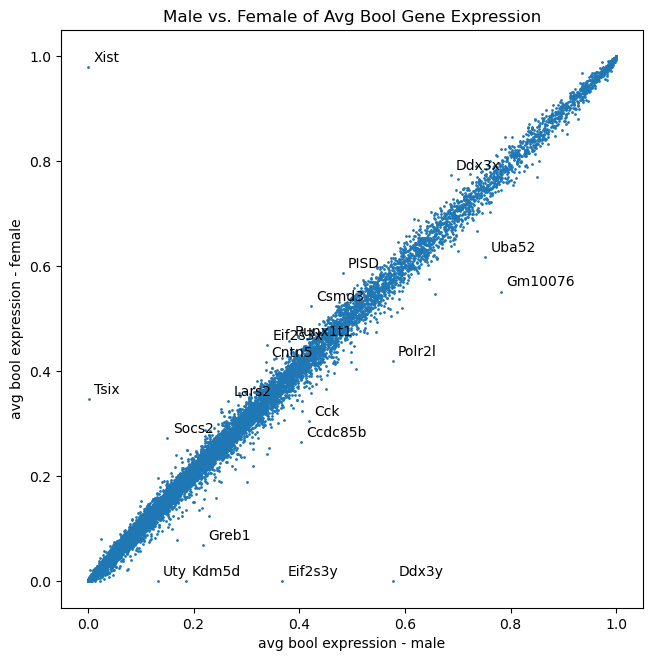

Total genes reduced from 27933 to 14843
removing  5  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']
removing  53  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']
It contains 0 infinite values


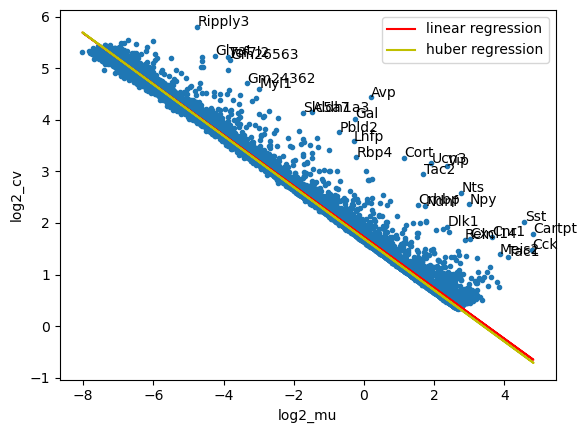

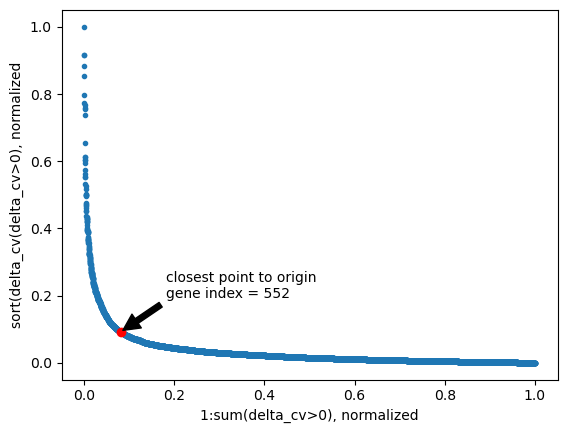

(552, 15039)
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


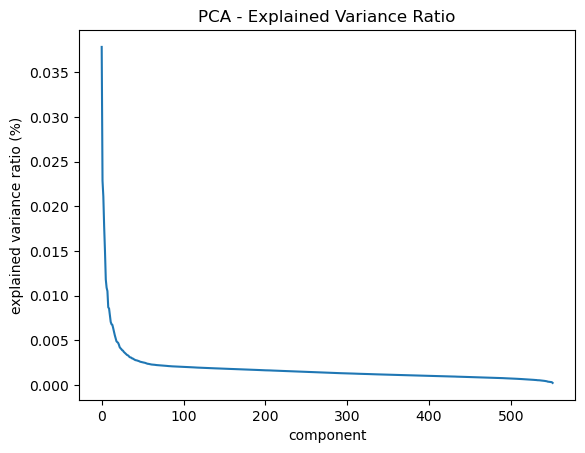

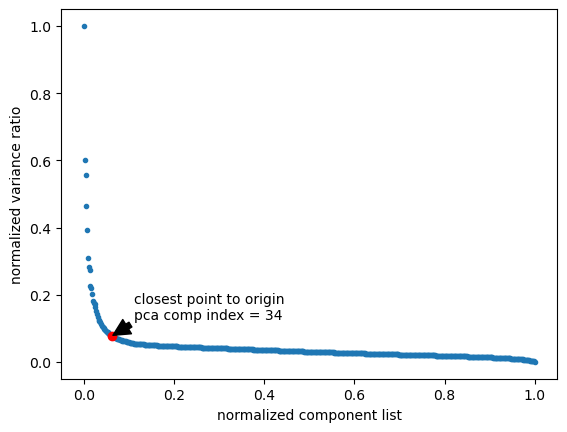

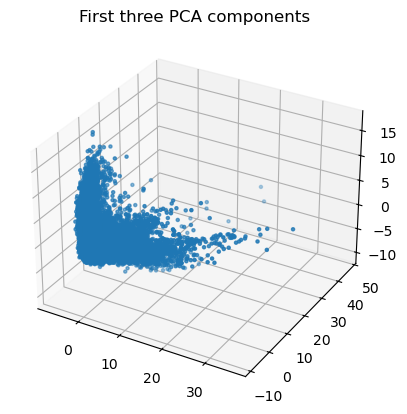

2024-12-31 12:33:37,482 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-31 12:33:38,910 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-31 12:33:38,966 - harmonypy - INFO - Iteration 1 of 20
2024-12-31 12:33:41,943 - harmonypy - INFO - Iteration 2 of 20
2024-12-31 12:33:44,931 - harmonypy - INFO - Iteration 3 of 20
2024-12-31 12:33:46,864 - harmonypy - INFO - Iteration 4 of 20
2024-12-31 12:33:48,217 - harmonypy - INFO - Iteration 5 of 20
2024-12-31 12:33:49,374 - harmonypy - INFO - Iteration 6 of 20
2024-12-31 12:33:50,416 - harmonypy - INFO - Iteration 7 of 20
2024-12-31 12:33:51,571 - harmonypy - INFO - Iteration 8 of 20
2024-12-31 12:33:52,589 - harmonypy - INFO - Iteration 9 of 20
2024-12-31 12:33:53,604 - harmonypy - INFO - Iteration 10 of 20
2024-12-31 12:33:54,623 - harmonypy - INFO - Iteration 11 of 20
2024-12-31 12:33:55,639 - harmonypy - INFO - Converged after 11 iterations


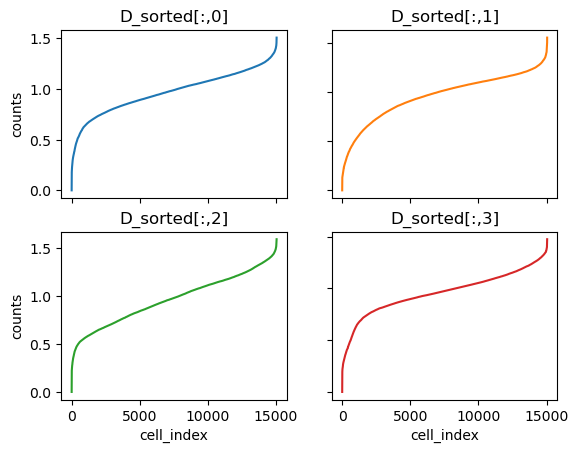

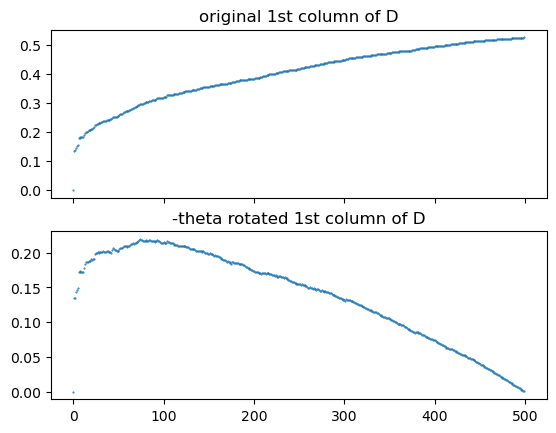

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 51.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


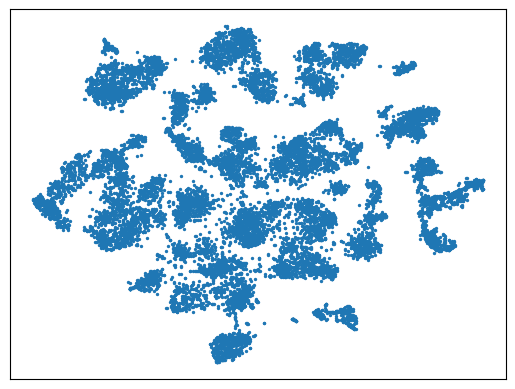

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.0629245489329984

running dbscan with epsilon: 1.0629245489329984  and minpts: 20
Estimated number of clusters: 74
Estimated number of noise points: 1525


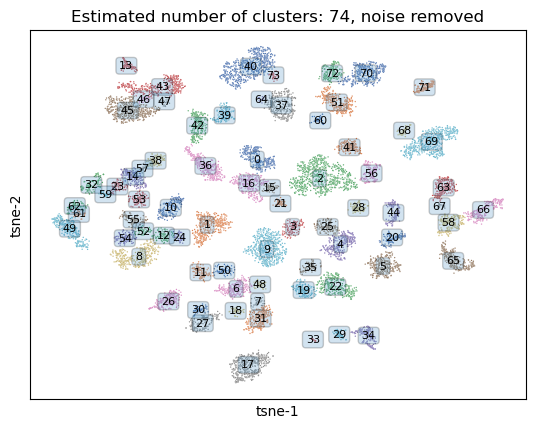

verify raw prelinkage df and raw metadata df have same columns:
True


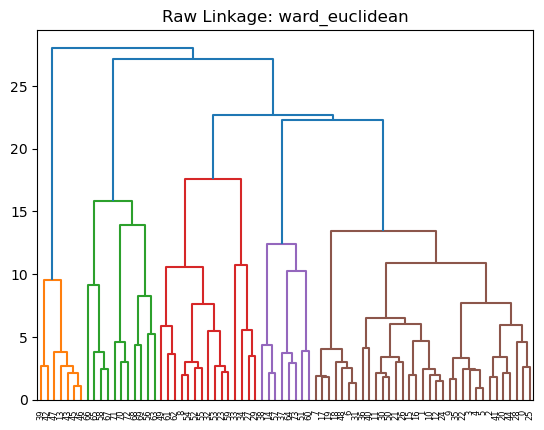

[13 45 46 43 47 42 39 33 34 29 27 32 59 23 53 52 55 54  8 49 61 62 18 31
  6 48 17 19  7 20 44 41  2  0 25 28 22  5  4  3  9 35 50 30 11 26 21 15
 16 10 12 24  1 40 36 64 73 37 51 60 38 57 14 72 70 71 68 69 56 63 67 58
 65 66]


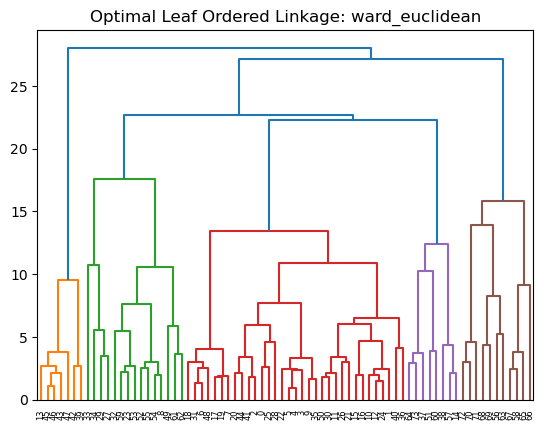

metadata df shape post inter cluster sort
(29, 13514)


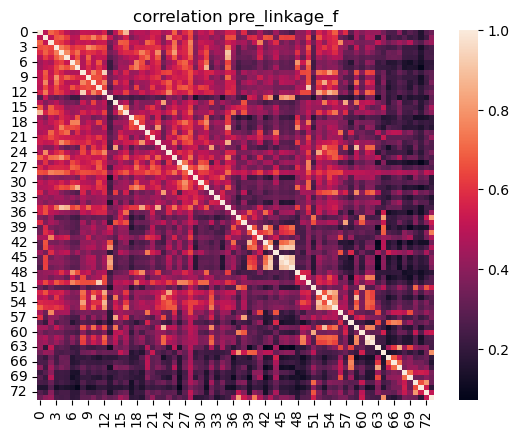

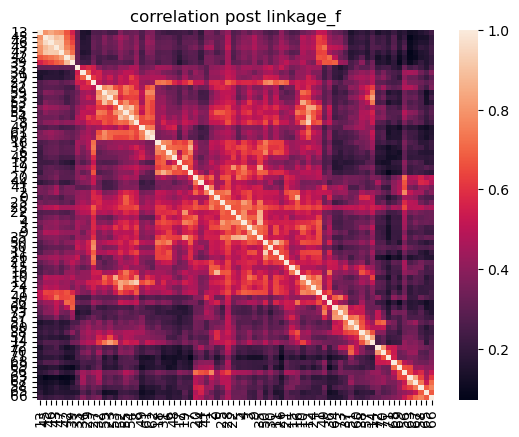

{13: 1, 45: 2, 46: 3, 43: 4, 47: 5, 42: 6, 39: 7, 33: 8, 34: 9, 29: 10, 27: 11, 32: 12, 59: 13, 23: 14, 53: 15, 52: 16, 55: 17, 54: 18, 8: 19, 49: 20, 61: 21, 62: 22, 18: 23, 31: 24, 6: 25, 48: 26, 17: 27, 19: 28, 7: 29, 20: 30, 44: 31, 41: 32, 2: 33, 0: 34, 25: 35, 28: 36, 22: 37, 5: 38, 4: 39, 3: 40, 9: 41, 35: 42, 50: 43, 30: 44, 11: 45, 26: 46, 21: 47, 15: 48, 16: 49, 10: 50, 12: 51, 24: 52, 1: 53, 40: 54, 36: 55, 64: 56, 73: 57, 37: 58, 51: 59, 60: 60, 38: 61, 57: 62, 14: 63, 72: 64, 70: 65, 71: 66, 68: 67, 69: 68, 56: 69, 63: 70, 67: 71, 58: 72, 65: 73, 66: 74}
[0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51
 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73]
check if df plis columns equal metadata df plis columns:
[ True  True  True ...  True  True  True]
len marker_Genes_sorted 242
len marker_genes_sorted_final 242
column (gene) mean after standardization: 0.00
co

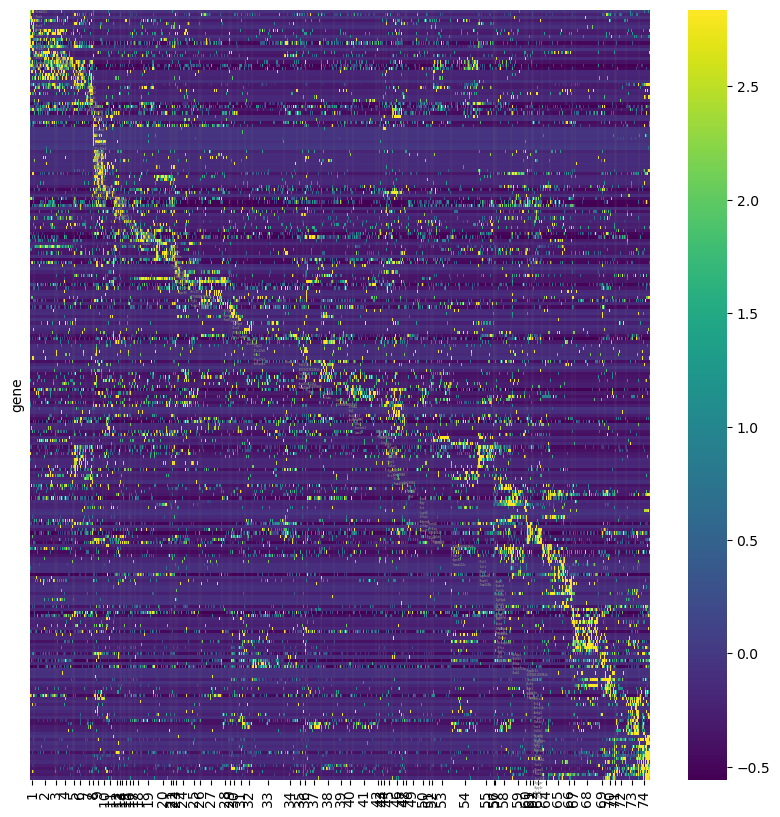

True


In [17]:
%matplotlib inline
#process module
GABA_folder = '/bigdata/isaac/gaba_files/'
GABA_df_marker, GABA_arr_tsne, GABA_meta_data_df_plis, GABA_linkage_cluster_order, GABA_df_marker_log_and_std_col, GABA_df_plis, GABA_cluster_indices, GABA_df_marker_log_and_std, GABA_df_ge = dp_c.process(df_orig, meta_data_df, sex_gene_list, IEG_list, GABA_folder, 'GABA')


/tmp/ipykernel_3115776/2804453544.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(GABA_linkage_cluster_order, rotation = 90)


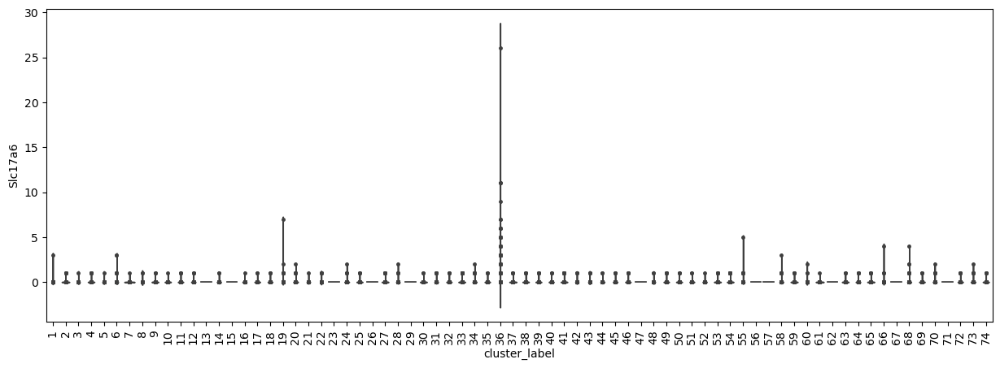

In [183]:
#check some specific expression of genes
gene = 'Slc17a6'
%matplotlib inline
fig,ax = plt.subplots(figsize = (15,5))
sns.violinplot(x=GABA_meta_data_df_plis.T['cluster_label'], y=GABA_df_plis.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(GABA_linkage_cluster_order, rotation = 90)
plt.show()

## 2) Drop clusters, filter heatmap elements

In [18]:
#bring back chat/cluster 8
GABA_clusters_to_drop, GABA_thresh_cells = dp.drop_clusters(GABA_meta_data_df_plis, GABA_linkage_cluster_order, cluster_labels = [70,68,24,19,32,55,36,9,74,4,7,6,66],
                                                  cluster_keepers=[73,69,67,65,58,59,60,54,2,1,53,47,46,45,23,25,34,27,38,31,46,23,59,8],thresh_cells=140)

In [19]:
len([73,69,67,65,58,59,60,54,2,1,53,47,46,45,23,25,34,27,38,31,46,23,59])

23

In [20]:
len(GABA_linkage_cluster_order) - len(GABA_clusters_to_drop)

34

In [21]:
np.all(GABA_df_plis.columns== GABA_meta_data_df_plis.columns)

True

In [23]:

GABA_filtered_folder = '/bigdata/isaac/gaba_files/filtered/'
GABA_df_marker_log_and_std_filtered, GABA_df_marker_log_and_std_col_filtered, GABA_meta_data_df_plis_filtered, GABA_pos_filtered_tmp, GABA_df_plis_filtered,GABA_linkage_cluster_order_filtered,GABA_linkage_cluster_order_filtered_tmp, GABA_change_indices_filtered, GABA_cluster_indices_filtered  = dp.filter_heatmap_elements(GABA_filtered_folder, 'GABA', GABA_clusters_to_drop,
                                                                                                                                                                                                                                        GABA_df_marker_log_and_std,
                                                                                                                                                                                                                                        GABA_meta_data_df_plis,
                                                                                                                                                                                                                                        GABA_df_plis,
                                                                                                                                                                                                                                        GABA_cluster_indices,
                                                                                                                                                                                                                                        GABA_linkage_cluster_order)

True
True
Indices where the value changes: [0, 106, 564, 588, 754, 1060, 1106, 1336, 1783, 1945, 2090, 2246, 2934, 3212, 3511, 3800, 4082, 4582, 4709, 4932, 4989, 5243, 5437, 5828, 6410, 6744, 7032, 7092, 7276, 7454, 7791, 7855, 8002, 8218, 8500]
change_indices_filtered [106, 564, 588, 754, 1060, 1106, 1336, 1783, 1945, 2090, 2246, 2934, 3212, 3511, 3800, 4082, 4582, 4709, 4932, 4989, 5243, 5437, 5828, 6410, 6744, 7032, 7092, 7276, 7454, 7791, 7855, 8002, 8218, 8500]
34
{1: 1, 2: 2, 8: 3, 11: 4, 20: 5, 23: 6, 25: 7, 27: 8, 28: 9, 30: 10, 31: 11, 33: 12, 34: 13, 37: 14, 38: 15, 39: 16, 41: 17, 45: 18, 46: 19, 47: 20, 49: 21, 50: 22, 53: 23, 54: 24, 58: 25, 59: 26, 60: 27, 63: 28, 64: 29, 65: 30, 67: 31, 69: 32, 72: 33, 73: 34}
[1 2 8 11 20 23 25 27 28 30 31 33 34 37 38 39 41 45 46 47 49 50 53 54 58
 59 60 63 64 65 67 69 72 73]


## 3) run rc (recalc) to get filtered df marker, tsne arr

It contains 0 infinite values


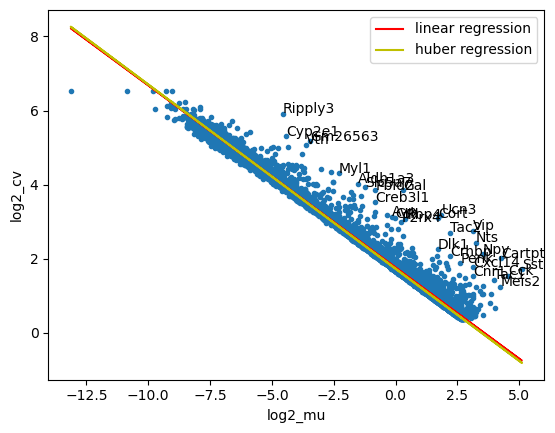

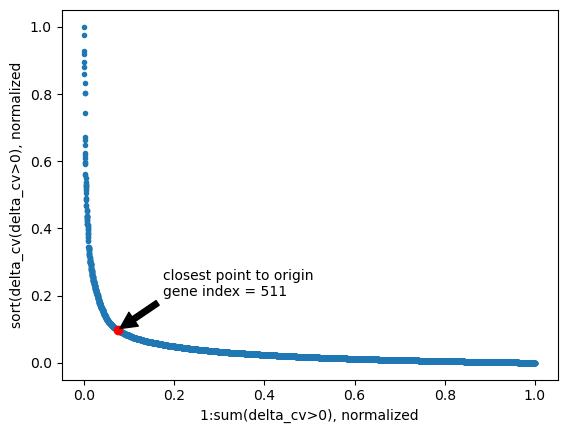

(511, 8501)
True
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


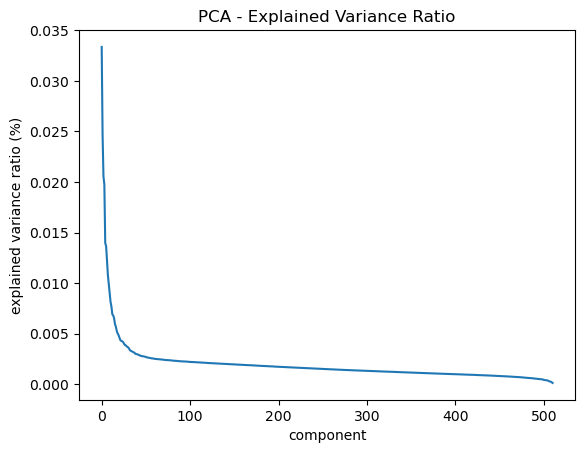

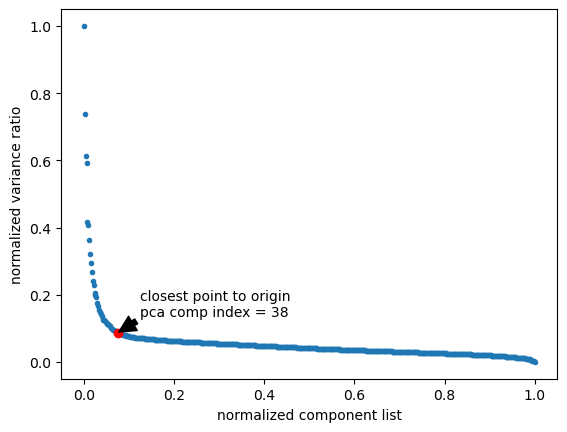

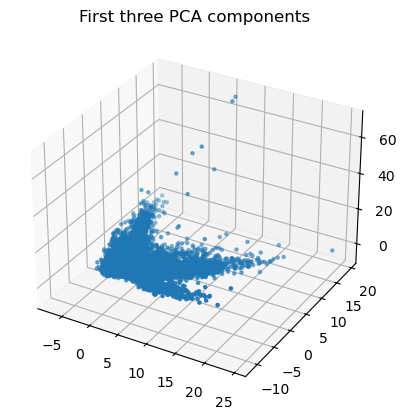

2024-12-31 13:18:21,118 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-31 13:18:22,028 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-31 13:18:22,061 - harmonypy - INFO - Iteration 1 of 20
2024-12-31 13:18:23,953 - harmonypy - INFO - Iteration 2 of 20
2024-12-31 13:18:25,449 - harmonypy - INFO - Iteration 3 of 20
2024-12-31 13:18:26,392 - harmonypy - INFO - Iteration 4 of 20
2024-12-31 13:18:27,164 - harmonypy - INFO - Iteration 5 of 20
2024-12-31 13:18:27,785 - harmonypy - INFO - Iteration 6 of 20
2024-12-31 13:18:28,477 - harmonypy - INFO - Iteration 7 of 20
2024-12-31 13:18:29,123 - harmonypy - INFO - Iteration 8 of 20
2024-12-31 13:18:29,848 - harmonypy - INFO - Converged after 8 iterations


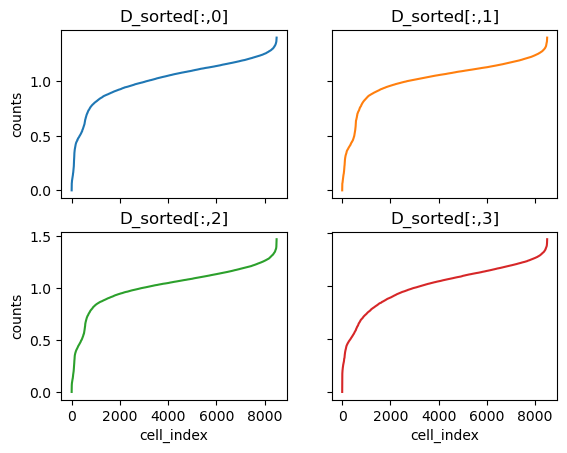

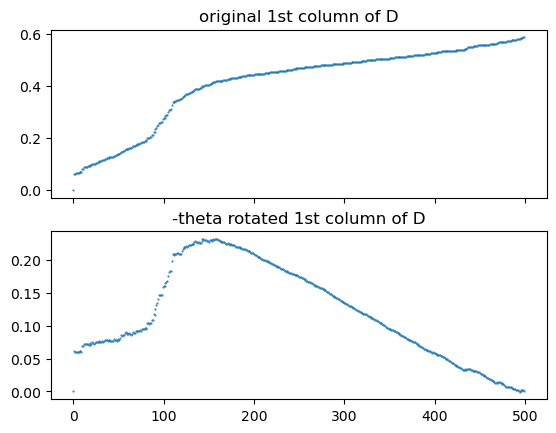

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 52.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


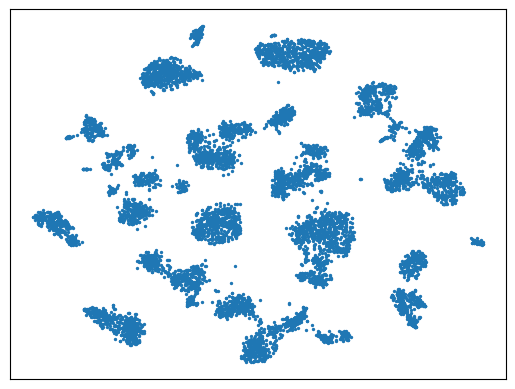

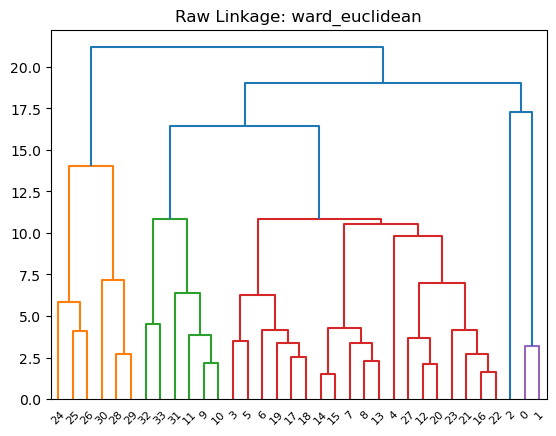

[24 25 26 29 28 30 33 32 11  9 10 31  6 18 17 19  3  5  7  8 13 15 14 23
 16 22 21 20 12 27  4  0  1  2]


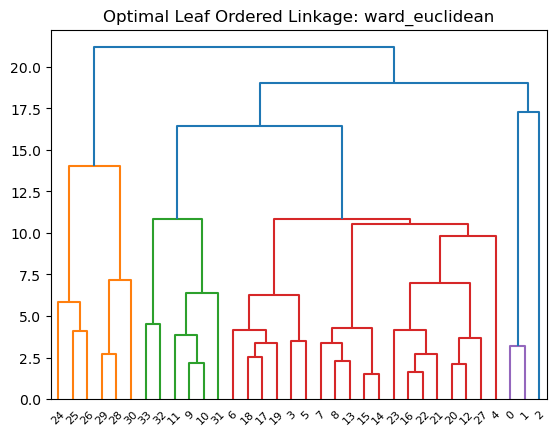

metadata df shape post inter cluster sort
(29, 8501)


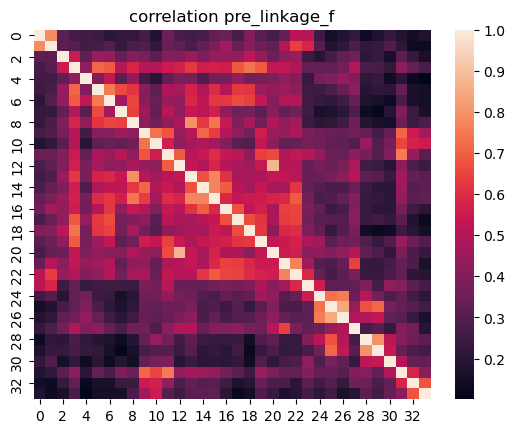

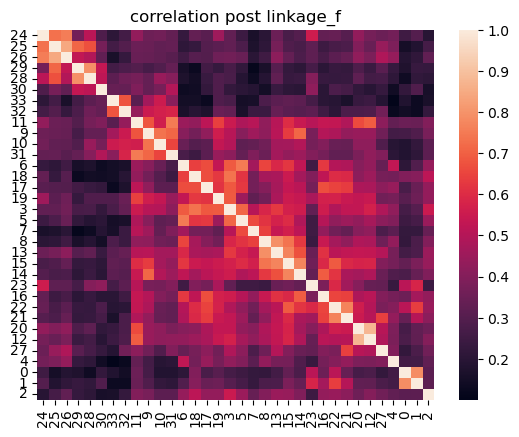

{25: 1, 26: 2, 27: 3, 30: 4, 29: 5, 31: 6, 34: 7, 33: 8, 12: 9, 10: 10, 11: 11, 32: 12, 7: 13, 19: 14, 18: 15, 20: 16, 4: 17, 6: 18, 8: 19, 9: 20, 14: 21, 16: 22, 15: 23, 24: 24, 17: 25, 23: 26, 22: 27, 21: 28, 13: 29, 28: 30, 5: 31, 1: 32, 2: 33, 3: 34}
[1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
 28 29 30 31 32 33 34]
len marker_Genes_sorted 172
len marker_genes_sorted_final 172
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 334, 622, 682, 1019, 1197, 1261, 1544, 1760, 2448, 2593, 2749, 2896, 3126, 3349, 3476, 3533, 3699, 3745, 4192, 4354, 4653, 4935, 5224, 5806, 6306, 6697, 6891, 7145, 7423, 7607, 7913, 8019, 8477, 8500]
[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33]
32
[array([  1,   2,   4, 140]), array([9, 7]), array([  0,   3, 113, 146,  92,  11,   5,  13,  10,   8]), array([15, 18, 16, 17, 24,

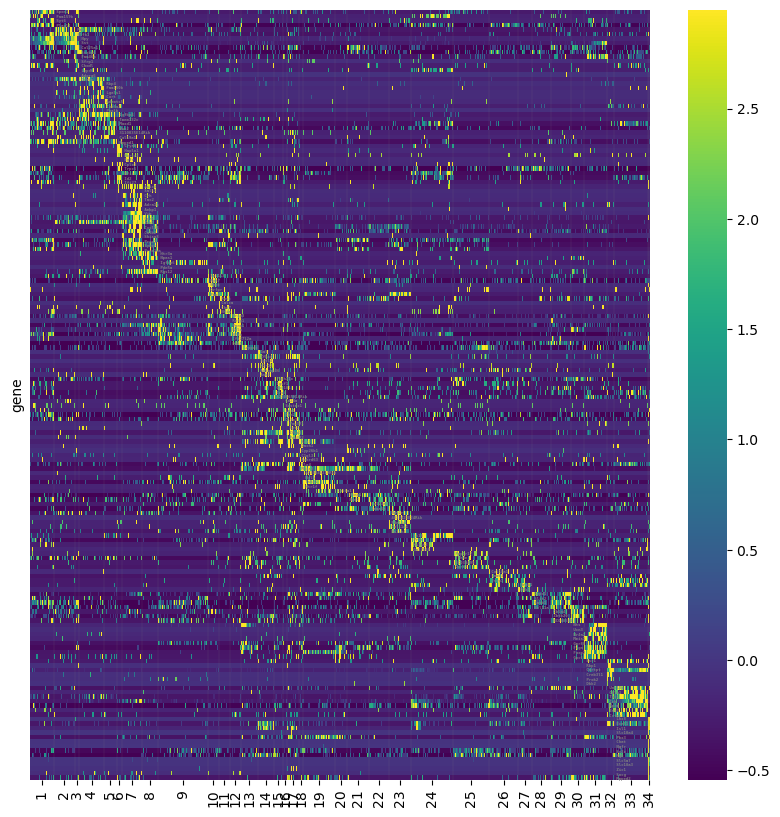

In [53]:
GABA_filtered_folder = '/bigdata/isaac/gaba_files/filtered/'
cell_class = 'GABA'
%matplotlib inline
GABA_df_marker_f, GABA_arr_tsne_f, GABA_meta_data_df_plis_f, GABA_meta_data_df_pca, GABA_mgs_f, GABA_ind_f, GABA_ind_s_f, GABA_df_marker_log_and_std_col_f, GABA_pos_f, GABA_linkage_cluster_order_filtered, GABA_change_indices_f, GABA_hm_arr, GABA_arr_pca = dp_rc.reprocess(GABA_df_ge,GABA_meta_data_df_plis_filtered,GABA_linkage_cluster_order_filtered,GABA_cluster_indices_filtered,GABA_filtered_folder,cell_class, sort = True, write_to_file=False)
 

In [150]:
GABA_meta_data_df_plis_filtered.loc[:,GABA_meta_data_df_plis_filtered.loc['cluster_label',:]==24].shape[1]

582

In [ ]:
GABA

In [158]:
'Foxp2' in GABA_df_plis_filtered.index

True

In [374]:
np.all(GABA_df_marker_f.columns == GABA_meta_data_df_plis_f.columns)

True

## 4) Add cluster labels (manual)

In [27]:
GABA_filtered_folder = '/bigdata/isaac/gaba_files/filtered/'
GABA_labels = dp.get_cluster_labels(GABA_filtered_folder, 'GABA_filtered_labels_rc.csv')
GABA_labels

['Sst-Npy-Spon1',
 'Sst-Npy-Maf',
 'Sst-Npy-Chodl',
 'Moxd1-Pvalb',
 'Moxd1-Vwc2',
 'Hapln1-Cryab',
 'Vip-Crh',
 'Htr3a-Rgs12',
 'Dab1-Myh7',
 'Pax6-Npnt',
 'Pax6-Calca',
 'Sncg-Reln',
 'Fign-Lrpprc',
 'Isl1-Gal',
 'Igsf1-Zfhx3',
 'Lmo1-Chn2',
 'Isl1-Pou3f2',
 'Meis2-Dach1',
 'Meis2-Tshz1',
 'Meis2-Foxp2',
 'Meis2-Nwd2',
 'Col23a1-Hs3st4',
 'Pde11a-Npy2r',
 'Prlr-St18',
 'Oprk1-Trhde',
 'Col18a1-Jsrp1',
 'Greb1-Dlk1',
 'Lypd1-Satb1',
 'Lpyd1-Unc13c',
 'Cbln4-Zbtb20',
 'Fign-Foxp2',
 'Cartpt-Dkk2',
 'Cartpt-Unc13c',
 'Chat-Slc5a7']

### add label markers to plis filtered metadata

In [29]:
GABA_meta_data_df_plis_f_markers = dp.update_metadata_w_markers(GABA_filtered_folder, 
                                                                         GABA_meta_data_df_plis_f,
                                                                         GABA_linkage_cluster_order_filtered,
                                                                         GABA_labels,
                                                                         'GABA',
                                                                        write_to_file = True)

In [30]:
GABA_meta_data_df_plis_f_markers.tail()

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CCGCAAGGTGTTATCG-1_10X36_1,GCAACATAGATCGACG-1_10X51_2,ACACCAATCTACCCAC-1_10X52_2,TGCTCCAAGAGGCGTT-1_10X51_1,CGAGTGCAGGCAGTCA-1_10X37_2,GTTCGCTCACCCTCTA-1_10X35_2,AAGATAGGTAACACCT-1_10X37_2,CAACAACAGACATATG-1_10X35_2,GTAGATCGTTGACGGA-1_10X51_3,GATGAGGGTATAATGG-1_10X52_2
lengthbp_seqlib,507.0,440.0,440.0,507.0,474.0,466.0,474.0,416.0,486.0,415.0,...,476.0,474.0,440.0,478.0,460.0,461.0,460.0,461.0,487.0,440.0
Sample_Index,F12,E12,E12,F12,A2,D12,A2,D9,A9,C9,...,H8,A2,E12,G1,F9,G8,F9,G8,B2,E12
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA
cluster_label,1,1,1,1,1,1,1,1,1,1,...,34,34,34,34,34,34,34,34,34,34
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7,Chat-Slc5a7


### updated heatmap

[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33]
32
[array([  1,   2,   4, 140]), array([9, 7]), array([  0,   3, 113, 146,  92,  11,   5,  13,  10,   8]), array([15, 18, 16, 17, 24, 19, 14]), array([20, 23, 25, 26, 21, 22,  6]), array([ 28,  27,  31,  30,  29, 147, 127,  50,  49]), array([ 44,  35,  34,  37,  36,  33,  32,  38,  39, 118,  63,  60, 112,
        57, 110]), array([40, 43, 46, 41, 42]), array([56, 52, 53, 54, 55]), array([116,  59,  62,  61]), array([64, 67, 68, 65, 51, 45, 48]), array([71]), array([ 78,  82,  77,  81, 138,  79]), array([88, 86, 85, 87, 72]), array([90, 91, 89, 93, 94]), array([95, 97, 83, 12]), array([ 73,  98,  99, 100, 101,  75,  76]), array([102,  47, 104, 103]), array([106]), array([109, 111]), array([114, 119]), array([123, 120, 121, 122, 115]), array([124, 128, 126, 125]), array([129, 132, 131, 130]), array([135, 117, 136]), array([137, 141]), array([144, 149, 145, 150]), array(

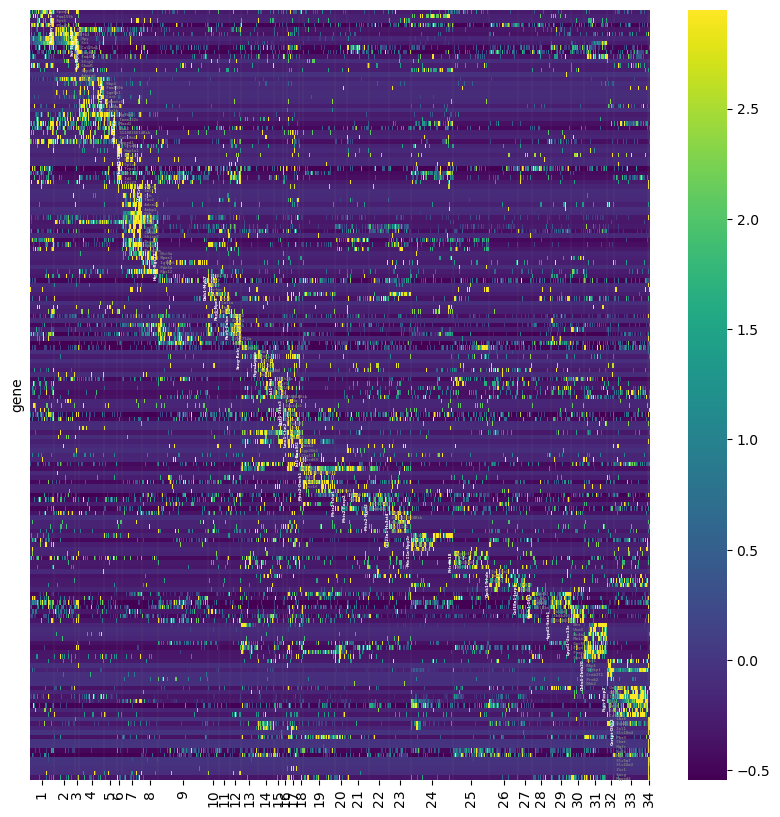

In [467]:
#plot heatmap w/ labels
%matplotlib inline
linkage_alg = 'ward'
dist_metric = 'euclidean'
GABA_tg_f, GABA_tgfs_f = dp.get_heatmap_labels(GABA_mgs_f, GABA_ind_f, GABA_ind_s_f)
#sanity check - plotting only filtered gaba_df (clusters removed)
dp.plot_marker_heatmap(GABA_df_marker_log_and_std_col_f, 
                       GABA_pos_f, 
                       GABA_linkage_cluster_order_filtered, 
                       GABA_change_indices_f, 
                       GABA_tg_f, 
                       GABA_tgfs_f, 
                       linkage_alg,
                       dist_metric,
                       GABA_filtered_folder,
                       fs_waterfall = 2.9,
                       cluster_labels = GABA_labels,
                       savefig = True,
                       cell_class = 'GABA_filtered_tg_reenrich_labeled')


## 5) Updated TSNE Plot

In [ ]:
GABA_label_color_df = pd.read_excel(GABA_filtered_folder + 'GABA_filtered_labels_rc.xlsx')
GABA_m_2_c_dict = dict(zip(GABA_label_color_df.loc[:,'markers'],GABA_label_color_df.loc[:,'hex']))

#resort tsne index to match index of final labeled metadata
GABA_tsne_arr_tmp = pd.DataFrame(index=GABA_meta_data_df_plis_filtered.columns, data=GABA_arr_tsne_f)
GABA_tsne_arr_tmp_ri = GABA_tsne_arr_tmp.reindex(index = GABA_meta_data_df_plis_f_markers.columns)

dp.plot_rc_tsne(GABA_meta_data_df_plis_f_markers,GABA_tsne_arr_tmp_ri.values,'GABA_TSNE_m2c', GABA_filtered_folder,m_2_c_dict = GABA_m_2_c_dict,savefig=True)


<IPython.core.display.Javascript object>

In [108]:
GABA_meta_data_df_plis_f_markers

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CCGCAAGGTGTTATCG-1_10X36_1,GCAACATAGATCGACG-1_10X51_2,ACACCAATCTACCCAC-1_10X52_2,TGCTCCAAGAGGCGTT-1_10X51_1,CGAGTGCAGGCAGTCA-1_10X37_2,GTTCGCTCACCCTCTA-1_10X35_2,AAGATAGGTAACACCT-1_10X37_2,CAACAACAGACATATG-1_10X35_2,GTAGATCGTTGACGGA-1_10X51_3,GATGAGGGTATAATGG-1_10X52_2
Serial_Number,103.0,102.0,102.0,103.0,98.0,101.0,98.0,63.0,66.0,70.0,...,65.0,98.0,102.0,97.0,68.0,64.0,68.0,64.0,99.0,102.0
Date_Captured,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,2019-11-20,2019-11-24,2019-12-01,...,2019-11-24,05/31/20,05/31/20,05/31/20,2019-11-25,2019-11-20,2019-11-25,2019-11-20,05/31/20,05/31/20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,,,,...,,C57Bl/6,C57Bl/6,C57Bl/6,,,,,C57Bl/6,C57Bl/6
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Breeder-M,Breeder-F,Breeder-F,Breeder-M,Breeder-F,Breeder-F,Breeder-F,Naïve-F,Naïve-M,Naïve-F,...,Naïve-M,Breeder-F,Breeder-F,Breeder-F,Naïve-M,Naïve-F,Naïve-M,Naïve-F,Breeder-M,Breeder-F
ChipID,10X52,10X52,10X52,10X52,10X51,10X52,10X51,10X35,10X36,10X38,...,10X36,10X51,10X52,10X51,10X37,10X35,10X37,10X35,10X51,10X52
SampleID,10X52_3,10X52_2,10X52_2,10X52_3,10X51_2,10X52_1,10X51_2,10X35_1,10X36_2,10X38_2,...,10X36_1,10X51_2,10X52_2,10X51_1,10X37_2,10X35_2,10X37_2,10X35_2,10X51_3,10X52_2
DonorID,DI-B3-M,DI-B3-F,DI-B3-F,DI-B3-M,DI-B1-F,DI-B3-F,DI-B1-F,"DI1,DI2",DI3,DI6,...,DI3,DI-B1-F,DI-B3-F,DI-B1-F,"DI4,DI5","DI1,DI2","DI4,DI5","DI1,DI2",DI-B1-M,DI-B3-F


In [110]:
np.all(GABA_tsne_arr_tmp_ri.index == GABA_meta_data_df_plis_f_markers.columns)

True

In [112]:
GABA_meta_data_df_plis_f_markers.loc[:,GABA_meta_data_df_plis_f_markers.loc['markers',:]=='Cartpt-Unc13c']

,CTAACTTTCGATGCTA-1_10X51_1,TGCTTGCCACGAAGAC-1_10X51_1,CAGTGCGGTCAATGGG-1_10X52_2,CATGCAATCCACTTTA-1_10X52_1,CTACCCATCTCCATAT-1_10X52_3,TCGGATACACTTCAGA-1_10X52_3,AGACTCAGTGCTTATG-1_10X52_2,GATCCCTGTTTGGGAG-1_10X35_1,AGAGCAGTCCCTCATG-1_10X35_1,GAGTGAGAGCTGCCTG-1_10X51_2,...,AAGGAATTCGTTCGCT-1_10X52_4,CGGGTCACAAAGTGTA-1_10X36_1,CATGCTCTCCGAAATC-1_10X37_2,AGTCACATCCCTGGTT-1_10X36_2,TGTCCCAGTTGGAGAC-1_10X35_2,CAAGGGACACTTGGGC-1_10X38_1,TGGTACAAGAACTCCT-1_10X51_1,AGGTCATAGCGTTAGG-1_10X36_2,TACGCTCCACAGTCCG-1_10X52_3,TGTCCACAGCTATCTG-1_10X37_2
Serial_Number,97.0,97.0,102.0,101.0,103.0,103.0,102.0,63.0,63.0,98.0,...,104.0,65.0,68.0,66.0,64.0,69.0,97.0,66.0,103.0,68.0
Date_Captured,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,2019-11-20,2019-11-20,05/31/20,...,05/31/20,2019-11-24,2019-11-25,2019-11-24,2019-11-20,2019-12-01,05/31/20,2019-11-24,05/31/20,2019-11-25
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,,,C57Bl/6,...,C57Bl/6,,,,,,C57Bl/6,,C57Bl/6,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Breeder-F,Breeder-F,Breeder-F,Breeder-F,Breeder-M,Breeder-M,Breeder-F,Naïve-F,Naïve-F,Breeder-F,...,Breeder-M,Naïve-M,Naïve-M,Naïve-M,Naïve-F,Naïve-F,Breeder-F,Naïve-M,Breeder-M,Naïve-M
ChipID,10X51,10X51,10X52,10X52,10X52,10X52,10X52,10X35,10X35,10X51,...,10X52,10X36,10X37,10X36,10X35,10X38,10X51,10X36,10X52,10X37
SampleID,10X51_1,10X51_1,10X52_2,10X52_1,10X52_3,10X52_3,10X52_2,10X35_1,10X35_1,10X51_2,...,10X52_4,10X36_1,10X37_2,10X36_2,10X35_2,10X38_1,10X51_1,10X36_2,10X52_3,10X37_2
DonorID,DI-B1-F,DI-B1-F,DI-B3-F,DI-B3-F,DI-B3-M,DI-B3-M,DI-B3-F,"DI1,DI2","DI1,DI2",DI-B1-F,...,DI-B3-M,DI3,"DI4,DI5",DI3,"DI1,DI2",DI6,DI-B1-F,DI3,DI-B3-M,"DI4,DI5"


In [119]:
GABA_meta_data_df_plis_f_markers

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CCGCAAGGTGTTATCG-1_10X36_1,GCAACATAGATCGACG-1_10X51_2,ACACCAATCTACCCAC-1_10X52_2,TGCTCCAAGAGGCGTT-1_10X51_1,CGAGTGCAGGCAGTCA-1_10X37_2,GTTCGCTCACCCTCTA-1_10X35_2,AAGATAGGTAACACCT-1_10X37_2,CAACAACAGACATATG-1_10X35_2,GTAGATCGTTGACGGA-1_10X51_3,GATGAGGGTATAATGG-1_10X52_2
Serial_Number,103.0,102.0,102.0,103.0,98.0,101.0,98.0,63.0,66.0,70.0,...,65.0,98.0,102.0,97.0,68.0,64.0,68.0,64.0,99.0,102.0
Date_Captured,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,2019-11-20,2019-11-24,2019-12-01,...,2019-11-24,05/31/20,05/31/20,05/31/20,2019-11-25,2019-11-20,2019-11-25,2019-11-20,05/31/20,05/31/20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,,,,...,,C57Bl/6,C57Bl/6,C57Bl/6,,,,,C57Bl/6,C57Bl/6
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Breeder-M,Breeder-F,Breeder-F,Breeder-M,Breeder-F,Breeder-F,Breeder-F,Naïve-F,Naïve-M,Naïve-F,...,Naïve-M,Breeder-F,Breeder-F,Breeder-F,Naïve-M,Naïve-F,Naïve-M,Naïve-F,Breeder-M,Breeder-F
ChipID,10X52,10X52,10X52,10X52,10X51,10X52,10X51,10X35,10X36,10X38,...,10X36,10X51,10X52,10X51,10X37,10X35,10X37,10X35,10X51,10X52
SampleID,10X52_3,10X52_2,10X52_2,10X52_3,10X51_2,10X52_1,10X51_2,10X35_1,10X36_2,10X38_2,...,10X36_1,10X51_2,10X52_2,10X51_1,10X37_2,10X35_2,10X37_2,10X35_2,10X51_3,10X52_2
DonorID,DI-B3-M,DI-B3-F,DI-B3-F,DI-B3-M,DI-B1-F,DI-B3-F,DI-B1-F,"DI1,DI2",DI3,DI6,...,DI3,DI-B1-F,DI-B3-F,DI-B1-F,"DI4,DI5","DI1,DI2","DI4,DI5","DI1,DI2",DI-B1-M,DI-B3-F


Visualize single cluster on tsne with colors for each group

In [149]:
#cluster = 'Cartpt-Unc13c'
cluster = 'Prlr-St18'
#x = GABA_tsne_arr_tmp_ri.loc[GABA_meta_data_df_plis_f_markers.loc['markers',:]==cluster,:][0]
#y = GABA_tsne_arr_tmp_ri.loc[GABA_meta_data_df_plis_f_markers.loc['markers',:]==cluster,:][1]
x_bm = GABA_tsne_arr_tmp_ri.iloc[np.where((GABA_meta_data_df_plis_f_markers.loc['Group',:]=='Breeder-M') & (GABA_meta_data_df_plis_f_markers.loc['markers',:]==cluster))[0],:][0]
y_bm = GABA_tsne_arr_tmp_ri.iloc[np.where((GABA_meta_data_df_plis_f_markers.loc['Group',:]=='Breeder-M') & (GABA_meta_data_df_plis_f_markers.loc['markers',:]==cluster))[0],:][1]
x_bf = GABA_tsne_arr_tmp_ri.iloc[np.where((GABA_meta_data_df_plis_f_markers.loc['Group',:]=='Breeder-F') & (GABA_meta_data_df_plis_f_markers.loc['markers',:]==cluster))[0],:][0]
y_bf = GABA_tsne_arr_tmp_ri.iloc[np.where((GABA_meta_data_df_plis_f_markers.loc['Group',:]=='Breeder-F') & (GABA_meta_data_df_plis_f_markers.loc['markers',:]==cluster))[0],:][1]
x_nm = GABA_tsne_arr_tmp_ri.iloc[np.where((GABA_meta_data_df_plis_f_markers.loc['Group',:]=='Naïve-M') & (GABA_meta_data_df_plis_f_markers.loc['markers',:]==cluster))[0],:][0]
y_nm = GABA_tsne_arr_tmp_ri.iloc[np.where((GABA_meta_data_df_plis_f_markers.loc['Group',:]=='Naïve-M') & (GABA_meta_data_df_plis_f_markers.loc['markers',:]==cluster))[0],:][1]
x_nf = GABA_tsne_arr_tmp_ri.iloc[np.where((GABA_meta_data_df_plis_f_markers.loc['Group',:]=='Naïve-F') & (GABA_meta_data_df_plis_f_markers.loc['markers',:]==cluster))[0],:][0]
y_nf = GABA_tsne_arr_tmp_ri.iloc[np.where((GABA_meta_data_df_plis_f_markers.loc['Group',:]=='Naïve-F') & (GABA_meta_data_df_plis_f_markers.loc['markers',:]==cluster))[0],:][1]


fig,ax = plt.subplots()
ax.scatter(x_bf,y_bf, s = 1, label = 'Breeder-F', c = 'blue')
ax.scatter(x_bm,y_bm, s = 1, label = 'Breeder-M', c = 'orange')
ax.scatter(x_nf,y_nf, s = 1, label = 'Naïve-F', c = 'green')
ax.scatter(x_nm,y_nm, s = 1, label = 'Naïve-M', c = 'red')
ax.legend(markerscale=2 )
ax.axis('off')

plt.show()
plt.savefig('/bigdata/isaac/gaba_files/sex_stats/tmp/tsne_groups_colored_'+cluster + '.pdf')


<IPython.core.display.Javascript object>

In [40]:
GABA_meta_data_df_plis_f_markers.loc[:,GABA_meta_data_df_plis_f_markers.loc['markers',:]== 'Chat-Slc5a7']

,ATTCCTAAGTACTGGG-1_10X37_2,CTGCTCATCCGATCGG-1_10X38_1,ATGACCATCGTGAGAG-1_10X51_1,GAGGGATGTATGCTAC-1_10X35_1,CAGGGCTGTATCTTCT-1_10X51_1,GCAGCTGTCCCGTTGT-1_10X52_1,AACCCAAAGAAATGGG-1_10X35_2,CTTGATTTCTTCACGC-1_10X35_2,TGATTCTTCTCGAACA-1_10X52_2,ATAGGCTTCCTGGGAC-1_10X36_1,...,CCGCAAGGTGTTATCG-1_10X36_1,GCAACATAGATCGACG-1_10X51_2,ACACCAATCTACCCAC-1_10X52_2,TGCTCCAAGAGGCGTT-1_10X51_1,CGAGTGCAGGCAGTCA-1_10X37_2,GTTCGCTCACCCTCTA-1_10X35_2,AAGATAGGTAACACCT-1_10X37_2,CAACAACAGACATATG-1_10X35_2,GTAGATCGTTGACGGA-1_10X51_3,GATGAGGGTATAATGG-1_10X52_2
Serial_Number,68.0,69.0,97.0,63.0,97.0,101.0,64.0,64.0,102.0,65.0,...,65.0,98.0,102.0,97.0,68.0,64.0,68.0,64.0,99.0,102.0
Date_Captured,2019-11-25,2019-12-01,05/31/20,2019-11-20,05/31/20,05/31/20,2019-11-20,2019-11-20,05/31/20,2019-11-24,...,2019-11-24,05/31/20,05/31/20,05/31/20,2019-11-25,2019-11-20,2019-11-25,2019-11-20,05/31/20,05/31/20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,,C57Bl/6,,C57Bl/6,C57Bl/6,,,C57Bl/6,,...,,C57Bl/6,C57Bl/6,C57Bl/6,,,,,C57Bl/6,C57Bl/6
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-M,Naïve-F,Breeder-F,Naïve-F,Breeder-F,Breeder-F,Naïve-F,Naïve-F,Breeder-F,Naïve-M,...,Naïve-M,Breeder-F,Breeder-F,Breeder-F,Naïve-M,Naïve-F,Naïve-M,Naïve-F,Breeder-M,Breeder-F
ChipID,10X37,10X38,10X51,10X35,10X51,10X52,10X35,10X35,10X52,10X36,...,10X36,10X51,10X52,10X51,10X37,10X35,10X37,10X35,10X51,10X52
SampleID,10X37_2,10X38_1,10X51_1,10X35_1,10X51_1,10X52_1,10X35_2,10X35_2,10X52_2,10X36_1,...,10X36_1,10X51_2,10X52_2,10X51_1,10X37_2,10X35_2,10X37_2,10X35_2,10X51_3,10X52_2
DonorID,"DI4,DI5",DI6,DI-B1-F,"DI1,DI2",DI-B1-F,DI-B3-F,"DI1,DI2","DI1,DI2",DI-B3-F,DI3,...,DI3,DI-B1-F,DI-B3-F,DI-B1-F,"DI4,DI5","DI1,DI2","DI4,DI5","DI1,DI2",DI-B1-M,DI-B3-F


In [52]:
GABA_arr_pca.shape

(8501, 38)

In [50]:
GABA_hm_arr

array([[-4.61396799,  9.5978453 ,  4.88897742, ..., -0.65920644,
         0.25380191,  0.74308345],
       [-4.76937753, 10.39264911,  5.61618183, ..., -0.27665853,
        -0.59476684,  0.20341588],
       [-4.38172968,  8.84325927,  7.39924274, ...,  0.09387896,
         2.03786232,  2.07606329],
       ...,
       [14.54239399, -7.5017202 , 11.93689384, ...,  1.4486017 ,
         3.40652301, -0.64152354],
       [12.77647759, -8.57201818,  9.8528755 , ...,  2.5400741 ,
         0.73486275, -1.00430544],
       [11.80563772, -7.8565892 , 11.23891603, ...,  3.53930396,
         3.47157271,  0.17304878]])

In [47]:
np.all(GABA_meta_data_df_pca.T.columns == GABA_meta_data_df_plis_filtered.columns)

True

In [63]:
GABA_meta_data_df_plis_filtered_tsne.loc[:,GABA_meta_data_df_plis_filtered_tsne.loc['markers',:]== 'Chat-Slc5a7']

,TTACGTTCATTCAGCA-1_10X35_1,CGAGTGCTCACCATAG-1_10X35_1,TCGAACAAGGCTTAAA-1_10X37_2,TCATACTAGCGCACAA-1_10X36_2,AGTGCCGCATCTAGAC-1_10X35_2,TCTAACTTCGACGATT-1_10X35_2,TGCTCGTAGCGTTGTT-1_10X37_1,TAGGGTTTCGTAGTCA-1_10X35_1,GCCAGCATCACTTGGA-1_10X37_1,CGGTCAGTCCGTTGGG-1_10X36_2,...,CTGGCAGTCCCTTCCC-1_10X35_2,AAGACTCCATGTGCTA-1_10X38_1,CCACGTTAGCGATGCA-1_10X51_2,AACCCAACAACCCTCT-1_10X35_2,TGTTGGACACAGGATG-1_10X38_1,GGTGAAGGTAACGGTG-1_10X35_2,ATTCCCGCAGATGCGA-1_10X38_1,CGGAATTCACCGAATT-1_10X38_1,TCTATACGTCGTATTG-1_10X51_1,AGGTCATAGGATCACG-1_10X35_1
Serial_Number,63.0,63.0,68.0,66.0,64.0,64.0,67.0,63.0,67.0,66.0,...,64.0,69.0,98.0,64.0,69.0,64.0,69.0,69.0,97.0,63.0
Date_Captured,2019-11-20,2019-11-20,2019-11-25,2019-11-24,2019-11-20,2019-11-20,2019-11-25,2019-11-20,2019-11-25,2019-11-24,...,2019-11-20,2019-12-01,05/31/20,2019-11-20,2019-12-01,2019-11-20,2019-12-01,2019-12-01,05/31/20,2019-11-20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,,,,,,,,,,...,,,C57Bl/6,,,,,,C57Bl/6,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-F,Naïve-F,Naïve-M,Naïve-M,Naïve-F,Naïve-F,Naïve-M,Naïve-F,Naïve-M,Naïve-M,...,Naïve-F,Naïve-F,Breeder-F,Naïve-F,Naïve-F,Naïve-F,Naïve-F,Naïve-F,Breeder-F,Naïve-F
ChipID,10X35,10X35,10X37,10X36,10X35,10X35,10X37,10X35,10X37,10X36,...,10X35,10X38,10X51,10X35,10X38,10X35,10X38,10X38,10X51,10X35
SampleID,10X35_1,10X35_1,10X37_2,10X36_2,10X35_2,10X35_2,10X37_1,10X35_1,10X37_1,10X36_2,...,10X35_2,10X38_1,10X51_2,10X35_2,10X38_1,10X35_2,10X38_1,10X38_1,10X51_1,10X35_1
DonorID,"DI1,DI2","DI1,DI2","DI4,DI5",DI3,"DI1,DI2","DI1,DI2","DI4,DI5","DI1,DI2","DI4,DI5",DI3,...,"DI1,DI2",DI6,DI-B1-F,"DI1,DI2",DI6,"DI1,DI2",DI6,DI6,DI-B1-F,"DI1,DI2"


<Figure size 1000x1000 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

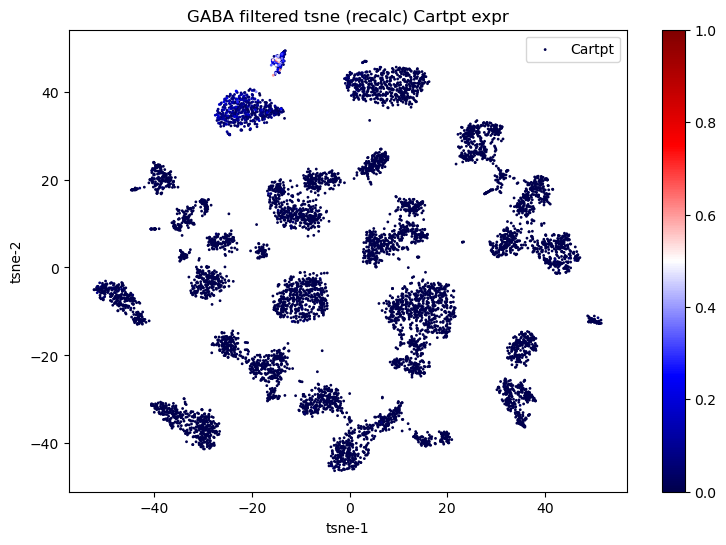

In [168]:
marker_name = 'Cartpt'
dp.plot_rc_tsne_marker(GABA_meta_data_df_plis_f_markers,GABA_tsne_arr_tmp_ri.values,GABA_df_marker_f,marker_name,'GABA', GABA_filtered_folder, savefig=False)

### 6) Violin Plots using scanpy's stacked violin wrapper

In [556]:
GABA_adata_f = ad.AnnData(GABA_df_marker_f.T)
#add aligned metadata
for x in GABA_meta_data_df_plis_f_markers.index:
    GABA_adata_f.obs[str(x)] = GABA_meta_data_df_plis_f_markers.loc[str(x),:]

GABA_markers = GABA_adata_f.obs['markers']
_, idx = np.unique(GABA_adata_f.obs['markers'], return_index=True)
GABA_markers = list(GABA_markers[np.sort(idx)])

/tmp/ipykernel_3115776/710482852.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  GABA_markers = list(GABA_markers[np.sort(idx)])


In [538]:
GABA_adata_f.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 8501 × 172
    obs: 'Serial_Number', 'Date_Captured', 'Species', 'Transcriptome', 'Strain', 'Project', 'Group', 'ChipID', 'SampleID', 'DonorID', 'Age', 'Num_Pooled_Animals', 'Sex', 'Tissue', 'Cell_Conc', 'Target_Num_Cells', 'PCR_Cycles', 'Comments', 'cDNA_Lib_Ok', 'ngperul_cDNA', 'Avesizebp_cDNAlib', 'Date', 'cDNAul', 'LIbConstructionComment', 'ngperul_seqlib', 'lengthbp_seqlib', 'Sample_Index', 'cell_class', 'cluster_label', 'markers'>

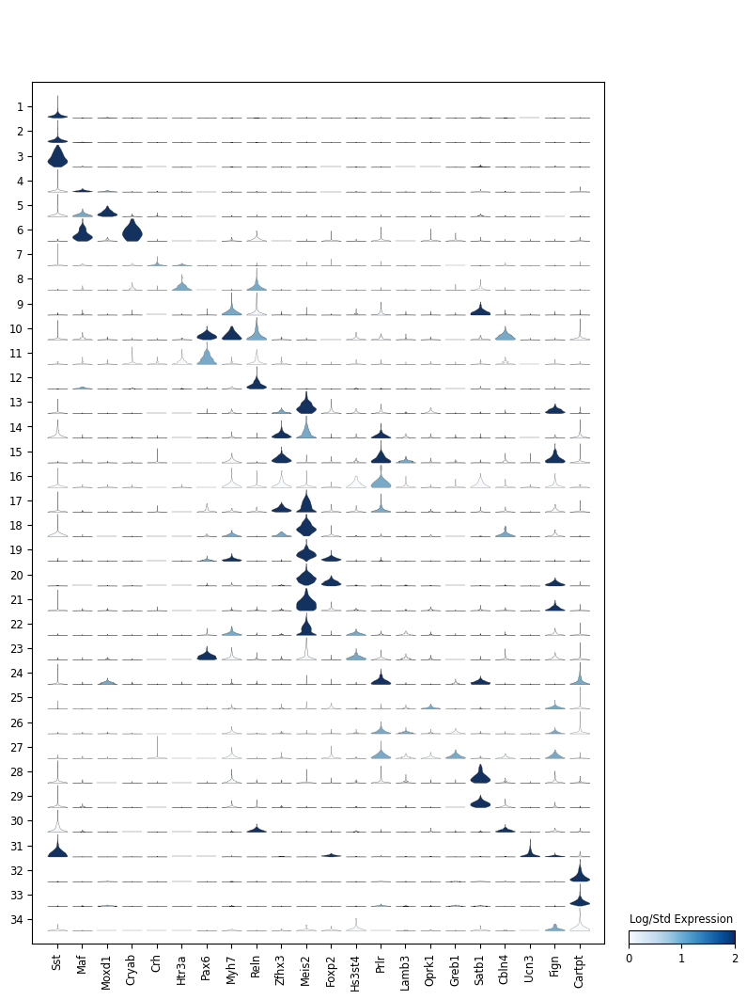

In [ ]:
gaba_violin_markers = ['Sst','Maf','Moxd1','Cryab','Crh','Htr3a','Pax6','Myh7','Reln','Zfhx3','Meis2','Foxp2','Hs3st4','Prlr','Lamb3','Oprk1','Greb1','Satb1','Cbln4','Ucn3','Fign','Cartpt']


sc.settings.figdir = "/bigdata/isaac/gaba_files/filtered"
%matplotlib inline
#save = 'gaba_violin.pdf')
#for using markers as category labels:
#groupby='markers', categories_order= GABA_markers
sc.pl.stacked_violin(GABA_adata_f, gaba_violin_markers, groupby='cluster_label', colorbar_title = 'Log/Std Expression', vmax=2, density_norm = 'width', save = 'gaba_violin_clabels.pdf')

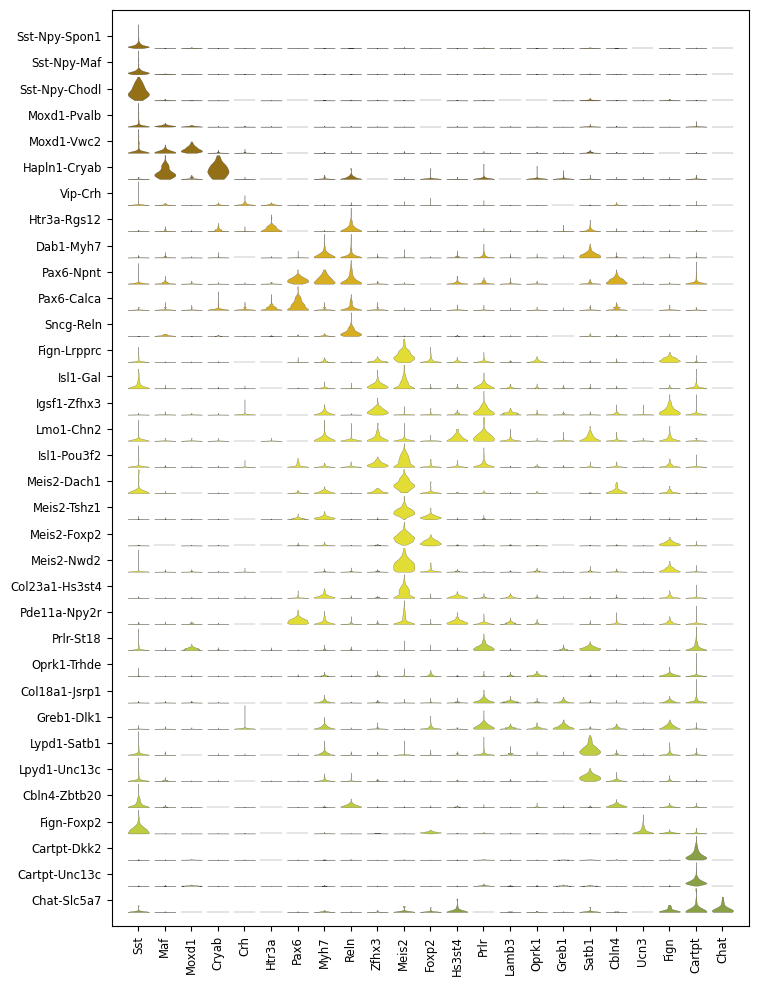

In [590]:
gaba_violin_markers = ['Sst','Maf','Moxd1','Cryab','Crh','Htr3a','Pax6','Myh7','Reln','Zfhx3','Meis2','Foxp2','Hs3st4','Prlr','Lamb3','Oprk1','Greb1','Satb1','Cbln4','Ucn3','Fign','Cartpt','Chat']

sc.settings.figdir = "/bigdata/isaac/gaba_files/filtered"
%matplotlib inline

# Create a custom color palette
GABA_palette = {k: f"#{v}" for k, v in GABA_m_2_c_dict.items()}
GABA_custom_palette = sns.color_palette(list(GABA_palette.values()))
sns.set_palette(GABA_custom_palette)

sc.pl.stacked_violin(GABA_adata_f, 
                     gaba_violin_markers, 
                     groupby='markers', 
                     categories_order= GABA_markers, 
                     #colorbar_title = 'Log/Std Expression', 
                     #vmax=2, 
                     #density_norm = 'width', 
                     row_palette = GABA_custom_palette, 
                     save = 'gaba_violin_markers_m2c.pdf')


In [3]:
#check some specific expression of genes
gene = 'Npnt'
%matplotlib inline
fig,ax = plt.subplots(figsize = (15,5))
sns.violinplot(x=GABA_meta_data_df_plis_f_markers.T['cluster_label'], y=GABA_df_marker_f.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(GABA_linkage_cluster_order_filtered, rotation = 90)
plt.show()

NameError: name 'GABA_meta_data_df_plis_f_markers' is not defined

## Vglut1 Analysis <a name="vglut1_analysis"></a>

In [79]:
today

'2024-12-31'

## 1) process (L2)

num m cells: 5485 num f cells: 5802


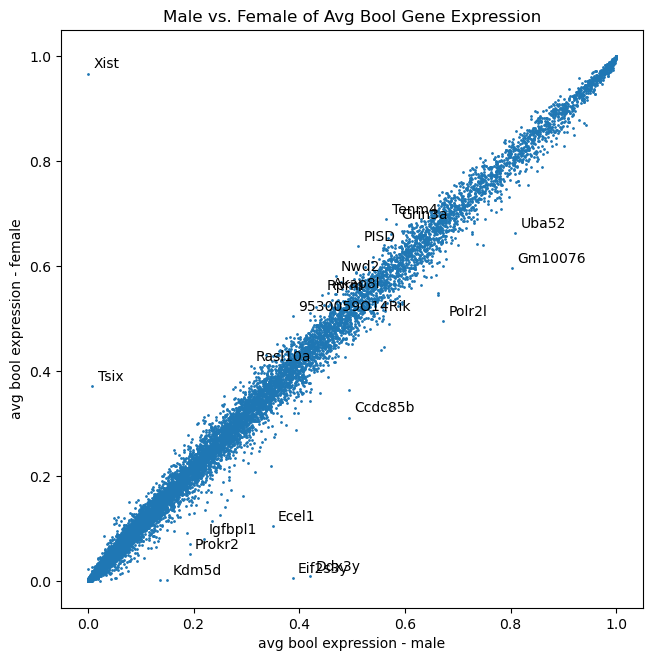

Total genes reduced from 27933 to 14208
removing  6  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']
removing  49  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']
It contains 0 infinite values


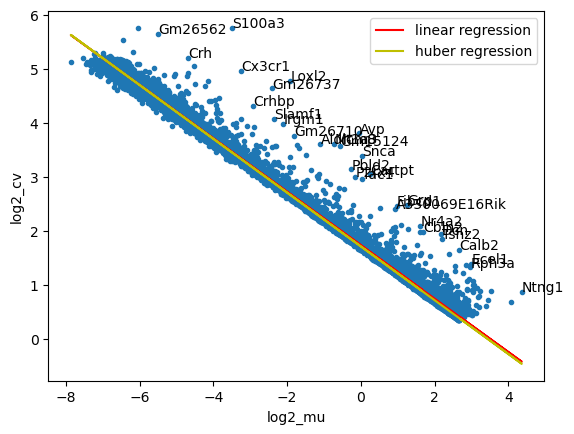

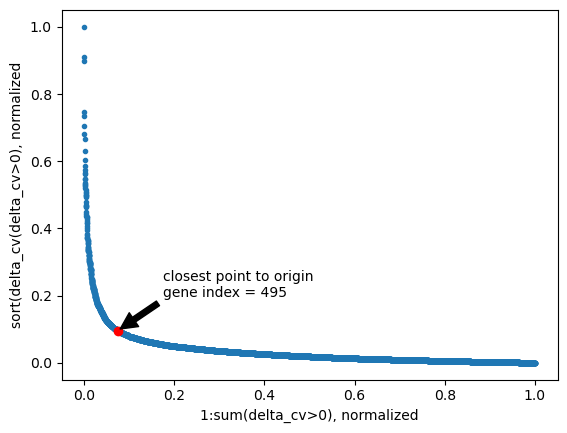

(495, 11287)
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


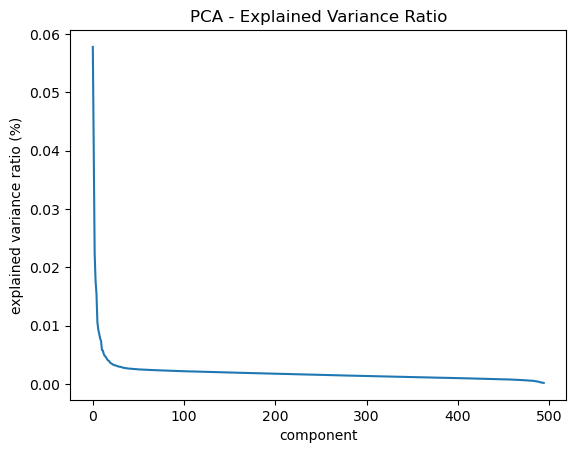

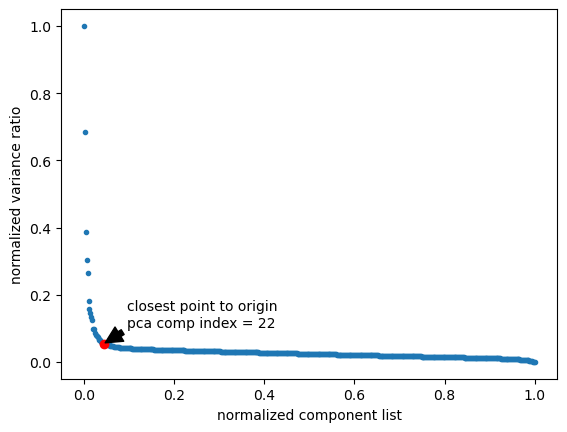

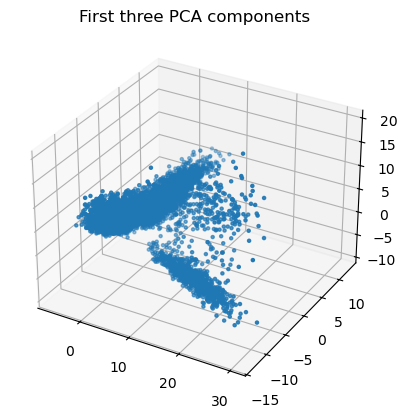

2024-12-31 14:22:09,571 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-31 14:22:10,671 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-31 14:22:10,708 - harmonypy - INFO - Iteration 1 of 20
2024-12-31 14:22:12,867 - harmonypy - INFO - Iteration 2 of 20
2024-12-31 14:22:15,026 - harmonypy - INFO - Iteration 3 of 20
2024-12-31 14:22:17,165 - harmonypy - INFO - Iteration 4 of 20
2024-12-31 14:22:18,831 - harmonypy - INFO - Iteration 5 of 20
2024-12-31 14:22:20,031 - harmonypy - INFO - Iteration 6 of 20
2024-12-31 14:22:21,036 - harmonypy - INFO - Iteration 7 of 20
2024-12-31 14:22:22,066 - harmonypy - INFO - Iteration 8 of 20
2024-12-31 14:22:23,010 - harmonypy - INFO - Iteration 9 of 20
2024-12-31 14:22:23,939 - harmonypy - INFO - Converged after 9 iterations


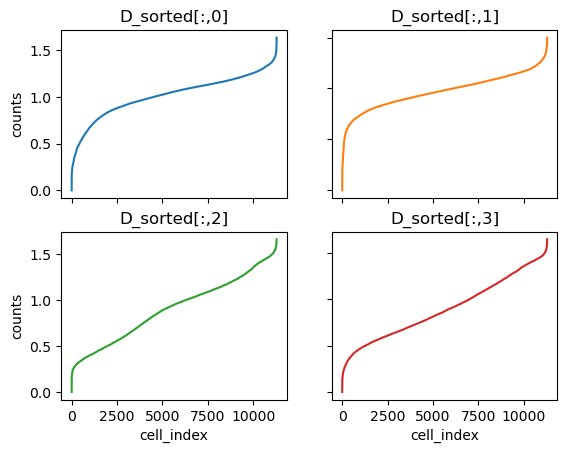

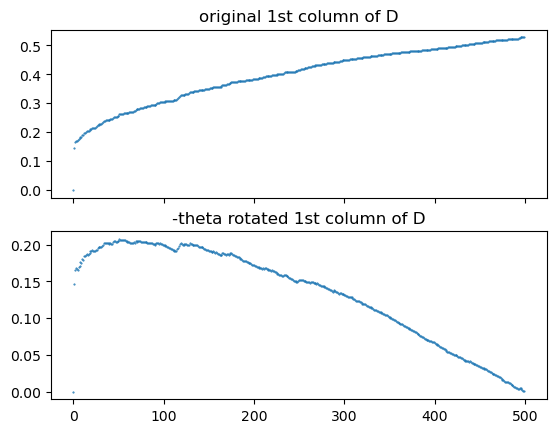

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 55.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


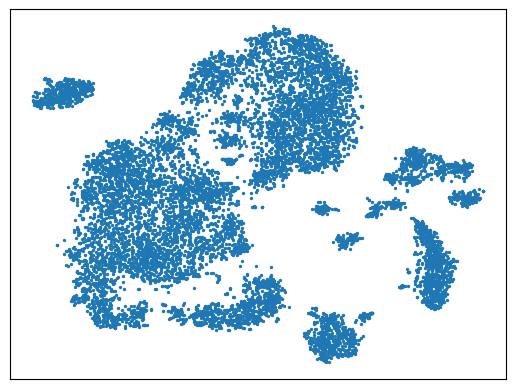

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.2907811452216365

running dbscan with epsilon: 1.2907811452216365  and minpts: 20
Estimated number of clusters: 31
Estimated number of noise points: 982


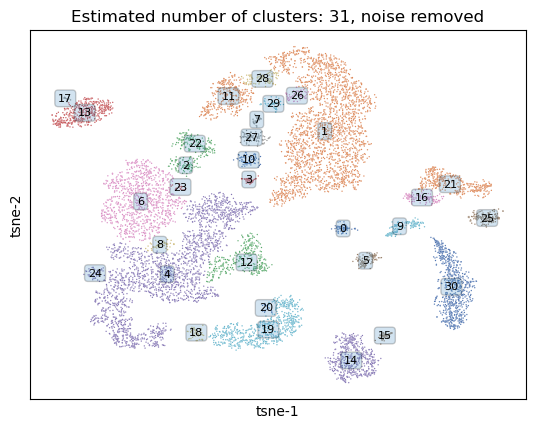

verify raw prelinkage df and raw metadata df have same columns:
True


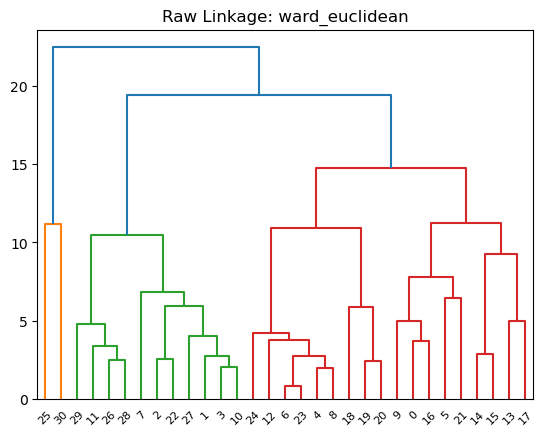

[25 30  5 21  0 16  9 15 14 13 17 12  4  8  6 23 24 18 19 20  7 10  3  1
 27 22  2 26 28 11 29]


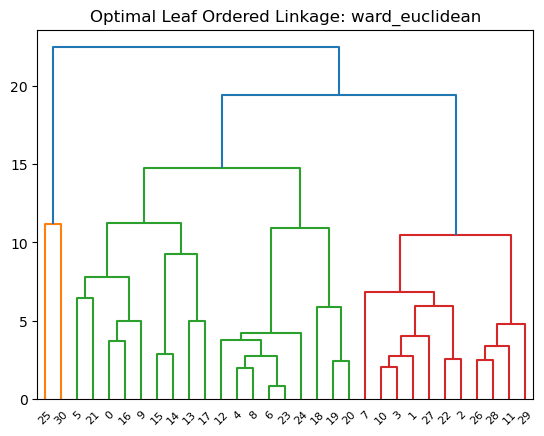

metadata df shape post inter cluster sort
(29, 10305)


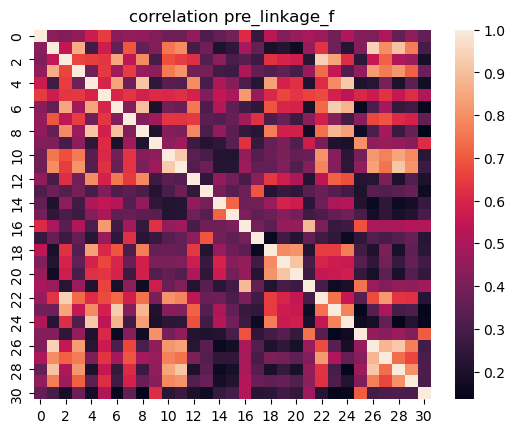

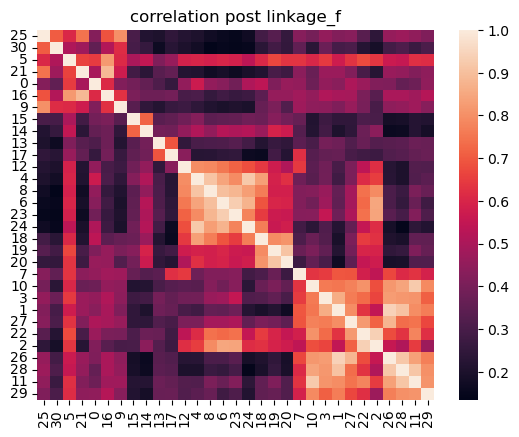

{25: 1, 30: 2, 5: 3, 21: 4, 0: 5, 16: 6, 9: 7, 15: 8, 14: 9, 13: 10, 17: 11, 12: 12, 4: 13, 8: 14, 6: 15, 23: 16, 24: 17, 18: 18, 19: 19, 20: 20, 7: 21, 10: 22, 3: 23, 1: 24, 27: 25, 22: 26, 2: 27, 26: 28, 28: 29, 11: 30, 29: 31}
[0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
 28 29 30]
check if df plis columns equal metadata df plis columns:
[ True  True  True ...  True  True  True]
len marker_Genes_sorted 143
len marker_genes_sorted_final 143
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 150, 905, 1015, 1399, 1473, 1604, 1760, 1822, 2347, 2780, 2797, 3121, 5217, 5264, 6239, 6260, 6305, 6354, 7027, 7047, 7085, 7164, 7218, 9427, 9508, 9671, 9768, 9821, 9919, 10258, 10304]
[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 22, 24, 27, 28, 29, 30]
25
[array([  0,   1,  31,  27,  30,   2,  38,  32, 129, 128, 142, 138, 136,
         5,   4,   3]), array([  9, 

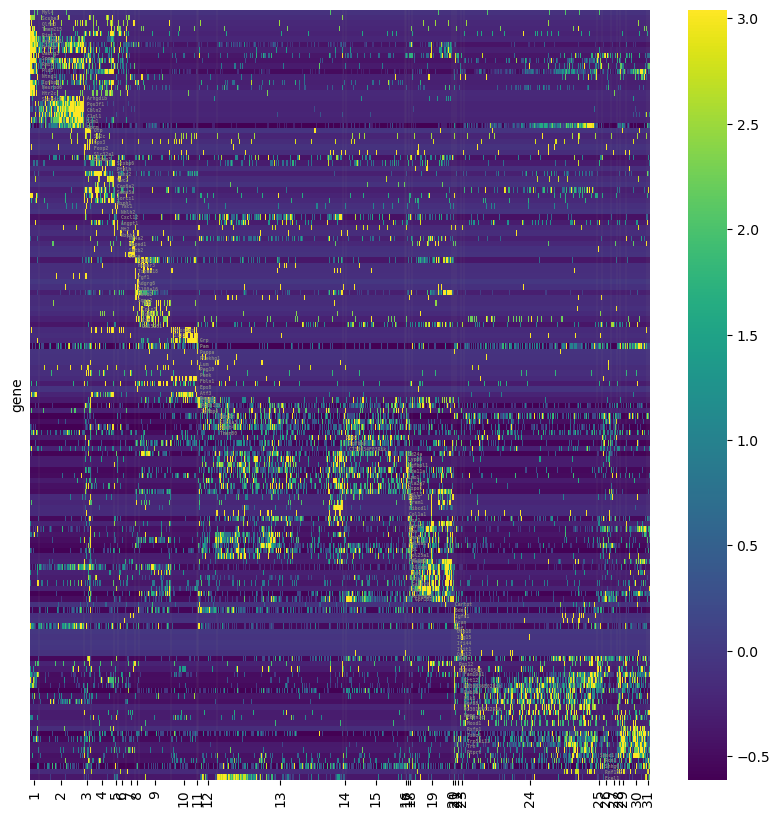

True


In [80]:
%matplotlib inline
#try new process module
Vglut1_folder = '/bigdata/isaac/Vglut1_files/'
Vglut1_df_marker, Vglut1_arr_tsne, Vglut1_meta_data_df_plis, Vglut1_linkage_cluster_order, Vglut1_df_marker_log_and_std_col, Vglut1_df_plis, Vglut1_cluster_indices, Vglut1_df_marker_log_and_std, Vglut1_df_ge = dp_c.process(df_orig, meta_data_df, sex_gene_list, IEG_list, Vglut1_folder, 'Vglut1')

/tmp/ipykernel_3959033/2948303617.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(Vglut1_linkage_cluster_order, rotation = 90)


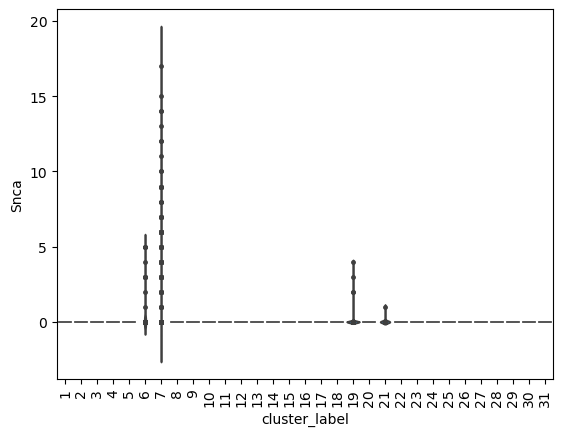

In [162]:
#check some specific expression of genes
gene = 'Snca'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=Vglut1_meta_data_df_plis.T['cluster_label'], y=Vglut1_df_plis.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(Vglut1_linkage_cluster_order, rotation = 90)
plt.show()

In [347]:
np.all(Vglut1_df_plis.columns== Vglut1_meta_data_df_plis.columns)

True

## 2) Drop clusters, filter heatmap elements

In [81]:
Vglut1_clusters_to_drop, Vglut1_thresh_cells = dp.drop_clusters(Vglut1_meta_data_df_plis, Vglut1_linkage_cluster_order, cluster_labels=[26], thresh_cells=140)
Vglut1_clusters_to_drop

[3, 5, 6, 8, 11, 14, 16, 17, 18, 20, 21, 22, 23, 25, 26, 27, 28, 29, 31]

In [82]:
Vglut1_filtered_folder = '/bigdata/isaac/Vglut1_files/filtered/'
Vglut1_df_marker_log_and_std_filtered, Vglut1_df_marker_log_and_std_col_filtered, Vglut1_meta_data_df_plis_filtered, Vglut1_pos_filtered_tmp, Vglut1_df_plis_filtered,Vglut1_linkage_cluster_order_filtered,Vglut1_linkage_cluster_order_filtered_tmp, Vglut1_change_indices_filtered, Vglut1_cluster_indices_filtered  = dp.filter_heatmap_elements(Vglut1_filtered_folder, 'Vglut1', Vglut1_clusters_to_drop,
                                                                                                                                                                                                                                        Vglut1_df_marker_log_and_std,
                                                                                                                                                                                                                                        Vglut1_meta_data_df_plis,
                                                                                                                                                                                                                                        Vglut1_df_plis,
                                                                                                                                                                                                                                        Vglut1_cluster_indices,
                                                                                                                                                                                                                                        Vglut1_linkage_cluster_order)


True
True
Indices where the value changes: [0, 150, 905, 1289, 1445, 1970, 2403, 2727, 4823, 5798, 6471, 8680, 9018]
change_indices_filtered [150, 905, 1289, 1445, 1970, 2403, 2727, 4823, 5798, 6471, 8680, 9018]
12
{1: 1, 2: 2, 4: 3, 7: 4, 9: 5, 10: 6, 12: 7, 13: 8, 15: 9, 19: 10, 24: 11, 30: 12}
[1 2 4 7 9 10 12 13 15 19 24 30]


In [349]:
#sanity check
np.all(Vglut1_df_plis_filtered.columns == Vglut1_meta_data_df_plis_filtered.columns)

True

## 3) run rc (recalc) to get filtered df marker, tsne arr

It contains 0 infinite values


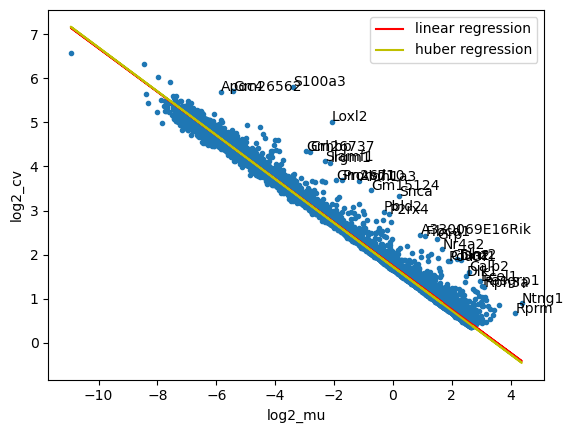

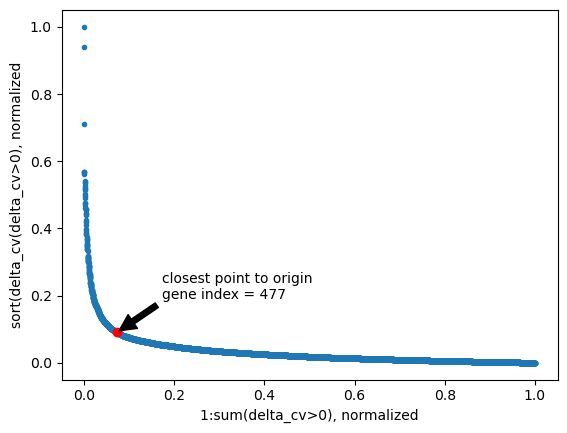

(477, 9019)
True
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


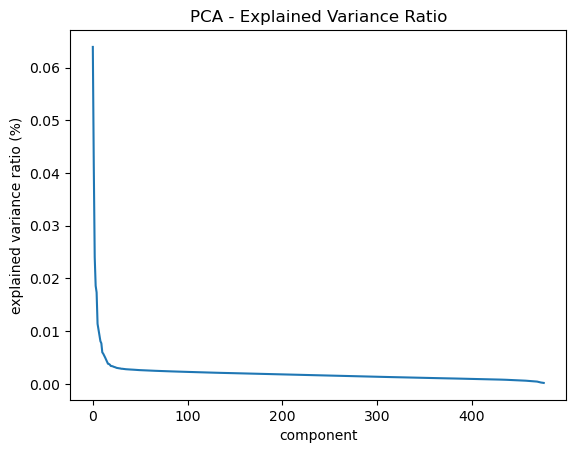

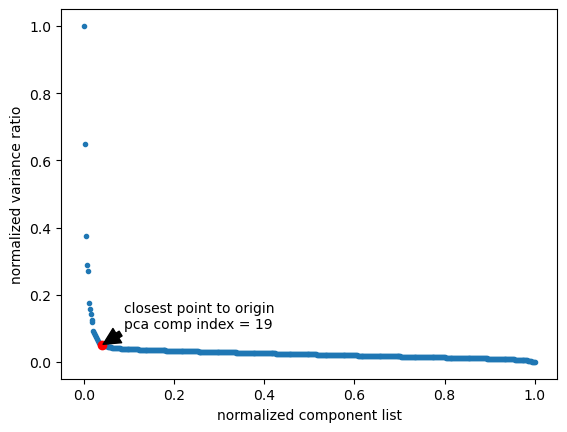

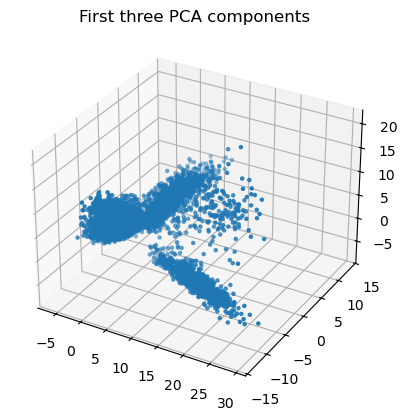

2024-12-31 14:27:09,074 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-31 14:27:09,915 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-31 14:27:09,939 - harmonypy - INFO - Iteration 1 of 20
2024-12-31 14:27:11,729 - harmonypy - INFO - Iteration 2 of 20
2024-12-31 14:27:13,476 - harmonypy - INFO - Iteration 3 of 20
2024-12-31 14:27:15,119 - harmonypy - INFO - Iteration 4 of 20
2024-12-31 14:27:16,823 - harmonypy - INFO - Iteration 5 of 20
2024-12-31 14:27:18,077 - harmonypy - INFO - Iteration 6 of 20
2024-12-31 14:27:19,465 - harmonypy - INFO - Iteration 7 of 20
2024-12-31 14:27:20,635 - harmonypy - INFO - Iteration 8 of 20
2024-12-31 14:27:21,499 - harmonypy - INFO - Converged after 8 iterations


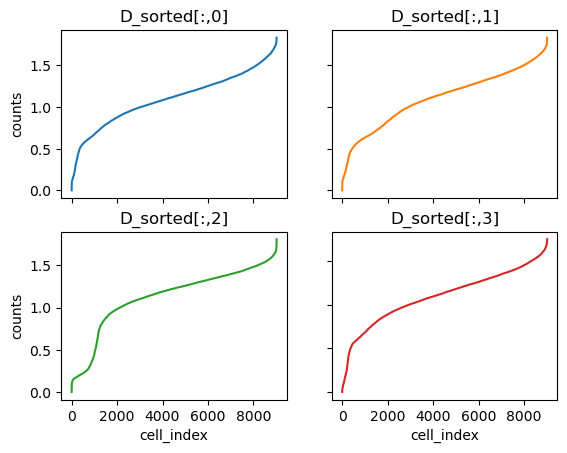

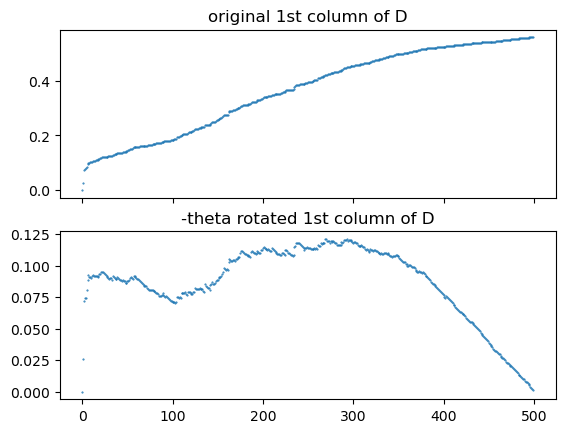

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 54.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


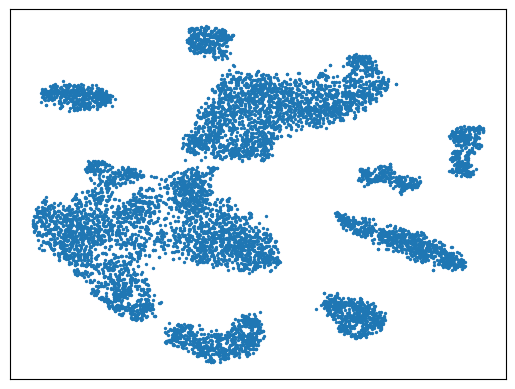

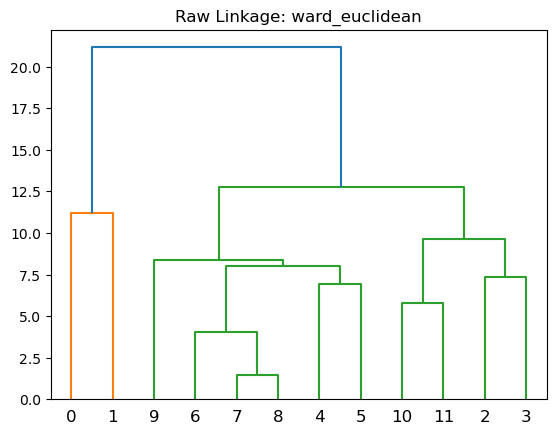

[ 1  0  2  3 10 11  5  4  8  7  6  9]


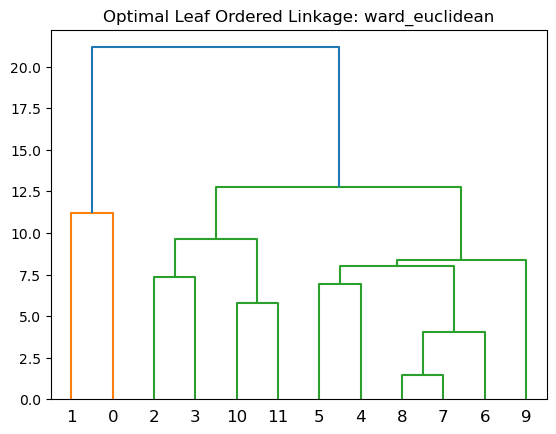

metadata df shape post inter cluster sort
(29, 9019)


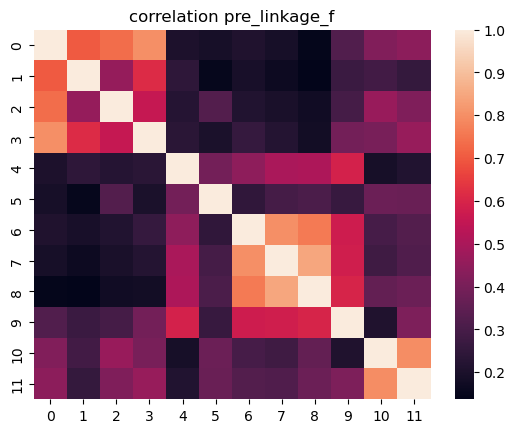

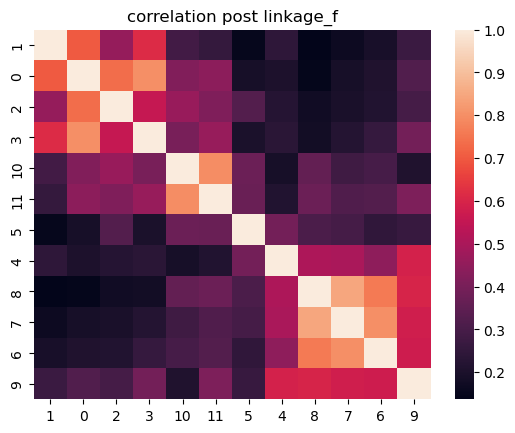

{2: 1, 1: 2, 3: 3, 4: 4, 11: 5, 12: 6, 6: 7, 5: 8, 9: 9, 8: 10, 7: 11, 10: 12}
[1 2 3 4 5 6 7 8 9 10 11 12]
len marker_Genes_sorted 77
len marker_genes_sorted_final 77
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 755, 905, 1289, 1445, 3654, 3993, 4426, 4951, 5926, 8022, 8346, 9018]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
12
[array([ 0,  1,  2,  3,  4, 34]), array([22, 18, 31, 30, 24, 29,  8,  5,  7,  6, 10,  9, 70]), array([16, 15, 14, 17, 12, 11, 13]), array([20, 21, 23, 19]), array([25, 27, 26, 28, 32]), array([38, 35, 33, 37, 36, 39]), array([44, 42, 43, 40, 41]), array([56, 47, 46, 49, 50, 45, 48]), array([53, 65, 51, 54, 55, 52]), array([57, 59, 60, 58, 63, 62, 64, 61]), array([68, 69, 67, 66]), array([74, 73, 71, 75, 76, 72])]
12


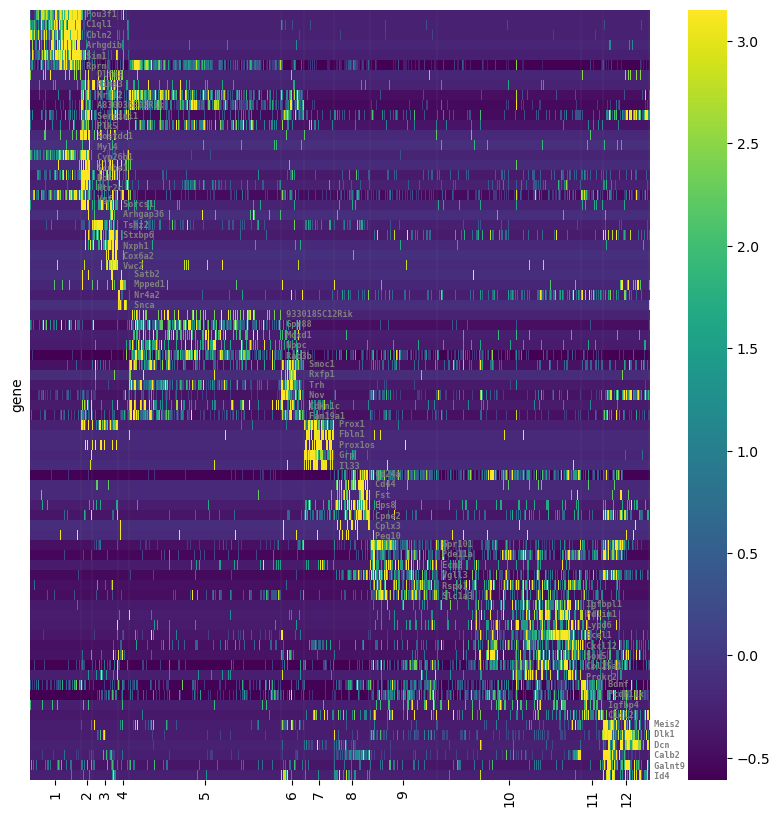

In [83]:
Vglut1_filtered_folder = '/bigdata/isaac/Vglut1_files/filtered/'
cell_class = 'Vglut1'
%matplotlib inline
Vglut1_df_marker_f, Vglut1_arr_tsne_f, Vglut1_meta_data_df_plis_f, Vglut1_meta_data_df_pca, Vglut1_mgs_f, Vglut1_ind_f, Vglut1_ind_s_f, Vglut1_df_marker_log_and_std_col_f, Vglut1_pos_f, Vglut1_linkage_cluster_order_filtered, Vglut1_change_indices_f = dp_rc.reprocess(Vglut1_df_ge,Vglut1_meta_data_df_plis_filtered,Vglut1_linkage_cluster_order_filtered,Vglut1_cluster_indices_filtered,Vglut1_filtered_folder,cell_class, sort = True, write_to_file=False)


In [354]:
np.all(Vglut1_df_marker_f.columns==Vglut1_meta_data_df_plis_f.columns)

True

## 4) Add cluster labels (manual)

In [86]:
folder = '/bigdata/isaac/Vglut1_files/filtered/'
Vglut1_labels = dp.get_cluster_labels(folder, 'Vglut1_filtered_labels_rc.csv')

In [87]:
Vglut1_labels

['Sim1-C1ql1',
 'Rims3-Cyp26b1',
 'Tshz2-Stxbp6',
 'Snca-Satb2',
 'Moxd1-Gpr88',
 'Trh-Rxfp1',
 'Il33-Prox1',
 'Fst-Cd44',
 'Slc1a3-Ecm2',
 'Ecel1-Sox5',
 'C1ql2-Pcdh11x',
 'Dlk1-Dcn']

In [27]:
Vglut1_meta_data_df_plis_filtered.loc['cluster_label',:]

ATCACGAGTCGGTGTC-1_10X38_2     1
TGATTTCAGTTCCGTA-1_10X51_2     1
TCAATTCGTTAAAGTG-1_10X51_2     1
TCAGCAACACCAATTG-1_10X51_2     1
ATCCACCCATTGAAAG-1_10X51_2     1
                              ..
CTGGACGGTTCGGACC-1_10X52_3    12
TGGGTTAAGGCGCTTC-1_10X51_1    12
AGGAGGTGTGTGTCGC-1_10X51_1    12
TACCTGCTCCACGGAC-1_10X51_1    12
GTTTACTCACACTGGC-1_10X51_1    12
Name: cluster_label, Length: 9019, dtype: object

In [24]:
Vglut1_linkage_cluster_order_filtered

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [585]:
Vglut1_meta_data_df_plis_filtered.shape

(29, 9019)

### add label markers to plis filtered metadata

In [28]:
Vglut1_filtered_folder

'/bigdata/isaac/Vglut1_files/filtered/'

In [88]:
Vglut1_meta_data_df_plis_f_markers = dp.update_metadata_w_markers(Vglut1_filtered_folder, 
                                                                         Vglut1_meta_data_df_plis_f,
                                                                         Vglut1_linkage_cluster_order_filtered,
                                                                         Vglut1_labels,
                                                                         'Vglut1',
                                                                        write_to_file = False)

In [308]:
today

'2024-12-12'

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
12
[array([ 0,  1,  2,  3,  4, 34]), array([22, 18, 31, 30, 24, 29,  8,  5,  7,  6, 10,  9, 70]), array([16, 15, 14, 17, 12, 11, 13]), array([20, 21, 23, 19]), array([25, 27, 26, 28, 32]), array([38, 35, 33, 37, 36, 39]), array([44, 42, 43, 40, 41]), array([56, 47, 46, 49, 50, 45, 48]), array([53, 65, 51, 54, 55, 52]), array([57, 59, 60, 58, 63, 62, 64, 61]), array([68, 69, 67, 66]), array([74, 73, 71, 75, 76, 72])]
12


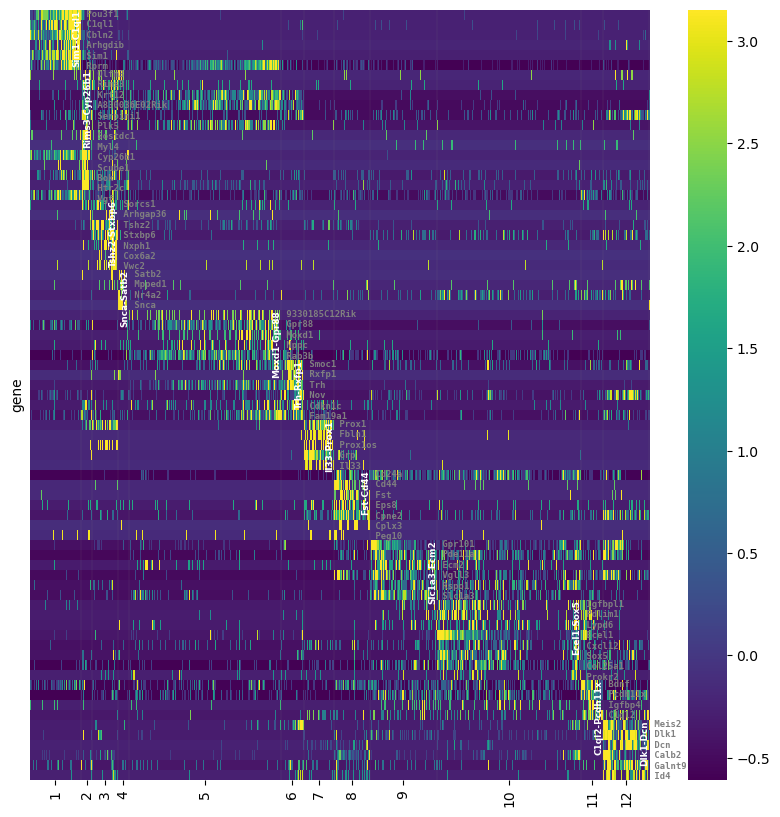

In [312]:
#plot heatmap w/ labels
%matplotlib inline
linkage_alg = 'ward'
dist_metric = 'euclidean'
Vglut1_tg_f, Vglut1_tgfs_f = dp.get_heatmap_labels(Vglut1_mgs_f, Vglut1_ind_f, Vglut1_ind_s_f)
#sanity check - plotting only filtered gaba_df (clusters removed)
dp.plot_marker_heatmap(Vglut1_df_marker_log_and_std_col_f, 
                       Vglut1_pos_f, 
                       Vglut1_linkage_cluster_order_filtered, 
                       Vglut1_change_indices_f, 
                       Vglut1_tg_f, 
                       Vglut1_tgfs_f, 
                       linkage_alg,
                       dist_metric,
                       Vglut1_filtered_folder,
                       fs_waterfall = 6.4,
                       cluster_labels = Vglut1_labels,
                       savefig = True,
                       cell_class = 'Vglut1_filtered_tg_reenrich_labeled')

In [36]:
Vglut1_meta_data_df_plis_filtered_markers.tail()

,ATCACGAGTCGGTGTC-1_10X38_2,TGATTTCAGTTCCGTA-1_10X51_2,TCAATTCGTTAAAGTG-1_10X51_2,TCAGCAACACCAATTG-1_10X51_2,ATCCACCCATTGAAAG-1_10X51_2,ATGGAGGTCAAGTGGG-1_10X51_2,CCCGAAGTCGCCCAGA-1_10X36_2,TTTGATCGTTAAAGTG-1_10X36_2,GATCATGAGACTTCGT-1_10X36_2,CCGGTAGGTTACAGCT-1_10X36_2,...,TTGACCCGTTCGGTCG-1_10X52_3,GTAGTACCATGACAGG-1_10X52_4,GGGACTCAGGCATGCA-1_10X52_4,ACTCTCGTCTCTCTAA-1_10X52_4,CACTTCGTCTAGACCA-1_10X36_1,CTGGACGGTTCGGACC-1_10X52_3,TGGGTTAAGGCGCTTC-1_10X51_1,AGGAGGTGTGTGTCGC-1_10X51_1,TACCTGCTCCACGGAC-1_10X51_1,GTTTACTCACACTGGC-1_10X51_1
lengthbp_seqlib,415.0,474.0,474.0,474.0,474.0,474.0,486.0,486.0,486.0,486.0,...,507.0,535.0,535.0,535.0,476.0,507.0,478.0,478.0,478.0,478.0
Sample_Index,C9,A2,A2,A2,A2,A2,A9,A9,A9,A9,...,F12,G12,G12,G12,H8,F12,G1,G1,G1,G1
cell_class,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,...,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1,Vglut1
cluster_label,1,1,1,1,1,1,1,1,1,1,...,12,12,12,12,12,12,12,12,12,12
markers,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,Sim1-C1ql1,...,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn,Dlk1-Dcn


## 5) Updated TSNE Plot

In [38]:
Vglut1_arr_tsne_f.shape

(9019, 2)

In [356]:
np.all(Vglut1_meta_data_df_plis_f_markers.columns == Vglut1_df_marker_f.columns)

True

In [40]:
cell_class

'Vglut1'

In [430]:
Vglut1_df_ge.shape

(14153, 11287)

In [432]:
Vglut1_df_marker_f.shape

(77, 9019)

In [90]:

Vglut1_label_color_df = pd.read_excel(Vglut1_filtered_folder + 'Vglut1_filtered_labels_rc.xlsx')
Vglut1_m_2_c_dict = dict(zip(Vglut1_label_color_df.loc[:,'markers'],Vglut1_label_color_df.loc[:,'hex']))

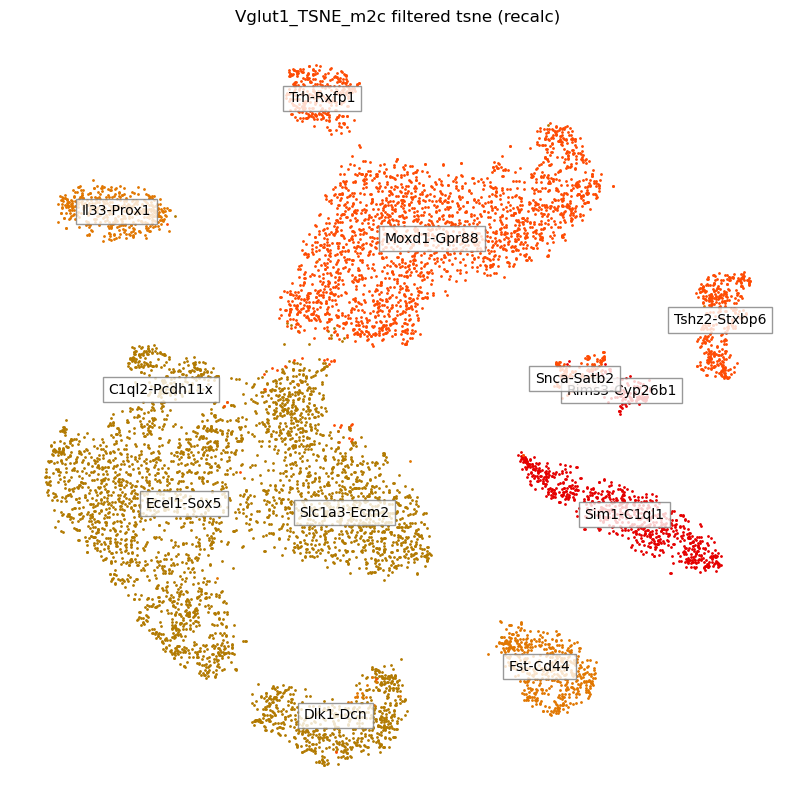

In [91]:
#Vglut1_meta_data_df_plis_filtered_tsne = dp.update_metadata_w_markers(folder, Vglut1_meta_data_df_plis_filtered, Vglut1_linkage_cluster_order_filtered, Vglut1_labels, 'Vglut1_TSNE', write_to_file = False)
#resort tsne index to match index of final labeled metadata
Vglut1_tsne_arr_tmp = pd.DataFrame(index=Vglut1_meta_data_df_plis_filtered.columns, data=Vglut1_arr_tsne_f)
Vglut1_tsne_arr_tmp_ri = Vglut1_tsne_arr_tmp.reindex(index = Vglut1_meta_data_df_plis_f_markers.columns)


dp.plot_rc_tsne(Vglut1_meta_data_df_plis_f_markers,Vglut1_tsne_arr_tmp_ri.values,'Vglut1_TSNE_m2c', Vglut1_filtered_folder,m_2_c_dict = Vglut1_m_2_c_dict,savefig=True)


<Figure size 1000x1000 with 0 Axes>

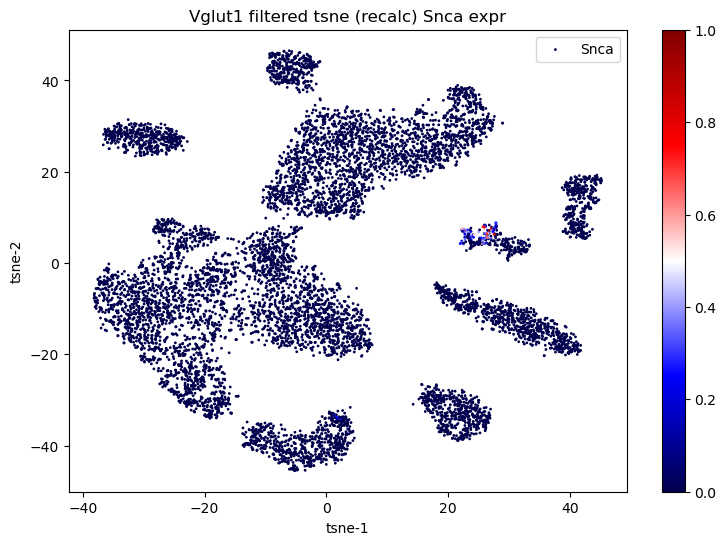

In [169]:
marker_name = 'Snca'
dp.plot_rc_tsne_marker(Vglut1_meta_data_df_plis_f_markers,Vglut1_tsne_arr_tmp_ri.values,Vglut1_df_marker_f,marker_name,'Vglut1', Vglut1_filtered_folder, savefig=False)

## 6) Violin Plots

In [358]:
np.all(Vglut1_df_marker_f.columns == Vglut1_meta_data_df_plis_f_markers.columns)

True

In [359]:
Vglut1_adata_f = ad.AnnData(Vglut1_df_marker_f.T)
#add aligned metadata
for x in Vglut1_meta_data_df_plis_f_markers.index:
    Vglut1_adata_f.obs[str(x)] = Vglut1_meta_data_df_plis_f_markers.loc[str(x),:]

Vglut1_markers = Vglut1_adata_f.obs['markers']
_, idx = np.unique(Vglut1_adata_f.obs['markers'], return_index=True)
Vglut1_markers = list(Vglut1_markers[np.sort(idx)])

/tmp/ipykernel_3115776/4055460996.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  Vglut1_markers = list(Vglut1_markers[np.sort(idx)])


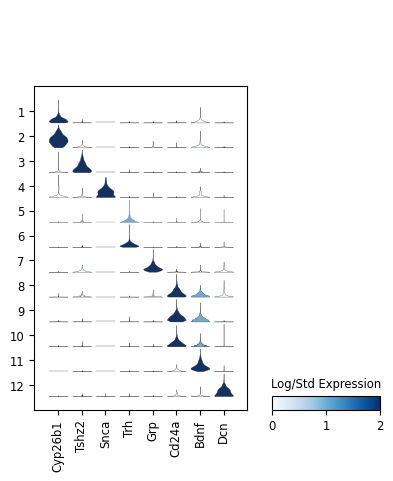

In [360]:
Vglut1_violin_markers = ['Cyp26b1','Tshz2','Snca','Trh','Grp','Cd24a','Bdnf','Dcn']
sc.settings.figdir = "/bigdata/isaac/Vglut1_files/filtered"
%matplotlib inline
#save = 'Vglut1_violin.pdf'
#for using markers as category labels:
#groupby='markers', categories_order= Vglut1_markers
sc.pl.stacked_violin(Vglut1_adata_f, Vglut1_violin_markers, groupby='cluster_label', colorbar_title = 'Log/Std Expression', vmax=2, density_norm = 'width')
      

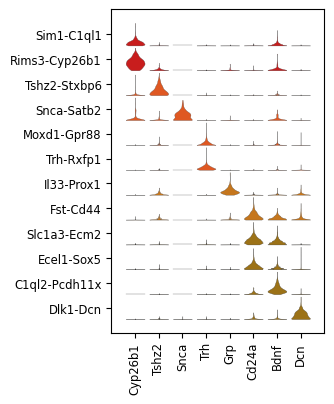

In [593]:
%matplotlib inline
sc.settings.figdir = "/bigdata/isaac/Vglut1_files/filtered"
# Create a custom color palette
Vglut1_palette = {k: f"#{v}" for k, v in Vglut1_m_2_c_dict.items()}
Vglut1_custom_palette = sns.color_palette(list(Vglut1_palette.values()))
sns.set_palette(Vglut1_custom_palette)

sc.pl.stacked_violin(Vglut1_adata_f, 
                     Vglut1_violin_markers, 
                     groupby='markers', 
                     categories_order= Vglut1_markers, 
                     #colorbar_title = 'Log/Std Expression', 
                     #vmax=2, 
                     #density_norm = 'width', 
                     row_palette = Vglut1_custom_palette, 
                     save = 'Vglut1_violin_markers_m2c.pdf')

/tmp/ipykernel_3959033/386229320.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(Vglut1_linkage_cluster_order_filtered, rotation = 90)


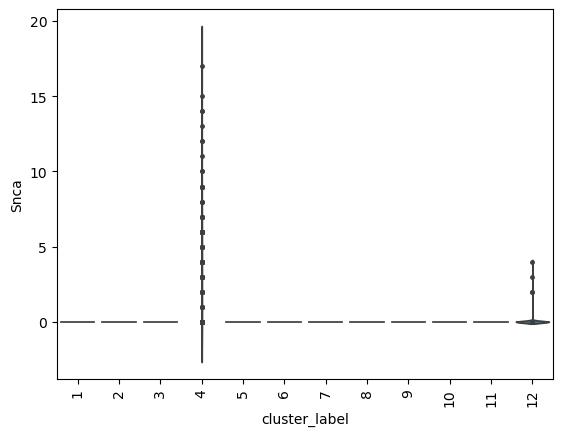

In [164]:
gene = 'Snca'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=Vglut1_meta_data_df_plis_f.T['cluster_label'], y=Vglut1_df_marker_f.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(Vglut1_linkage_cluster_order_filtered, rotation = 90)
plt.show()

## Vglut2 Analysis <a name="vglut2_analysis"></a>

## 1) Process (L2)

num m cells: 4058 num f cells: 5748


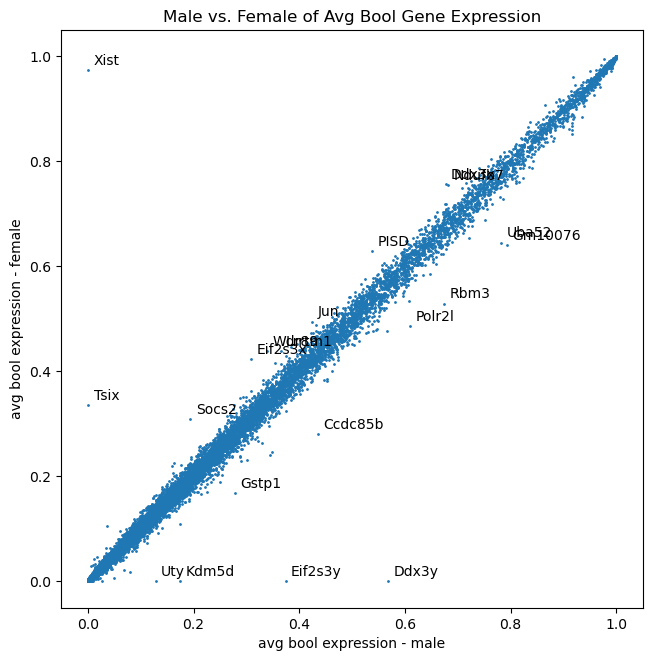

Total genes reduced from 27933 to 14090
removing  5  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']
removing  53  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']
It contains 0 infinite values


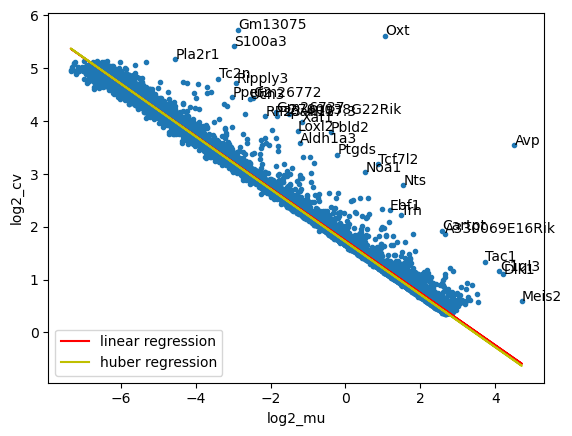

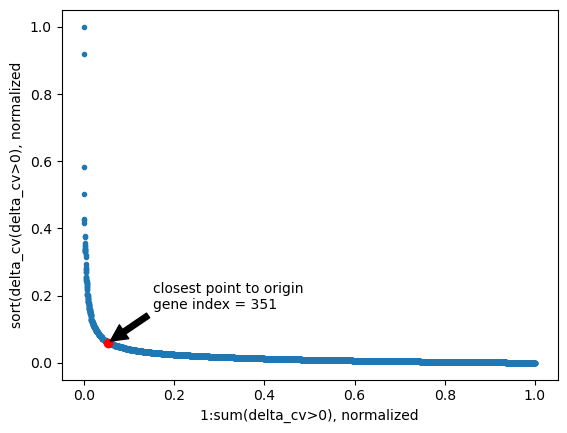

(351, 9806)
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


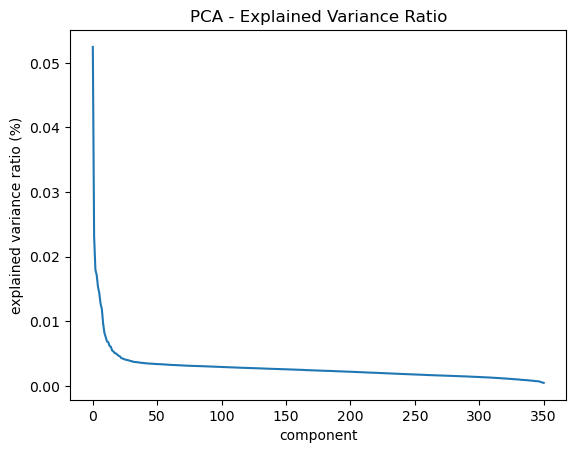

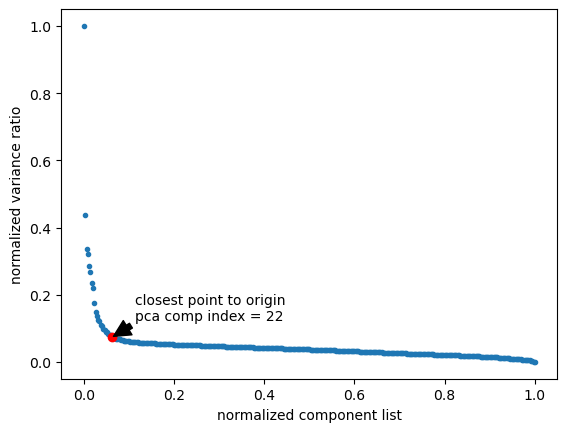

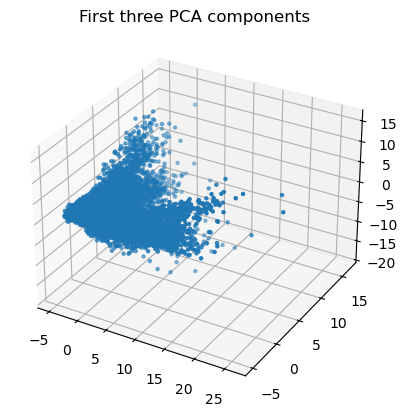

2024-12-31 14:37:52,820 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-31 14:37:53,732 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-31 14:37:53,759 - harmonypy - INFO - Iteration 1 of 20
2024-12-31 14:37:55,763 - harmonypy - INFO - Iteration 2 of 20
2024-12-31 14:37:57,793 - harmonypy - INFO - Iteration 3 of 20
2024-12-31 14:37:59,763 - harmonypy - INFO - Iteration 4 of 20
2024-12-31 14:38:01,759 - harmonypy - INFO - Iteration 5 of 20
2024-12-31 14:38:03,032 - harmonypy - INFO - Iteration 6 of 20
2024-12-31 14:38:04,058 - harmonypy - INFO - Iteration 7 of 20
2024-12-31 14:38:05,070 - harmonypy - INFO - Iteration 8 of 20
2024-12-31 14:38:05,817 - harmonypy - INFO - Iteration 9 of 20
2024-12-31 14:38:06,463 - harmonypy - INFO - Iteration 10 of 20
2024-12-31 14:38:07,119 - harmonypy - INFO - Iteration 11 of 20
2024-12-31 14:38:07,855 - harmonypy - INFO - Iteration 12 of 20
2024-12-31 14:38:08,601 - harmonypy - INFO - Iteration 13 of

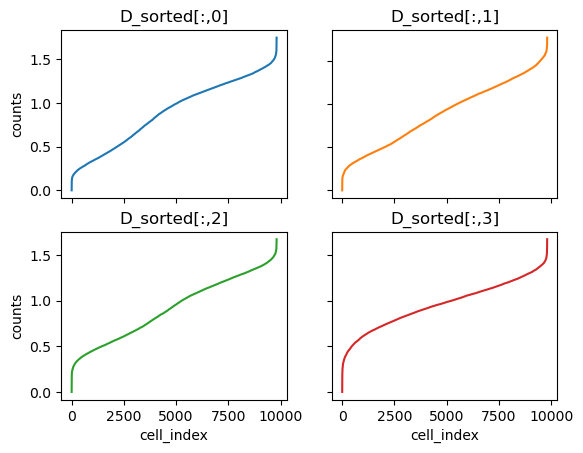

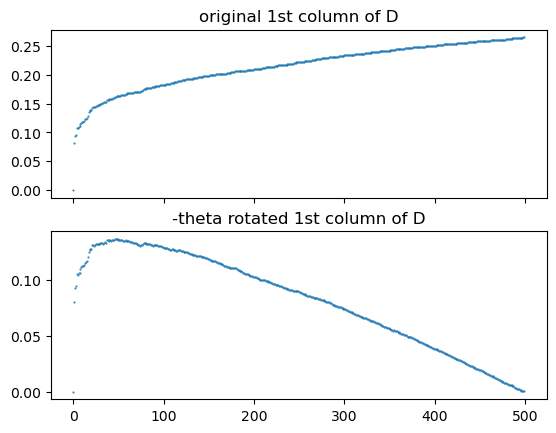

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 54.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


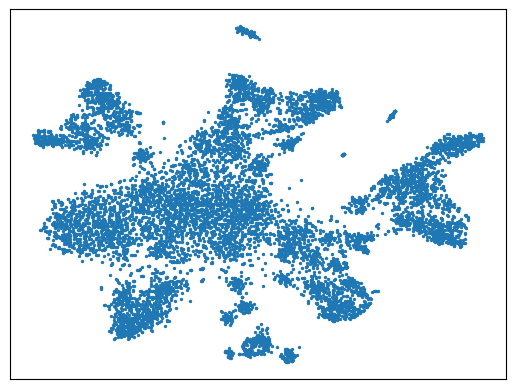

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.4149246380898524

running dbscan with epsilon: 1.4149246380898524  and minpts: 20
Estimated number of clusters: 37
Estimated number of noise points: 981


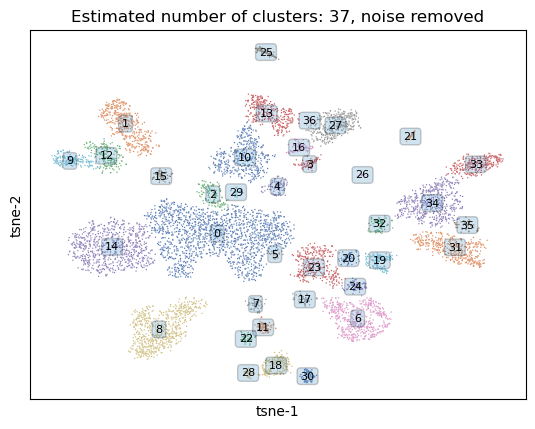

verify raw prelinkage df and raw metadata df have same columns:
True


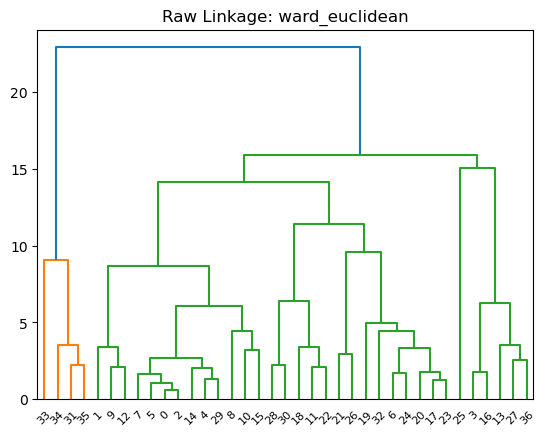

[33 34 35 31 30 28 18 22 11 21 26 32 20 23 17  6 24 19  8 10 15 14 29  4
  5  2  0  7  1 12  9  3 16 36 27 13 25]


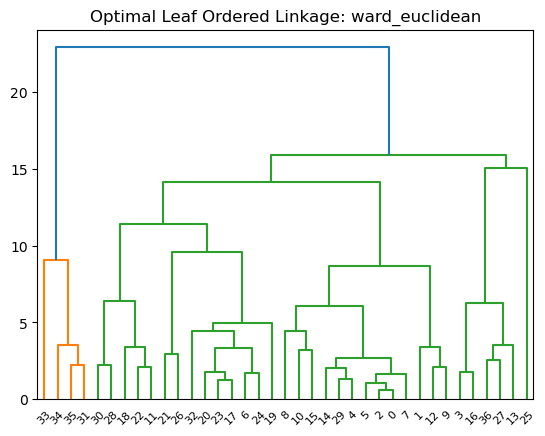

metadata df shape post inter cluster sort
(29, 8825)


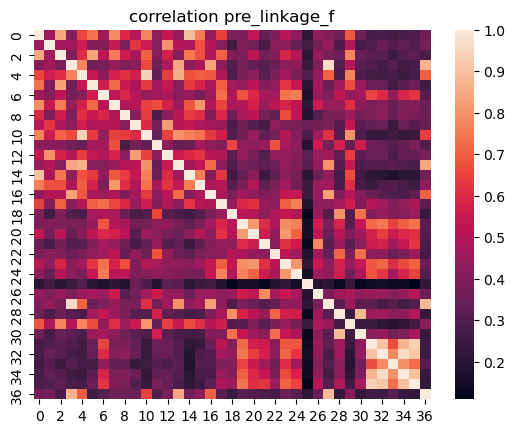

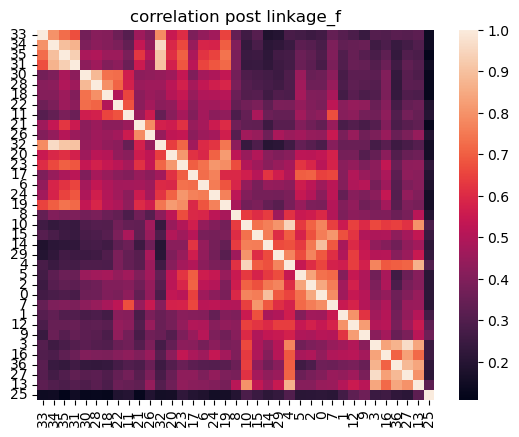

{33: 1, 34: 2, 35: 3, 31: 4, 30: 5, 28: 6, 18: 7, 22: 8, 11: 9, 21: 10, 26: 11, 32: 12, 20: 13, 23: 14, 17: 15, 6: 16, 24: 17, 19: 18, 8: 19, 10: 20, 15: 21, 14: 22, 29: 23, 4: 24, 5: 25, 2: 26, 0: 27, 7: 28, 1: 29, 12: 30, 9: 31, 3: 32, 16: 33, 36: 34, 27: 35, 13: 36, 25: 37}
[0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
 28 29 30 31 32 33 34 35 36]
check if df plis columns equal metadata df plis columns:
[ True  True  True ...  True  True  True]
len marker_Genes_sorted 144
len marker_genes_sorted_final 144
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 284, 818, 877, 1325, 1414, 1455, 1650, 1706, 1798, 1862, 1882, 1970, 2036, 2362, 2416, 2942, 3017, 3159, 3827, 4258, 4320, 5091, 5111, 5202, 5220, 5345, 6970, 7028, 7492, 7670, 7861, 7945, 8019, 8025, 8372, 8718, 8824]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 15, 16, 17, 18, 20, 21, 25, 27, 28, 29, 30, 32, 33, 34, 35, 36

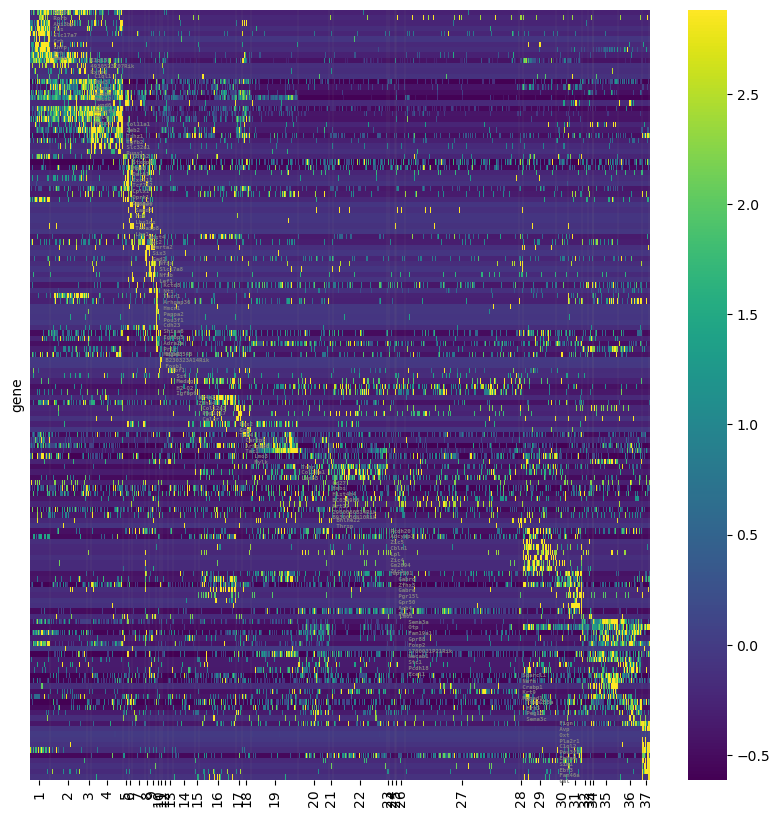

True


In [93]:
%matplotlib inline
#try new process module
Vglut2_folder = '/bigdata/isaac/Vglut2_files/'
Vglut2_df_marker, Vglut2_arr_tsne, Vglut2_meta_data_df_plis, Vglut2_linkage_cluster_order, Vglut2_df_marker_log_and_std_col, Vglut2_df_plis, Vglut2_cluster_indices, Vglut2_df_marker_log_and_std, Vglut2_df_ge = dp_c.process(df_orig, meta_data_df, sex_gene_list, IEG_list, Vglut2_folder, 'Vglut2')

In [339]:
np.all(Vglut2_df_marker.columns == Vglut2_meta_data_df_plis.columns)

True

/tmp/ipykernel_3115776/2882743691.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(Vglut2_linkage_cluster_order, rotation = 90)


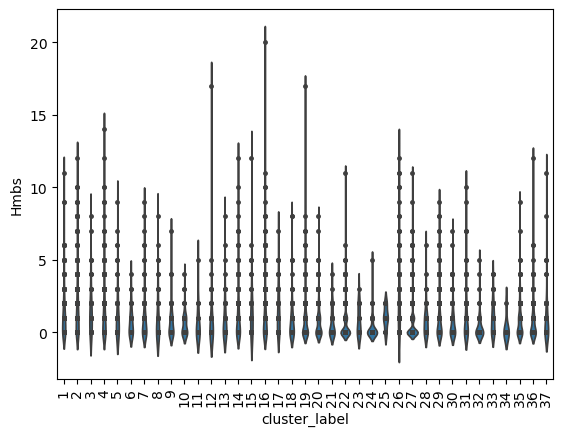

In [104]:
#check some specific expression of genes
gene = 'Hmbs'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=Vglut2_meta_data_df_plis.T['cluster_label'], y=Vglut2_df_plis.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(Vglut2_linkage_cluster_order, rotation = 90)
plt.show()

In [128]:
for v in Vglut2_linkage_cluster_order:

    ncells = Vglut2_meta_data_df_plis.loc[:,Vglut2_meta_data_df_plis.loc['cluster_label',:]==v].shape[1]
    if ncells == 326:
        print (v)

14


## 2) Drop clusters, filter heatmap elements

In [94]:
#Vglut2_clusters_to_drop, Vglut2_thresh_cells = dp.drop_clusters(Vglut2_meta_data_df_plis, Vglut2_linkage_cluster_order, cluster_labels=[26], thresh_cells=140)
#clusters_to_drop, thresh_cells = dp.drop_clusters(Vglut2_meta_data_df_plis, linkage_cluster_order, cluster_labels=[3,4,5,6,7,8,9,10,14,15,16,19,21,22,24,26,27,28,30,33],cluster_keepers=[17], thresh_cells=50)
Vglut2_clusters_to_drop, Vglut2_thresh_cells = dp.drop_clusters(Vglut2_meta_data_df_plis, Vglut2_linkage_cluster_order, cluster_labels=[8,9,14,20,31],cluster_keepers=[11,37,29,18,17,16,22,19,28,29,35,36,1,2], thresh_cells=140)
Vglut2_clusters_to_drop

[3, 5, 6, 8, 9, 10, 12, 13, 14, 15, 20, 21, 23, 24, 25, 26, 31, 32, 33, 34]

In [130]:
len(Vglut2_linkage_cluster_order)

37

In [131]:
len(Vglut2_linkage_cluster_order) - len(Vglut2_clusters_to_drop)

17

In [95]:
Vglut2_filtered_folder = '/bigdata/isaac/Vglut2_files/filtered/'
Vglut2_df_marker_log_and_std_filtered, Vglut2_df_marker_log_and_std_col_filtered, Vglut2_meta_data_df_plis_filtered, Vglut2_pos_filtered_tmp, Vglut2_df_plis_filtered,Vglut2_linkage_cluster_order_filtered,Vglut2_linkage_cluster_order_filtered_tmp, Vglut2_change_indices_filtered, Vglut2_cluster_indices_filtered  = dp.filter_heatmap_elements(Vglut2_filtered_folder, 'Vglut2', Vglut2_clusters_to_drop,
                                                                                                                                                                                                                                        Vglut2_df_marker_log_and_std,
                                                                                                                                                                                                                                        Vglut2_meta_data_df_plis,
                                                                                                                                                                                                                                        Vglut2_df_plis,
                                                                                                                                                                                                                                        Vglut2_cluster_indices,
                                                                                                                                                                                                                                        Vglut2_linkage_cluster_order)

True
True
Indices where the value changes: [0, 284, 818, 1266, 1461, 1481, 2007, 2082, 2224, 2892, 3663, 5288, 5346, 5810, 5988, 6335, 6681, 6787]
change_indices_filtered [284, 818, 1266, 1461, 1481, 2007, 2082, 2224, 2892, 3663, 5288, 5346, 5810, 5988, 6335, 6681, 6787]
17
{1: 1, 2: 2, 4: 3, 7: 4, 11: 5, 16: 6, 17: 7, 18: 8, 19: 9, 22: 10, 27: 11, 28: 12, 29: 13, 30: 14, 35: 15, 36: 16, 37: 17}
[1 2 4 7 11 16 17 18 19 22 27 28 29 30 35 36 37]


In [362]:
np.all(Vglut2_df_plis_filtered.columns == Vglut2_meta_data_df_plis_filtered.columns)

True

## 3) run rc (recalc) to get filtered df marker, tsne arr

It contains 0 infinite values


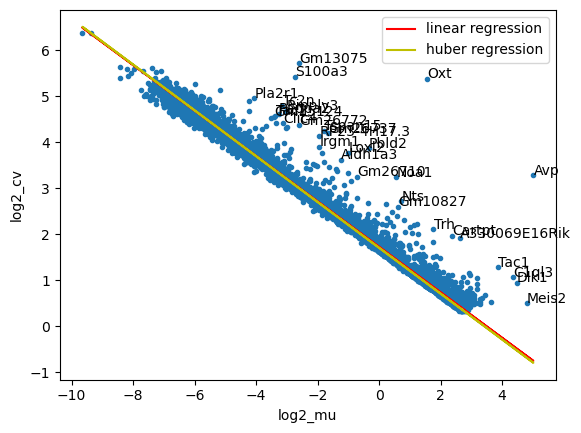

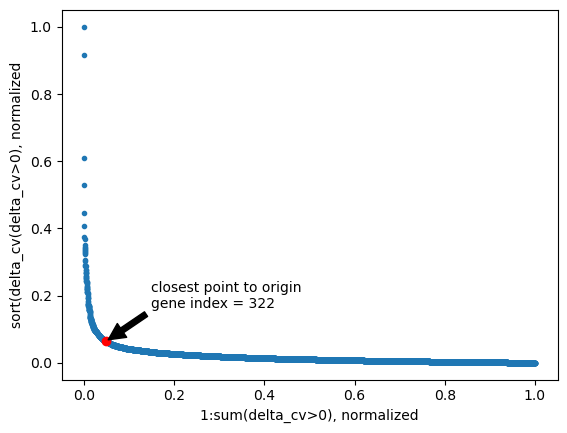

(322, 6788)
True
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


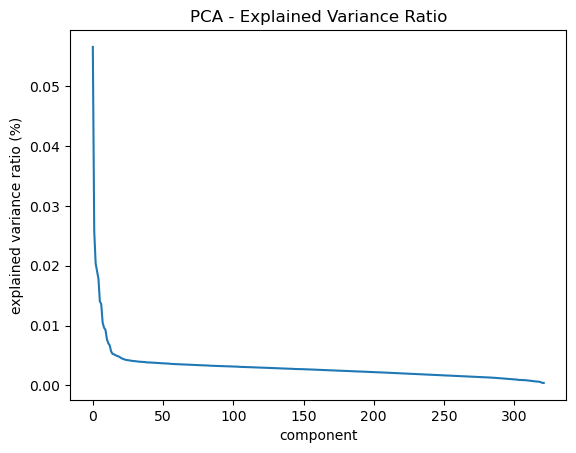

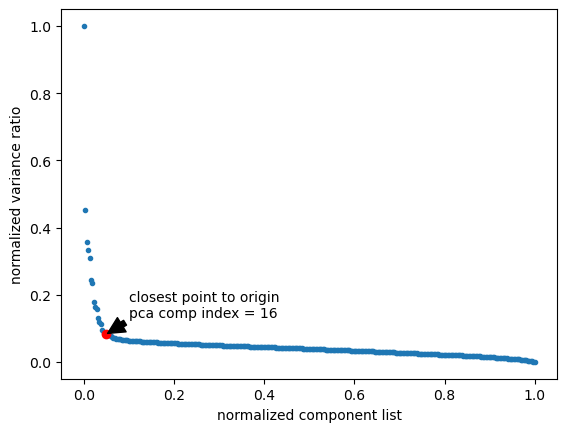

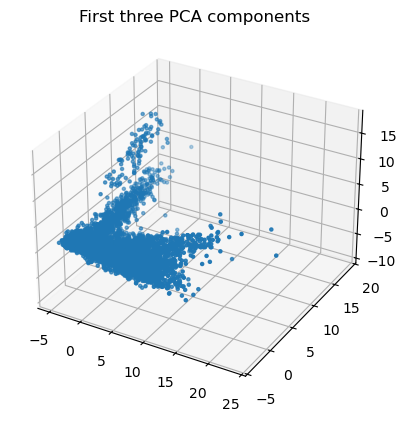

2024-12-31 14:42:23,559 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-31 14:42:24,354 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-31 14:42:24,375 - harmonypy - INFO - Iteration 1 of 20
2024-12-31 14:42:25,735 - harmonypy - INFO - Iteration 2 of 20
2024-12-31 14:42:27,042 - harmonypy - INFO - Iteration 3 of 20
2024-12-31 14:42:28,051 - harmonypy - INFO - Iteration 4 of 20
2024-12-31 14:42:29,013 - harmonypy - INFO - Iteration 5 of 20
2024-12-31 14:42:30,147 - harmonypy - INFO - Iteration 6 of 20
2024-12-31 14:42:30,998 - harmonypy - INFO - Iteration 7 of 20
2024-12-31 14:42:32,082 - harmonypy - INFO - Iteration 8 of 20
2024-12-31 14:42:32,949 - harmonypy - INFO - Iteration 9 of 20
2024-12-31 14:42:33,441 - harmonypy - INFO - Iteration 10 of 20
2024-12-31 14:42:34,359 - harmonypy - INFO - Iteration 11 of 20
2024-12-31 14:42:34,857 - harmonypy - INFO - Converged after 11 iterations


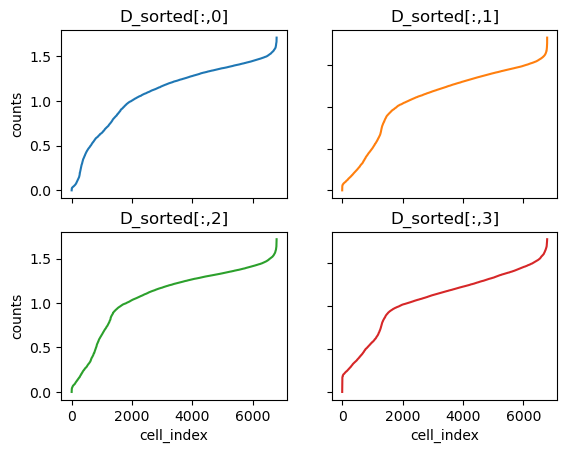

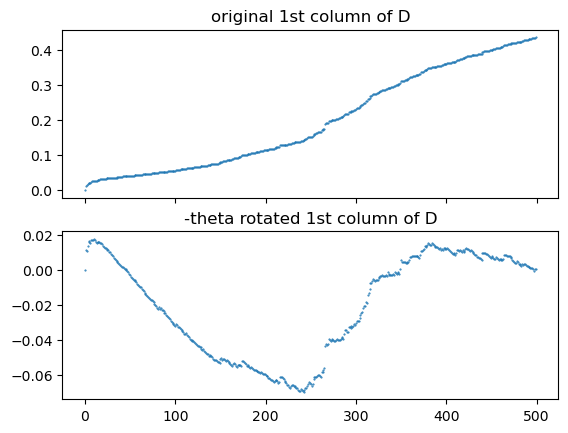

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 53.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


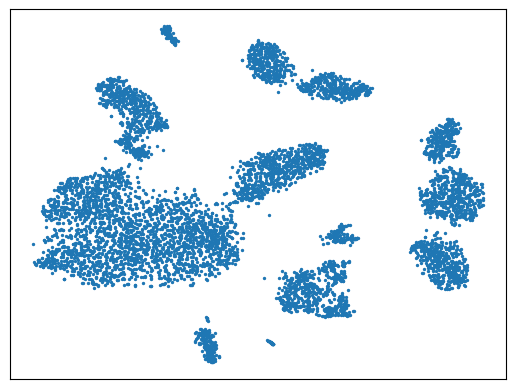

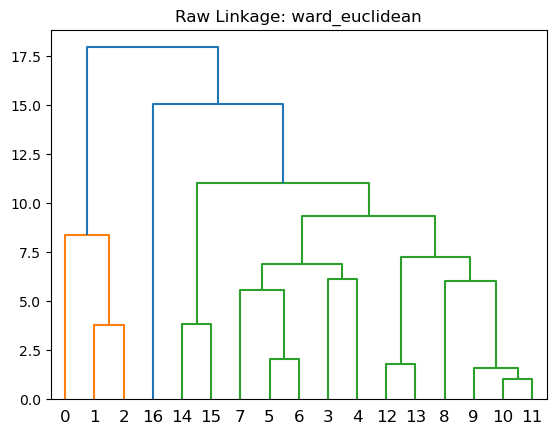

[ 0  1  2 14 15 12 13 11 10  9  8  7  6  5  3  4 16]


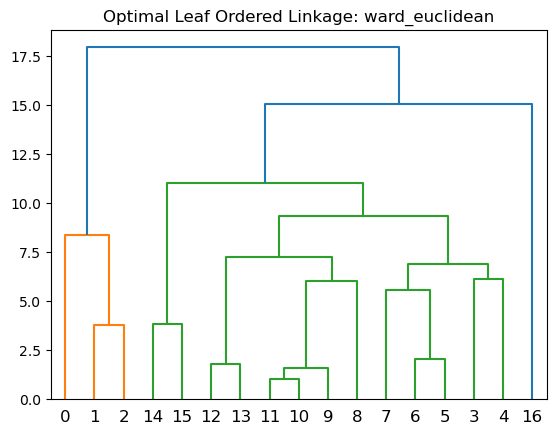

metadata df shape post inter cluster sort
(29, 6788)


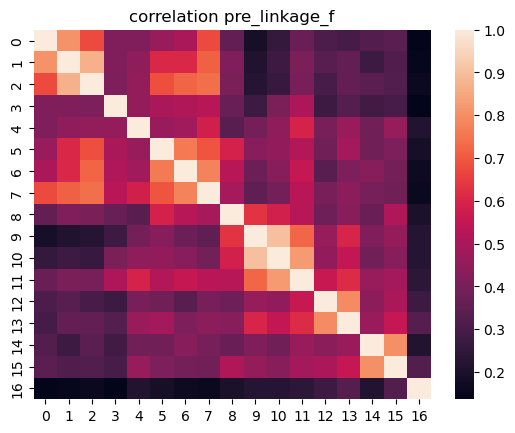

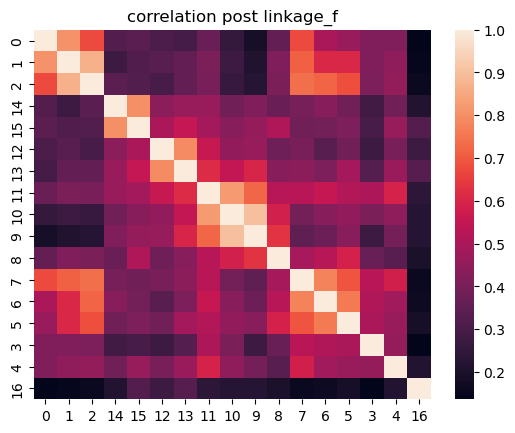

{1: 1, 2: 2, 3: 3, 15: 4, 16: 5, 13: 6, 14: 7, 12: 8, 11: 9, 10: 10, 9: 11, 8: 12, 7: 13, 6: 14, 4: 15, 5: 16, 17: 17}
[1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17]
len marker_Genes_sorted 95
len marker_genes_sorted_final 95
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 284, 818, 1266, 1613, 1959, 2423, 2601, 2659, 4284, 5055, 5723, 5865, 5940, 6466, 6661, 6681, 6787]
[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16]
16
[array([ 0,  1,  2,  3,  4,  5,  6, 65, 10, 51]), array([ 7, 12,  9,  8, 11]), array([16, 13, 17, 18, 15, 71, 14]), array([45, 49, 23, 22, 62, 56, 20, 21, 19]), array([29, 26, 25, 28]), array([35, 33, 32, 30, 31, 34]), array([38, 36, 40, 39]), array([44, 41]), array([52, 53, 48, 46, 55]), array([57, 58, 50, 61, 60]), array([63, 59, 64, 67]), array([54, 70, 69, 68]), array([42, 72, 75, 76, 74]), array([73, 80, 79, 78, 77, 82, 83, 81]), array([88, 43, 66, 87, 84, 85, 86]), array([92

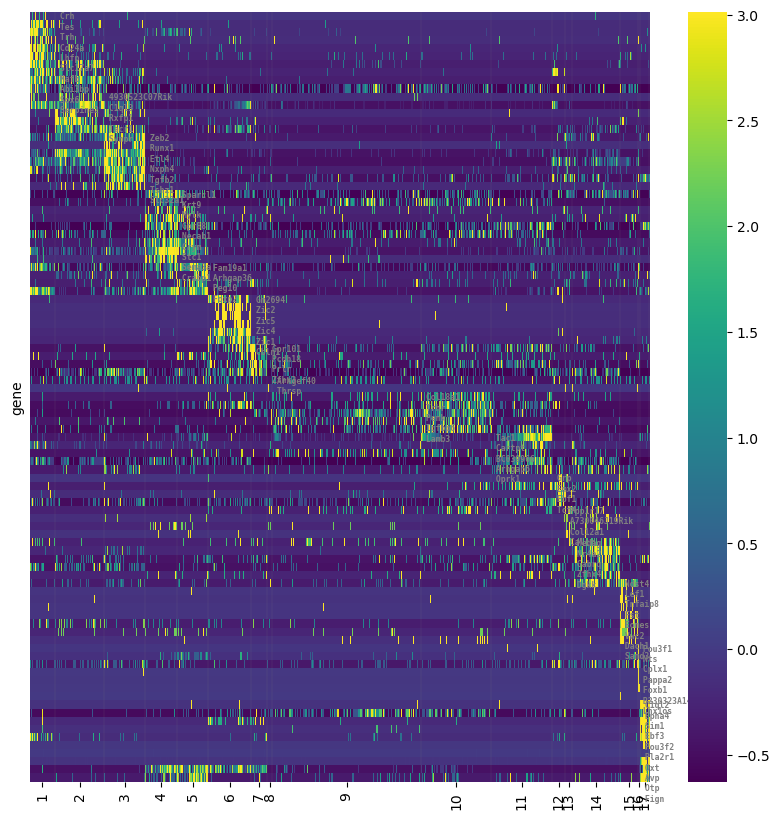

In [96]:
Vglut2_filtered_folder = '/bigdata/isaac/Vglut2_files/filtered/'
cell_class = 'Vglut2'
%matplotlib inline
Vglut2_df_marker_f, Vglut2_arr_tsne_f, Vglut2_meta_data_df_plis_f, Vglut2_meta_data_df_pca, Vglut2_mgs_f, Vglut2_ind_f, Vglut2_ind_s_f, Vglut2_df_marker_log_and_std_col_f, Vglut2_pos_f, Vglut2_linkage_cluster_order_filtered, Vglut2_change_indices_f = dp_rc.reprocess(Vglut2_df_ge,Vglut2_meta_data_df_plis_filtered,Vglut2_linkage_cluster_order_filtered,Vglut2_cluster_indices_filtered,Vglut2_filtered_folder,cell_class, sort = True, write_to_file=False)

/tmp/ipykernel_3115776/999875081.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(Vglut2_linkage_cluster_order_filtered, rotation = 90)


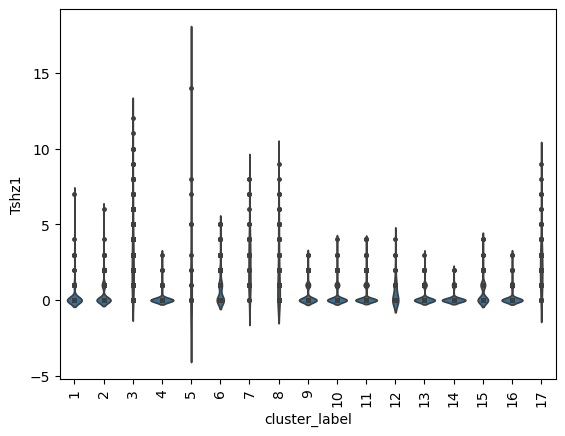

In [364]:
#check some specific expression of genes
gene = 'Tshz1'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=Vglut2_meta_data_df_plis_filtered.T['cluster_label'], y=Vglut2_df_plis_filtered.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(Vglut2_linkage_cluster_order_filtered, rotation = 90)
plt.show()

In [126]:
Vglut2_meta_data_df_plis_filtered.loc[:,Vglut2_meta_data_df_plis_filtered.loc['cluster_label',:]==7].shape[1]

326

In [365]:
np.all(Vglut2_df_marker_f.columns == Vglut2_meta_data_df_plis_f.columns)

True

## 4) Add cluster labels (manual)

In [104]:
Vglut2_filtered_folder = '/bigdata/isaac/Vglut2_files/filtered/'
Vglut2_labels = dp.get_cluster_labels(Vglut2_filtered_folder, 'Vglut2_filtered_labels_rc.csv')
Vglut2_labels

['Trh-Tes',
 'Synpr-Sox6',
 'Tshz1-Tgfb2',
 'Otp-Crabp1',
 'Otp-Peg10',
 'Otp-Zic5',
 'Otp-Prlr',
 'Arhgef40-Thrsp',
 'Epha4-Penk',
 'Lamb3-Col18a1',
 'Tac1-Cartpt',
 'Tshz1-Grp',
 'Tshz1-Calcr',
 'Zfhx4-Nr4a2',
 'Eomes-Tnfaip8',
 'Foxb1-Lhx1os',
 'Otp-Avp']

### add label markers to plis filtered metadata

In [105]:
Vglut2_meta_data_df_plis_f_markers = dp.update_metadata_w_markers(Vglut2_filtered_folder, 
                                                                         Vglut2_meta_data_df_plis_f,
                                                                         Vglut2_linkage_cluster_order_filtered,
                                                                         Vglut2_labels,
                                                                         'Vglut2',
                                                                        write_to_file = False)


### updated heatmap with labels

[0, 1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16]
16
[array([ 0,  1,  2,  3,  4,  5,  6, 65, 10, 51]), array([ 7, 12,  9,  8, 11]), array([16, 13, 17, 18, 15, 71, 14]), array([45, 49, 23, 22, 62, 56, 20, 21, 19]), array([29, 26, 25, 28]), array([35, 33, 32, 30, 31, 34]), array([38, 36, 40, 39]), array([44, 41]), array([52, 53, 48, 46, 55]), array([57, 58, 50, 61, 60]), array([63, 59, 64, 67]), array([54, 70, 69, 68]), array([42, 72, 75, 76, 74]), array([73, 80, 79, 78, 77, 82, 83, 81]), array([88, 43, 66, 87, 84, 85, 86]), array([92, 47, 37, 93, 94, 91, 90, 89, 24, 27])]
16


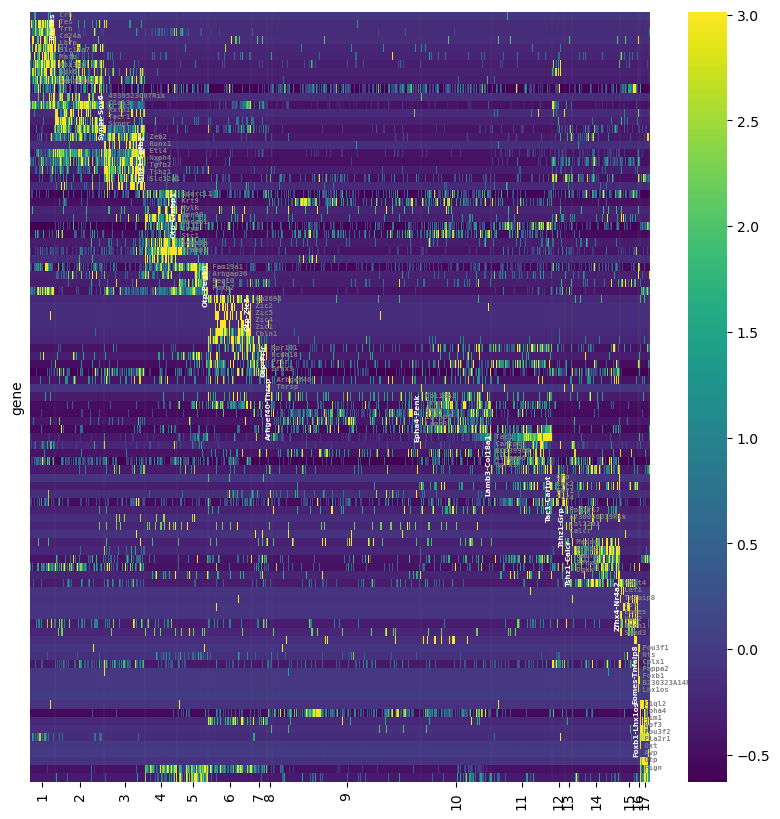

In [162]:
#plot heatmap w/ labels
%matplotlib inline
linkage_alg = 'ward'
dist_metric = 'euclidean'
Vglut2_tg_f, Vglut2_tgfs_f = dp.get_heatmap_labels(Vglut2_mgs_f, Vglut2_ind_f, Vglut2_ind_s_f)
#sanity check - plotting only filtered gaba_df (clusters removed)
dp.plot_marker_heatmap(Vglut2_df_marker_log_and_std_col_f, 
                       Vglut2_pos_f, 
                       Vglut2_linkage_cluster_order_filtered, 
                       Vglut2_change_indices_f, 
                       Vglut2_tg_f, 
                       Vglut2_tgfs_f, 
                       linkage_alg,
                       dist_metric,
                       Vglut2_filtered_folder,
                       fs_waterfall = 5.2,
                       cluster_labels = Vglut2_labels,
                       savefig = True,
                       cell_class = 'Vglut2_filtered_tg_reenrich_labeled')

In [153]:
Vglut2_tg_f

[['Crh',
  'Tes',
  'Trh',
  'Cd24a',
  'Lhfp',
  'Slc17a7',
  'Mafb',
  'Abi3bp',
  'Sox6',
  'Serpine2'],
 ['4930523C07Rik', 'C1ql3', 'Rxfp1', 'Tacr1', 'Synpr'],
 ['Zeb2', 'Runx1', 'Etl4', 'Nxph4', 'Tgfb2', 'Tshz1', 'Slc32a1'],
 ['Sparcl1',
  'Krt9',
  'Mylk',
  'Gpr88',
  'Necab1',
  'Crym',
  'Stc1',
  'Sema3a',
  'Crabp1'],
 ['Fam19a1', 'Arhgap36', 'Peg10', 'Foxp2'],
 ['Gm2694', 'Zic2', 'Zic5', 'Zic4', 'Zic1', 'Cbln1'],
 ['Gpr101', 'Pcdh18', 'Prlr', 'Zfhx3'],
 ['Arhgef40', 'Thrsp'],
 ['Col18a1', 'Trhr', 'Penk', 'Igfbp6', 'Lamb3'],
 ['Tac1', 'Cartpt', 'BC039966', 'Arhgap6', 'Oprk1'],
 ['Grp', 'Emx2', 'Ebf1', 'Tcf4'],
 ['Ppp1r17', 'A730046J19Rik', 'Col12a1', 'Calcr'],
 ['Medag', 'Nr4a2', 'Gabrq', 'Zfhx4', 'Dgkk'],
 ['Ndst4', 'Lef1', 'Tnfaip8', 'Fst', 'Eomes', 'Vwc2', 'Dach1', 'Samd3'],
 ['Pou3f1', 'Nts', 'Cplx1', 'Pappa2', 'Foxb1', 'B230323A14Rik', 'Lhx1os'],
 ['C1ql2',
  'Epha4',
  'Sim1',
  'Ebf3',
  'Pou3f2',
  'Pla2r1',
  'Oxt',
  'Avp',
  'Otp',
  'Fign']]

## 5) Updated TSNE Plot

In [383]:
Vglut2_meta_data_df_plis_filtered_markers.shape

(30, 6788)

In [381]:
Vglut2_arr_tsne_f.shape

(6788, 2)

In [385]:
cell_class

'GABA'

In [420]:
np.all(Vglut2_meta_data_df_pca.T.columns == Vglut2_meta_data_df_plis_f_markers)

False

In [421]:
np.all(Vglut2_meta_data_df_pca.T.columns == Vglut2_meta_data_df_plis_filtered.columns)

True

In [422]:
Vglut2_meta_data_df_plis_filtered_tsne = dp.update_metadata_w_markers(folder, Vglut2_meta_data_df_plis_filtered, Vglut2_linkage_cluster_order_filtered, Vglut2_labels, cell_class, write_to_file = False)

In [425]:
np.all(Vglut2_meta_data_df_plis_filtered_tsne.columns == Vglut2_meta_data_df_plis_f_markers.columns)

False

In [99]:
Vglut2_label_color_df = pd.read_excel(Vglut2_filtered_folder + 'Vglut2_filtered_labels_rc.xlsx')
Vglut2_m_2_c_dict = dict(zip(Vglut2_label_color_df.loc[:,'markers'],Vglut2_label_color_df.loc[:,'hex']))


In [527]:
Vglut2_m_2_c_dict

{'Trh-Tes': '75bbfd',
 'Synpr-Sox6': '75bbfd',
 'Tshz1-Tgfb2': '75bbfd',
 'Otp-Crabp1': '0343df',
 'Otp-Peg10': '0343df',
 'Otp-Zic5': '0343df',
 'Otp-Prlr': '0343df',
 'Arhgef40-Thrsp': '030aa7',
 'Epha4-Penk': '030aa7',
 'Lamb3-Col18a1': '030aa7',
 'Tac1-Cartpt': '030aa7',
 'Tshz1-Grp': '510ac9',
 'Tshz1-Calcr': '510ac9',
 'Zfhx4-Nr4a2': '510ac9',
 'Eomes-Tnfaip8': '510ac9',
 'Foxb1-Lhx1os': '510ac9',
 'Otp-Avp': 'be03fd'}

In [599]:
Vglut2_filtered_folder

'/bigdata/isaac/Vglut2_files/filtered/'

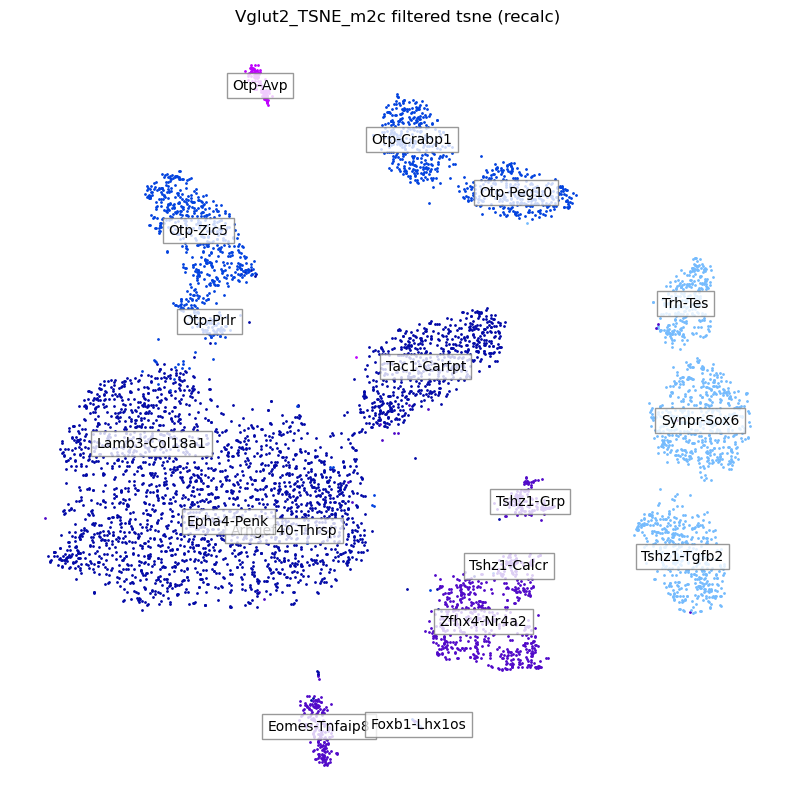

In [106]:
#Vglut2_meta_data_df_plis_filtered_tsne = dp.update_metadata_w_markers(folder, Vglut2_meta_data_df_plis_filtered, Vglut2_linkage_cluster_order_filtered, Vglut2_labels, 'Vglut2_TSNE', write_to_file = False)
#resort tsne index to match index of final labeled metadata
Vglut2_tsne_arr_tmp = pd.DataFrame(index=Vglut2_meta_data_df_plis_filtered.columns, data=Vglut2_arr_tsne_f)
Vglut2_tsne_arr_tmp_ri = Vglut2_tsne_arr_tmp.reindex(index = Vglut2_meta_data_df_plis_f_markers.columns)

dp.plot_rc_tsne(Vglut2_meta_data_df_plis_f_markers,Vglut2_tsne_arr_tmp_ri.values,'Vglut2_TSNE_m2c', Vglut2_filtered_folder,m_2_c_dict=Vglut2_m_2_c_dict,savefig=True)


## 6) Violin Plots


In [330]:
Vglut2_df_plis_filtered.shape

(351, 6788)

In [368]:
np.all(Vglut2_df_marker_f.columns == Vglut2_meta_data_df_plis_f_markers.columns)

True

In [415]:
'Slc17a6' in Vglut2_df_ge.index

False

In [ ]:
Vglut2_adata_f = ad.AnnData(Vglut2_df_marker_f.T)
#or use full gene list to get
#add aligned metadata
for x in Vglut2_meta_data_df_plis_f_markers.index:
    Vglut2_adata_f.obs[str(x)] = Vglut2_meta_data_df_plis_f_markers.loc[str(x),:]

Vglut2_markers = Vglut2_adata_f.obs['markers']
_, idx = np.unique(Vglut2_adata_f.obs['markers'], return_index=True)
Vglut2_markers = list(Vglut2_markers[np.sort(idx)])

/tmp/ipykernel_3115776/1252054059.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  Vglut2_markers = list(Vglut2_markers[np.sort(idx)])


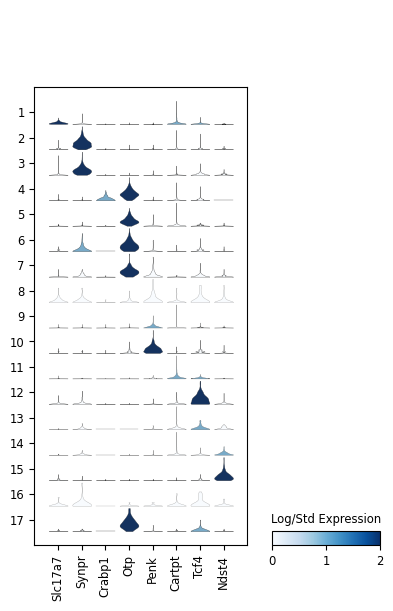

In [418]:
Vglut2_violin_markers = ['Slc17a7','Synpr','Crabp1','Otp','Penk','Cartpt','Tcf4','Ndst4']
sc.settings.figdir = "/bigdata/isaac/Vglut2_files/filtered"
%matplotlib inline
#save = 'Vglut2_violin.pdf'
#for using markers as category labels:
#groupby='markers', categories_order= Vglut2_markers

sc.pl.stacked_violin(Vglut2_adata_f, Vglut2_violin_markers, groupby='cluster_label', colorbar_title = 'Log/Std Expression', vmax=2, density_norm = 'width', save = 'Vglut2_violin_clabels.pdf')  
                                                                                                                                                                                                                                        


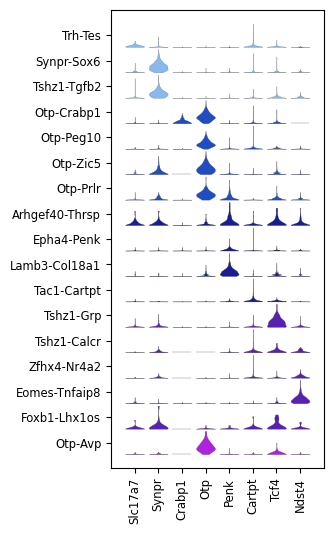

In [597]:
%matplotlib inline
sc.settings.figdir = "/bigdata/isaac/Vglut2_files/filtered"
# Create a custom color palette
Vglut2_palette = {k: f"#{v}" for k, v in Vglut2_m_2_c_dict.items()}
Vglut2_custom_palette = sns.color_palette(list(Vglut2_palette.values()))
sns.set_palette(Vglut2_custom_palette)

sc.pl.stacked_violin(Vglut2_adata_f, 
                     Vglut2_violin_markers, 
                     groupby='markers', 
                     categories_order= Vglut2_markers, 
                     #colorbar_title = 'Log/Std Expression', 
                     #vmax=2, 
                     #density_norm = 'width', 
                     row_palette = Vglut2_custom_palette, 
                     save = 'Vglut2_violin_markers_m2c.pdf')

## Combine, format, and write out metadata

In [474]:
GABA_meta_data_df_plis_f_markers

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CCGCAAGGTGTTATCG-1_10X36_1,GCAACATAGATCGACG-1_10X51_2,ACACCAATCTACCCAC-1_10X52_2,TGCTCCAAGAGGCGTT-1_10X51_1,CGAGTGCAGGCAGTCA-1_10X37_2,GTTCGCTCACCCTCTA-1_10X35_2,AAGATAGGTAACACCT-1_10X37_2,CAACAACAGACATATG-1_10X35_2,GTAGATCGTTGACGGA-1_10X51_3,GATGAGGGTATAATGG-1_10X52_2
Serial_Number,103.0,102.0,102.0,103.0,98.0,101.0,98.0,63.0,66.0,70.0,...,65.0,98.0,102.0,97.0,68.0,64.0,68.0,64.0,99.0,102.0
Date_Captured,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,2019-11-20,2019-11-24,2019-12-01,...,2019-11-24,05/31/20,05/31/20,05/31/20,2019-11-25,2019-11-20,2019-11-25,2019-11-20,05/31/20,05/31/20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,,,,...,,C57Bl/6,C57Bl/6,C57Bl/6,,,,,C57Bl/6,C57Bl/6
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Breeder-M,Breeder-F,Breeder-F,Breeder-M,Breeder-F,Breeder-F,Breeder-F,Naïve-F,Naïve-M,Naïve-F,...,Naïve-M,Breeder-F,Breeder-F,Breeder-F,Naïve-M,Naïve-F,Naïve-M,Naïve-F,Breeder-M,Breeder-F
ChipID,10X52,10X52,10X52,10X52,10X51,10X52,10X51,10X35,10X36,10X38,...,10X36,10X51,10X52,10X51,10X37,10X35,10X37,10X35,10X51,10X52
SampleID,10X52_3,10X52_2,10X52_2,10X52_3,10X51_2,10X52_1,10X51_2,10X35_1,10X36_2,10X38_2,...,10X36_1,10X51_2,10X52_2,10X51_1,10X37_2,10X35_2,10X37_2,10X35_2,10X51_3,10X52_2
DonorID,DI-B3-M,DI-B3-F,DI-B3-F,DI-B3-M,DI-B1-F,DI-B3-F,DI-B1-F,"DI1,DI2",DI3,DI6,...,DI3,DI-B1-F,DI-B3-F,DI-B1-F,"DI4,DI5","DI1,DI2","DI4,DI5","DI1,DI2",DI-B1-M,DI-B3-F


In [471]:
GABA_meta_data_df_plis_f_markers.shape

(30, 8501)

In [440]:
Vglut1_meta_data_df_plis_f_markers.shape

(30, 9019)

In [441]:
Vglut2_meta_data_df_plis_f_markers.shape

(30, 6788)

In [472]:
combined_metadata = pd.concat((GABA_meta_data_df_plis_f_markers,Vglut1_meta_data_df_plis_f_markers,Vglut2_meta_data_df_plis_f_markers), axis = 1)

In [476]:
combined_metadata.tail()

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
lengthbp_seqlib,507.0,440.0,440.0,507.0,474.0,466.0,474.0,416.0,486.0,415.0,...,474.0,474.0,487.0,420.0,420.0,466.0,461.0,478.0,476.0,466.0
Sample_Index,F12,E12,E12,F12,A2,D12,A2,D9,A9,C9,...,A2,A2,B2,B9,B9,D12,G8,G1,H8,D12
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
cluster_label,1,1,1,1,1,1,1,1,1,1,...,17,17,17,17,17,17,17,17,17,17
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp


In [477]:
#create 'full_name' row that combines last three rows

# Select the last three rows
last_three_rows = combined_metadata.iloc[-3:]

# Combine the entries to create the 'full_name' row
combined_metadata.loc['full_name',:] = (
    last_three_rows.loc['cell_class'] + '-' +
    last_three_rows.loc['cluster_label'].astype(str) + '-' +
    last_three_rows.loc['markers']
)

combined_metadata.tail()

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
Sample_Index,F12,E12,E12,F12,A2,D12,A2,D9,A9,C9,...,A2,A2,B2,B9,B9,D12,G8,G1,H8,D12
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
cluster_label,1,1,1,1,1,1,1,1,1,1,...,17,17,17,17,17,17,17,17,17,17
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp


In [478]:
#write to file
combined_metadata.to_json('/bigdata/isaac/gaba_glut_combined_metadata_full_name.json')

In [490]:
df_orig.shape

(27933, 79613)

In [492]:
df_orig.loc['mt-Nd4']

AAACCCAAGAGCATAT-1_10X51_2    64
AAACCCAAGCCTCAGC-1_10X51_2    90
AAACCCAAGTACTGTC-1_10X51_2    12
AAACCCACACAACGTT-1_10X51_2    50
AAACCCAGTAACATAG-1_10X51_2    16
                              ..
TTTGTTGCACCGCTGA-1_10X37_2    67
TTTGTTGGTCCATAGT-1_10X37_2    33
TTTGTTGGTTGCGAAG-1_10X37_2    31
TTTGTTGTCGAAGGAC-1_10X37_2    38
TTTGTTGTCTCTGCTG-1_10X37_2    31
Name: mt-Nd4, Length: 79613, dtype: int64

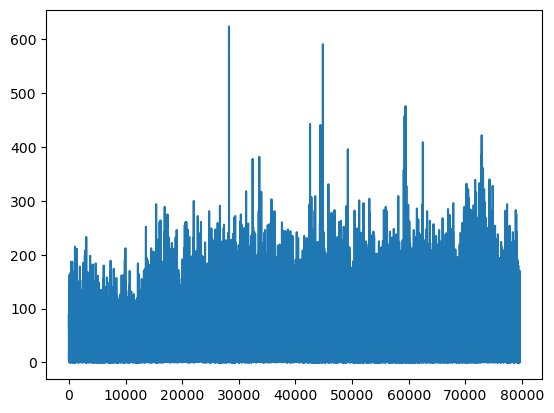

In [494]:
fig,ax = plt.subplots()
ax.plot(np.array(df_orig.loc['mt-Nd4']))
#df_orig.plot.line(x='mt-Nd4')
plt.show()

## Nonneuronal Analysis <a name="nn_analysis"></a>

In [20]:
np.unique(meta_data_df.loc['cell_class'])

array(['Doublet', 'GABA', 'Nonneuronal', 'Vglut1', 'Vglut2'], dtype=object)

## 1) Process (L2)

num m cells: 1338 num f cells: 1658


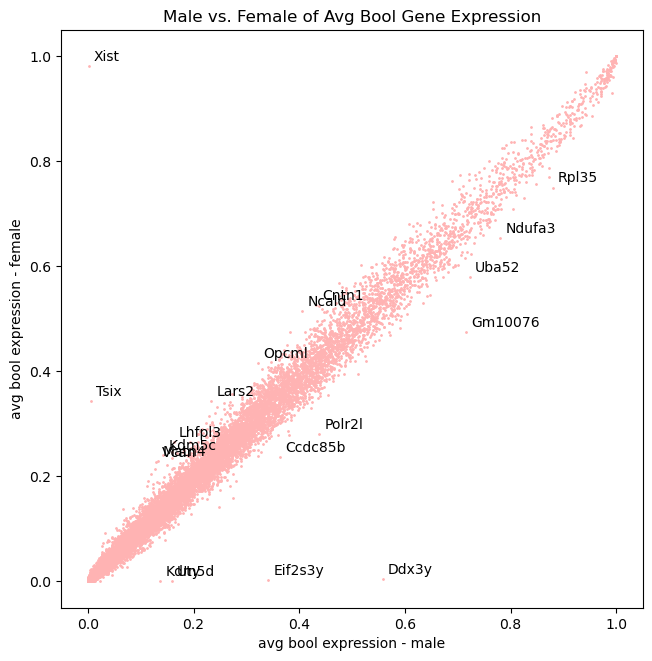

Total genes reduced from 27933 to 14505
removing  5  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']
removing  49  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']
It contains 0 infinite values


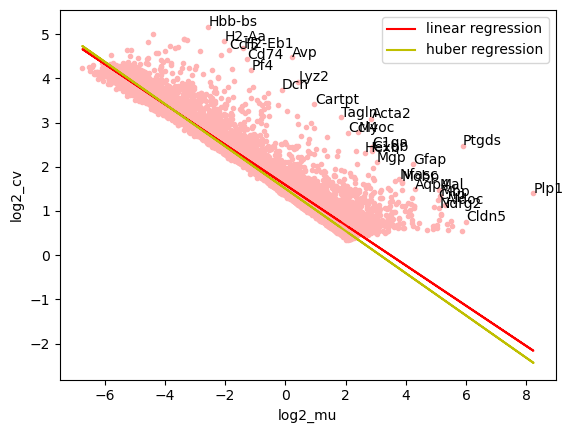

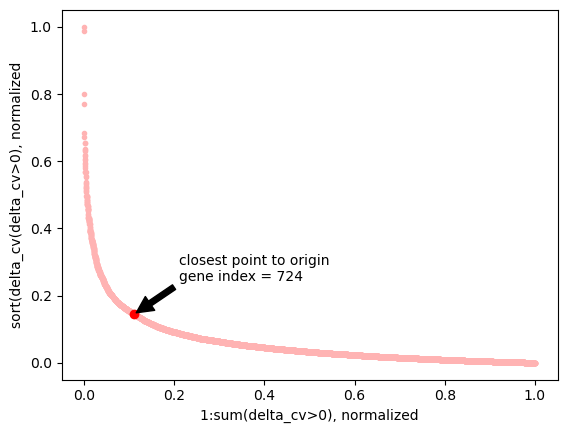

(724, 2996)
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


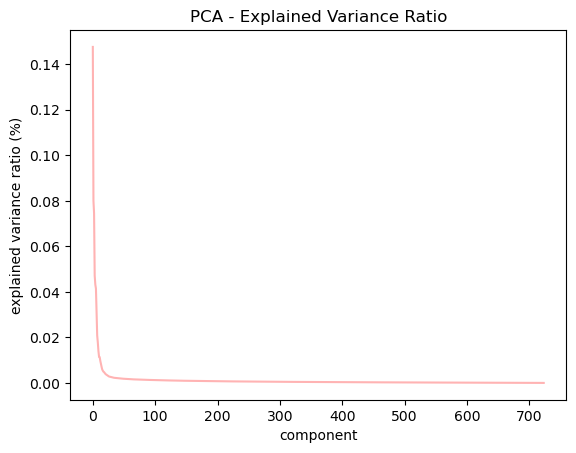

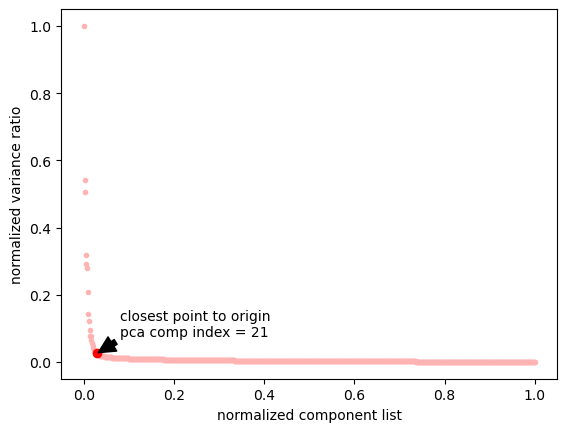

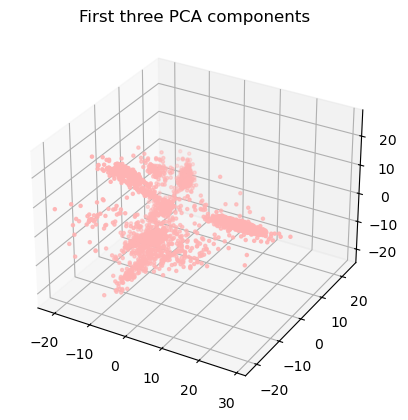

2025-02-17 11:03:06,231 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-02-17 11:03:06,658 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-02-17 11:03:06,669 - harmonypy - INFO - Iteration 1 of 20
2025-02-17 11:03:07,274 - harmonypy - INFO - Iteration 2 of 20
2025-02-17 11:03:07,939 - harmonypy - INFO - Iteration 3 of 20
2025-02-17 11:03:08,476 - harmonypy - INFO - Iteration 4 of 20
2025-02-17 11:03:09,107 - harmonypy - INFO - Iteration 5 of 20
2025-02-17 11:03:09,617 - harmonypy - INFO - Iteration 6 of 20
2025-02-17 11:03:10,249 - harmonypy - INFO - Iteration 7 of 20
2025-02-17 11:03:10,516 - harmonypy - INFO - Converged after 7 iterations


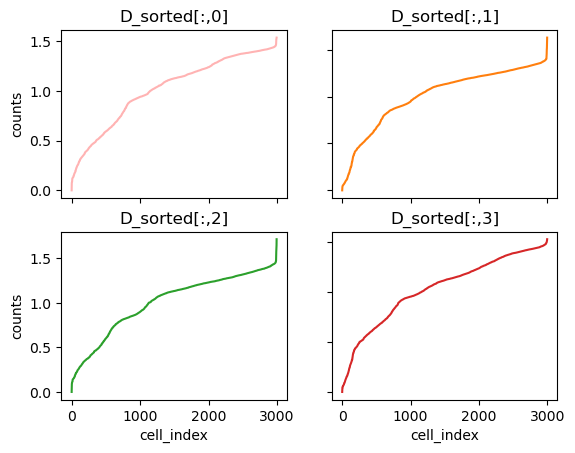

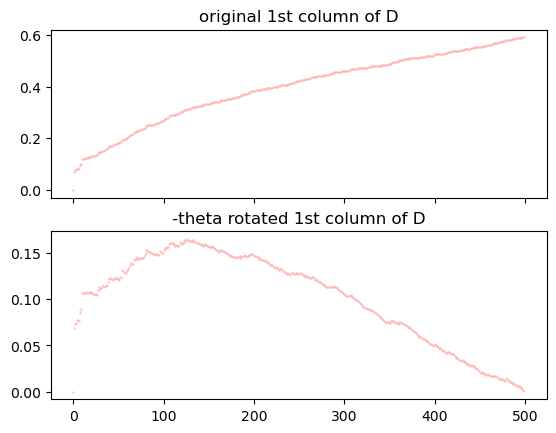

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 75.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


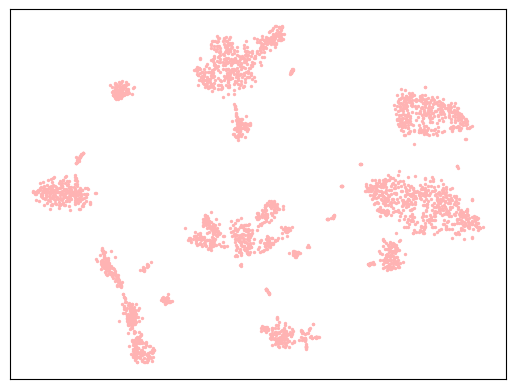

params for dbscan
minpts:  20
epsilon percentile 65
epsilon:  1.5232057607861413

running dbscan with epsilon: 1.5232057607861413  and minpts: 20
Estimated number of clusters: 24
Estimated number of noise points: 245


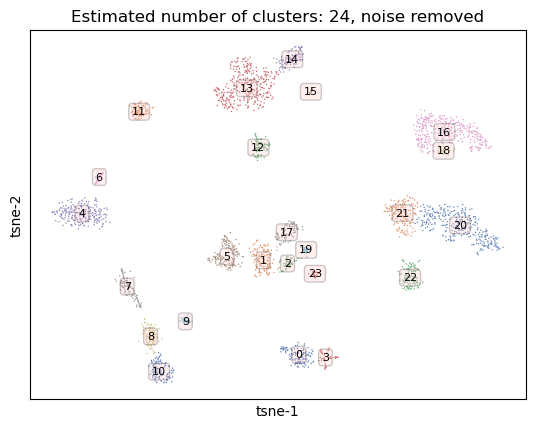

verify raw prelinkage df and raw metadata df have same columns:
True


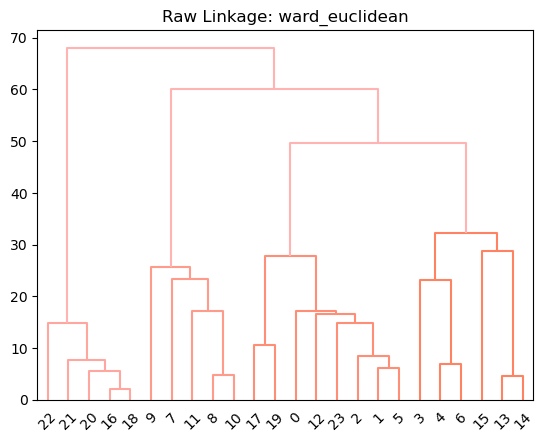

[22 20 18 16 21 15 14 13  6  4  3  0 23  2  1  5 12 17 19  9  8 10 11  7]


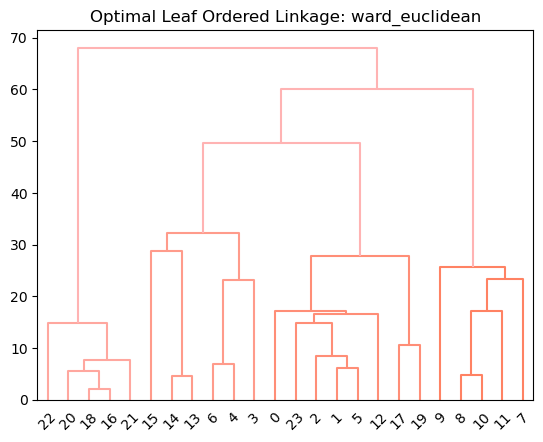

metadata df shape post inter cluster sort
(29, 2751)


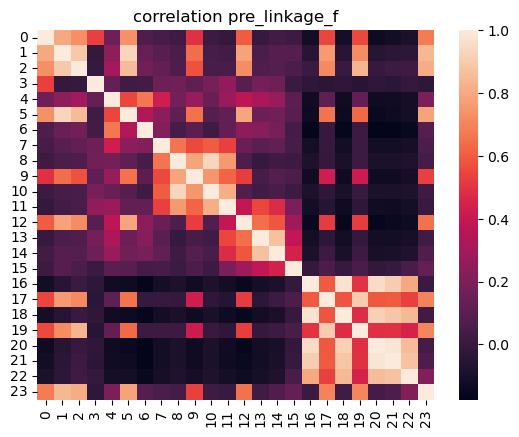

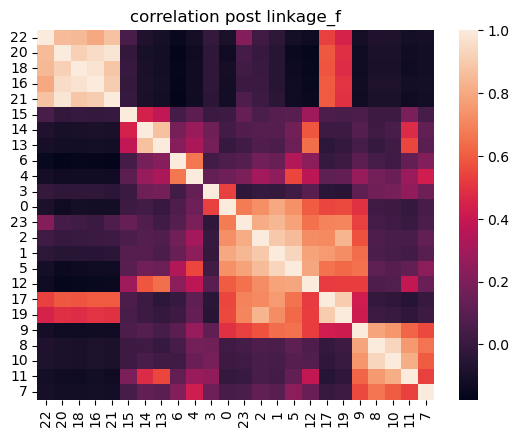

{22: 1, 20: 2, 18: 3, 16: 4, 21: 5, 15: 6, 14: 7, 13: 8, 6: 9, 4: 10, 3: 11, 0: 12, 23: 13, 2: 14, 1: 15, 5: 16, 12: 17, 17: 18, 19: 19, 9: 20, 8: 21, 10: 22, 11: 23, 7: 24}
[0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
check if df plis columns equal metadata df plis columns:
[ True  True  True ...  True  True  True]
len marker_Genes_sorted 164
len marker_genes_sorted_final 164
column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 106, 411, 436, 747, 893, 918, 1012, 1338, 1375, 1600, 1657, 1779, 1802, 1844, 1973, 2110, 2190, 2270, 2299, 2333, 2431, 2550, 2637, 2750]
[0, 1, 2, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23]
21
[array([ 0, 30, 29, 20,  6, 18,  4]), array([ 9, 23, 14, 24, 25, 12, 13, 10, 11, 27, 22,  8,  7, 28, 26]), array([15, 21, 19, 17, 16]), array([35, 32, 33, 34, 31, 51, 38, 37, 36]), array([39, 42, 41, 40, 43, 44, 45]), array([46, 47, 48, 54, 53, 50, 52

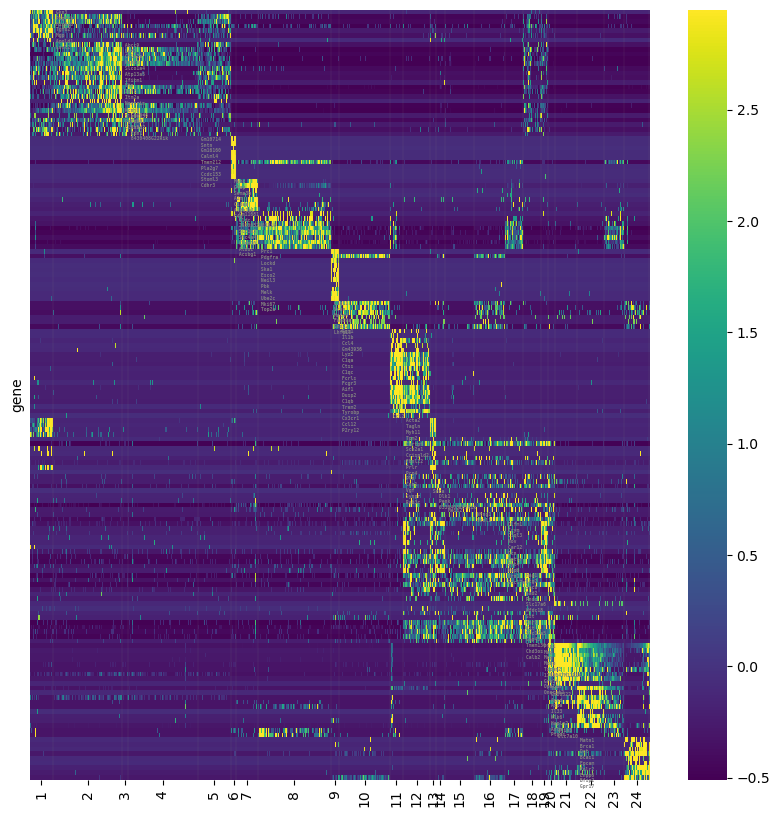

True


In [182]:
%matplotlib inline
#try new process module
NN_folder = '/bigdata/isaac/Nonneuronal_files/'
NN_df_marker, NN_arr_tsne, NN_meta_data_df_plis, NN_linkage_cluster_order, NN_df_marker_log_and_std_col, NN_df_plis, NN_cluster_indices, NN_df_marker_log_and_std, NN_df_ge = dp_c.process(df_orig, meta_data_df, sex_gene_list, IEG_list, NN_folder, 'Nonneuronal')


In [69]:
np.unique(NN_meta_data_df_plis.loc['cluster_label',:]) 

array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
      dtype=object)

In [73]:
NN_meta_data_df_plis.loc[:,NN_meta_data_df_plis.loc['cluster_label',:] == 10].shape[1]

183

In [76]:
for id in np.unique(NN_meta_data_df_plis.loc['cluster_label',:]):
    if NN_meta_data_df_plis.loc[:,NN_meta_data_df_plis.loc['cluster_label',:] == id].shape[1] == 39:
        print (id)

11


In [179]:
NN_arr_tsne.shape

(2996, 2)

In [176]:
NN_meta_data_df_plis.shape

(29, 2748)

/tmp/ipykernel_1329735/2934346080.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)


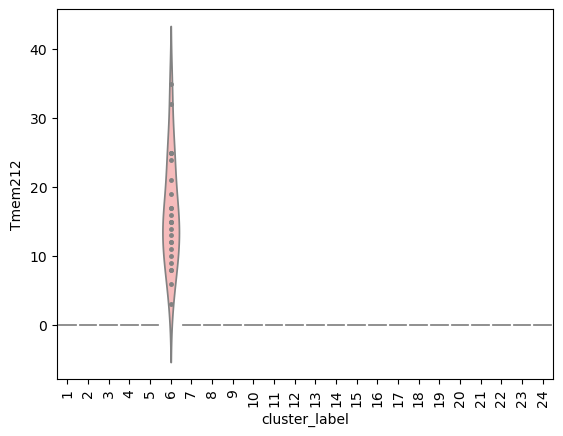

In [183]:
#check some specific expression of genes
gene = 'Tmem212'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=NN_meta_data_df_plis.T['cluster_label'], y=NN_df_plis.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)
plt.show()

# 2) Drop clusters, filter heatmap elements

/tmp/ipykernel_1329735/1298282974.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)


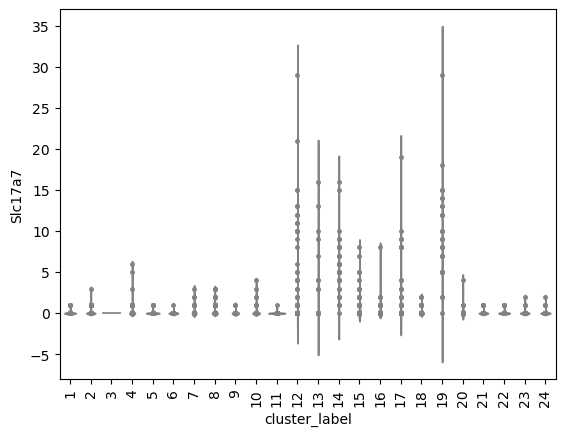

In [184]:
#check some specific expression of genes
gene = 'Slc17a7'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=NN_meta_data_df_plis.T['cluster_label'], y=NN_df_plis.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)
plt.show()

/tmp/ipykernel_1329735/2417090977.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)


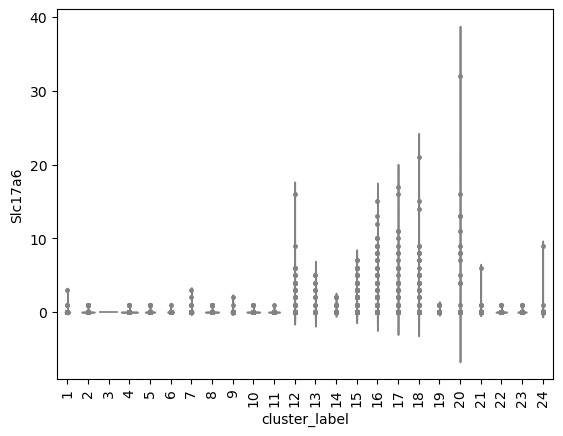

In [185]:
#check some specific expression of genes
gene = 'Slc17a6'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=NN_meta_data_df_plis.T['cluster_label'], y=NN_df_plis.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)
plt.show()

/tmp/ipykernel_1329735/611725898.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)


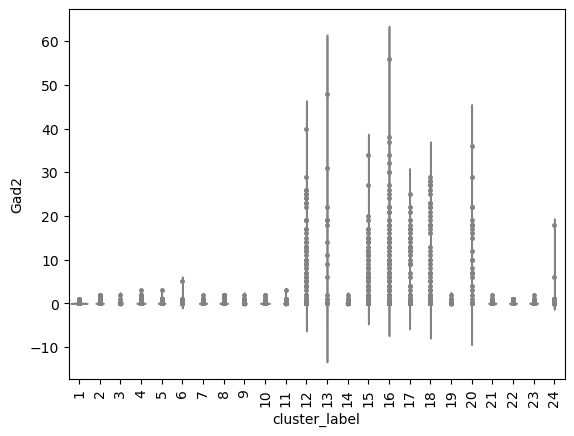

In [186]:
#check some specific expression of genes
gene = 'Gad2'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=NN_meta_data_df_plis.T['cluster_label'], y=NN_df_plis.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)
plt.show()

/tmp/ipykernel_1329735/1156716442.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)


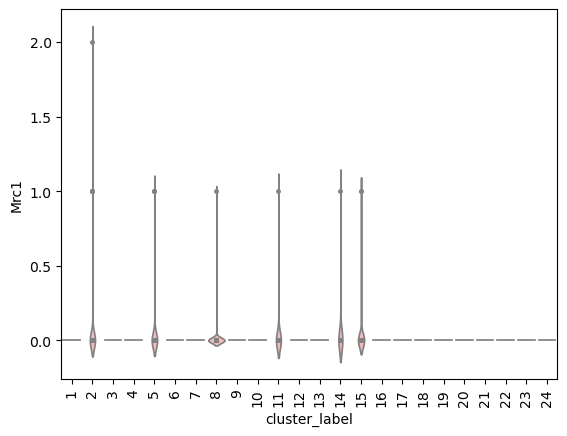

/tmp/ipykernel_1329735/1156716442.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)


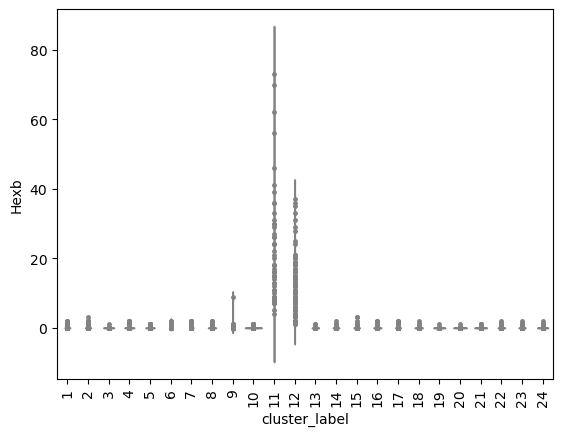

/tmp/ipykernel_1329735/1156716442.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)


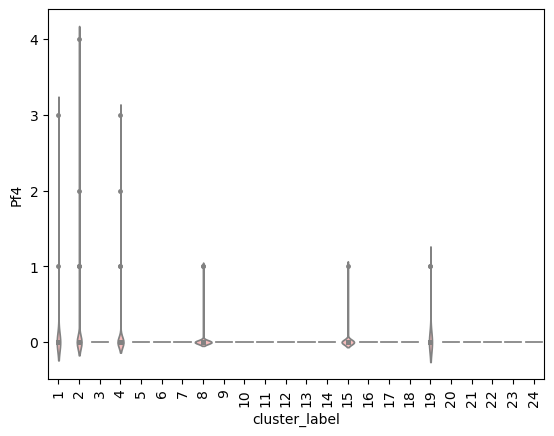

In [193]:
pvm_markers = ['Mrc1','Hexb','Pf4']
%matplotlib inline
for gene in pvm_markers:
    fig,ax = plt.subplots()
    sns.violinplot(x=NN_meta_data_df_plis.T['cluster_label'], y=NN_df_plis.T[gene], inner = 'point')
    #sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
    ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)
    plt.show()

In [105]:
len(NN_cluster_indices[11])

136

In [187]:
NN_clusters_to_drop, NN_thresh_cells = dp.drop_clusters(NN_meta_data_df_plis, NN_linkage_cluster_order, cluster_labels=[12,13,14,15,16,17,18,19,20,24],cluster_keepers=[], thresh_cells=20)
NN_clusters_to_drop

[12, 13, 14, 15, 16, 17, 18, 19, 20, 24]

In [82]:
x = np.delete(NN_linkage_cluster_order, NN_clusters_to_merge[1]-1)
x

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18,
       19])

In [91]:
NN_linkage_cluster_order

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19])

In [ ]:
NN_meta_data_df_plis.loc['cluster_label',NN_meta_data_df_plis.loc['cluster_label',:]==NN_clusters_to_merge[1]] = NN_clusters_to_merge[0]

In [188]:

NN_filtered_folder = '/bigdata/isaac/Nonneuronal_files/filtered/'
NN_df_marker_log_and_std_filtered, NN_df_marker_log_and_std_col_filtered, NN_meta_data_df_plis_filtered, NN_pos_filtered_tmp, NN_df_plis_filtered,NN_linkage_cluster_order_filtered,NN_linkage_cluster_order_filtered_tmp, NN_change_indices_filtered, NN_cluster_indices_filtered  = dp.filter_heatmap_elements(NN_filtered_folder, 'NN', NN_clusters_to_drop,
                                                                                                                                                                                                                                                        NN_df_marker_log_and_std,
                                                                                                                                                                                                                                                        NN_meta_data_df_plis,
                                                                                                                                                                                                                                                        NN_df_plis,
                                                                                                                                                                                                                                                        NN_cluster_indices,
                                                                                                                                                                                                                                                        NN_linkage_cluster_order,
                                                                                                                                                                                                                                                        save_to_file=True)

True
True
Indices where the value changes: [0, 106, 411, 436, 747, 893, 918, 1012, 1338, 1375, 1600, 1657, 1755, 1874, 1960]
change_indices_filtered [106, 411, 436, 747, 893, 918, 1012, 1338, 1375, 1600, 1657, 1755, 1874, 1960]
14
{1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9, 10: 10, 11: 11, 21: 12, 22: 13, 23: 14}
[1 2 3 4 5 6 7 8 9 10 11 21 22 23]


In [195]:
np.unique(NN_meta_data_df_plis_filtered.loc['cluster_label',:])

array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14], dtype=object)

In [196]:
NN_linkage_cluster_order_filtered

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])

In [205]:
lco_tmp = np.delete(NN_linkage_cluster_order_filtered, [x-1 for x in NN_clusters_to_merge[1:]])
lco_tmp

array([ 1,  2,  6,  7,  8,  9, 10, 11, 12, 13, 14])

In [217]:
NN_clusters_to_merge[1:]

[3, 4, 5]

In [222]:
NN_clusters_to_merge = [2,3,4,5]
for i,v in enumerate(NN_clusters_to_merge[1:]):
    #print (v)
    print (NN_meta_data_df_plis_filtered.loc['cluster_label',NN_meta_data_df_plis_filtered.loc['cluster_label',:]==v].shape)    


(25,)
(311,)
(146,)


In [223]:
print (NN_meta_data_df_plis_filtered.loc['cluster_label',NN_meta_data_df_plis_filtered.loc['cluster_label',:]==NN_clusters_to_merge[0]].shape)    

(305,)


In [207]:
NN_meta_data_df_plis_filtered.loc['cluster_label',NN_meta_data_df_plis_filtered.loc['cluster_label',:]==NN_clusters_to_merge[2]]

CAGATCAAGCCGCTTG-1_10X35_1    4
AACCAACGTATTAAGG-1_10X38_1    4
TTGGGCGAGACGCTCC-1_10X38_1    4
ACAACCACACGACAAG-1_10X38_1    4
CACGTTCAGGTAGCCA-1_10X37_1    4
                             ..
CGTTGGGTCAAATGCC-1_10X51_3    4
TCGAAGTCATCTAGAC-1_10X51_4    4
CGGAATTTCACCCTCA-1_10X52_4    4
ACGTCCTCACGGGCTT-1_10X52_3    4
ATTGGGTAGCACCGAA-1_10X35_1    4
Name: cluster_label, Length: 311, dtype: object

In [224]:
#merge clusters
NN_clusters_to_merge = [2,3,4,5]
NN_filtered_folder = '/bigdata/isaac/Nonneuronal_files/filtered/'
NN_meta_data_df_plis_filtered_merged, NN_linkage_cluster_order_filtered_merged  = dp.merge_heatmap_elements(NN_clusters_to_merge,
                                                                                                            NN_df_marker_log_and_std_filtered,
                                                                                                            NN_meta_data_df_plis_filtered,
                                                                                                            NN_df_plis_filtered ,
                                                                                                            NN_linkage_cluster_order_filtered) 

merging all
True
True
Indices where the value changes: [0, 106, 893, 918, 1012, 1338, 1375, 1600, 1657, 1755, 1874, 1960]
change_indices_filtered [106, 893, 918, 1012, 1338, 1375, 1600, 1657, 1755, 1874, 1960]
11
{1: 1, 2: 2, 6: 3, 7: 4, 8: 5, 9: 6, 10: 7, 11: 8, 12: 9, 13: 10, 14: 11}
[1 2 6 7 8 9 10 11 12 13 14]


In [225]:
NN_meta_data_df_plis_filtered_merged.loc[:,NN_meta_data_df_plis_filtered_merged.loc['cluster_label',:]==2].shape[1]

787

## 3) run rc (recalc) to get filtered df marker, tsne arr

It contains 0 infinite values


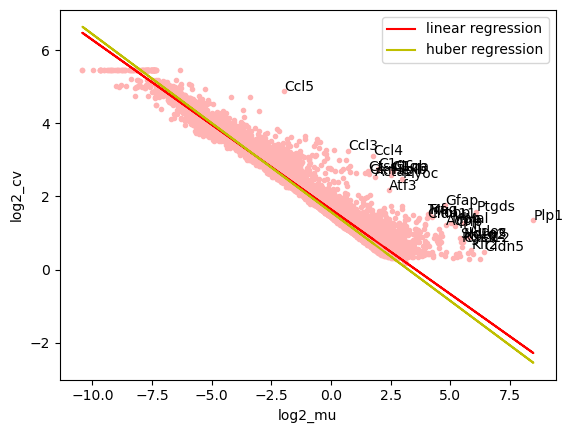

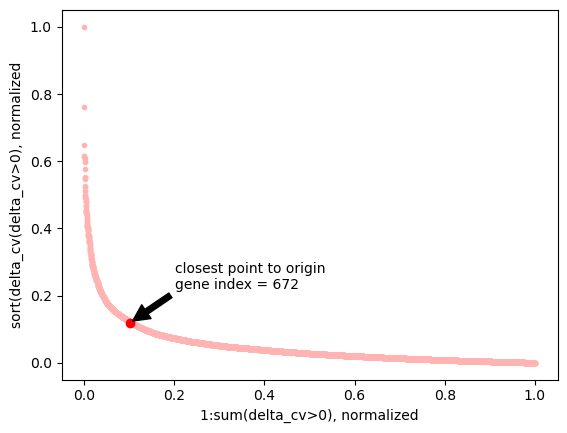

(672, 1961)
True
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


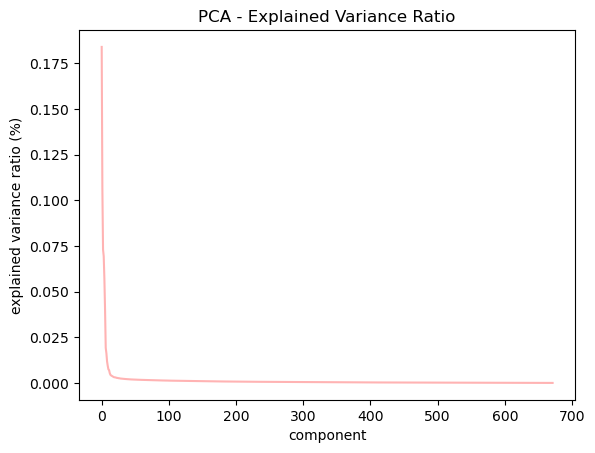

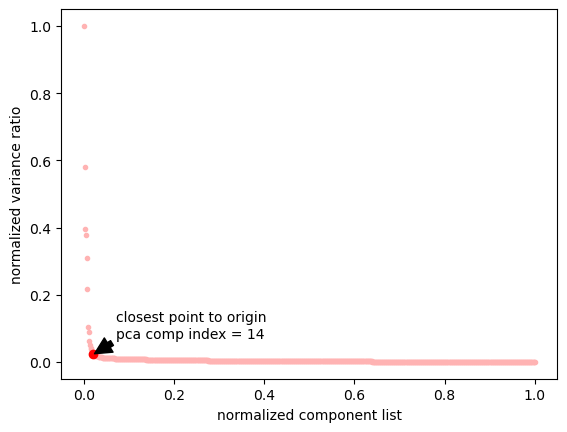

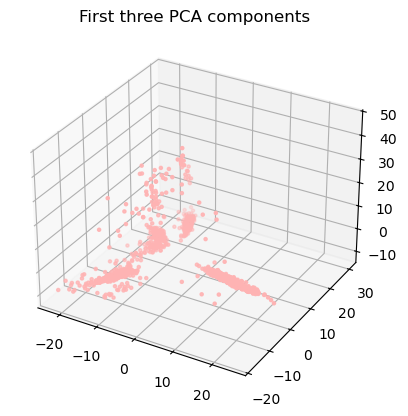

2025-02-17 11:34:12,445 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-02-17 11:34:12,674 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-02-17 11:34:12,678 - harmonypy - INFO - Iteration 1 of 20
2025-02-17 11:34:12,901 - harmonypy - INFO - Iteration 2 of 20
2025-02-17 11:34:13,124 - harmonypy - INFO - Iteration 3 of 20
2025-02-17 11:34:13,280 - harmonypy - INFO - Iteration 4 of 20
2025-02-17 11:34:13,368 - harmonypy - INFO - Iteration 5 of 20
2025-02-17 11:34:13,445 - harmonypy - INFO - Iteration 6 of 20
2025-02-17 11:34:13,524 - harmonypy - INFO - Iteration 7 of 20
2025-02-17 11:34:13,602 - harmonypy - INFO - Iteration 8 of 20
2025-02-17 11:34:13,680 - harmonypy - INFO - Iteration 9 of 20
2025-02-17 11:34:13,768 - harmonypy - INFO - Converged after 9 iterations


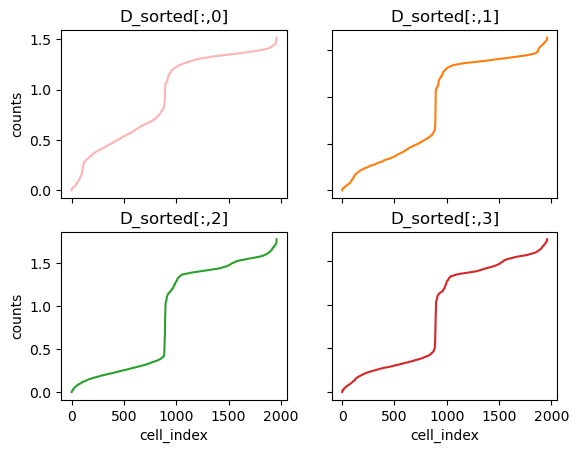

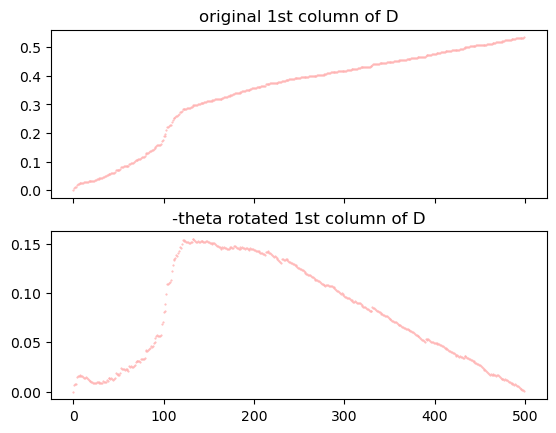

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 74.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


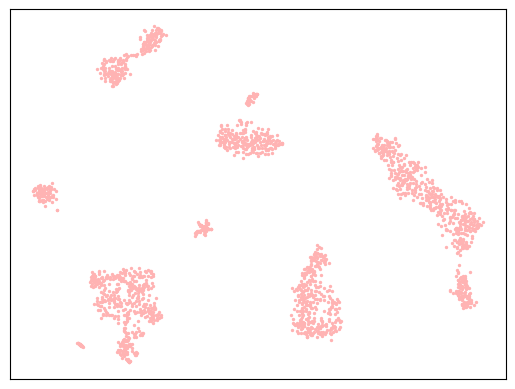

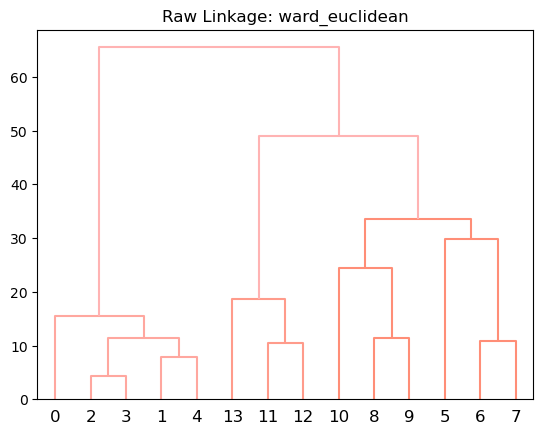

[ 0  4  1  3  2  5  6  7  8  9 10 13 12 11]


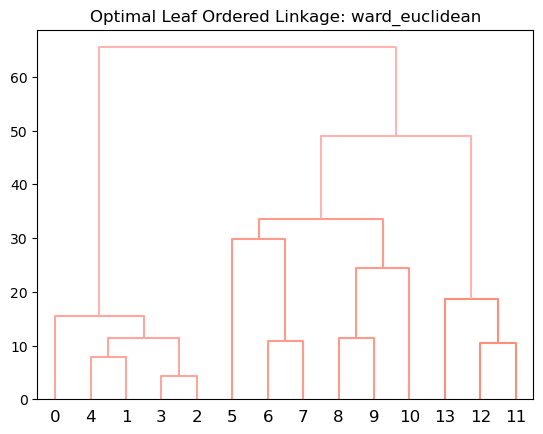

metadata df shape post inter cluster sort
(29, 1961)


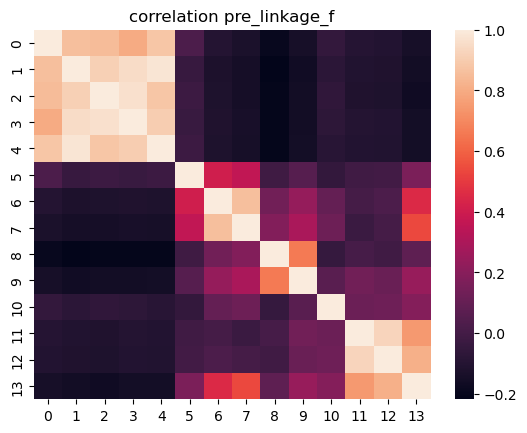

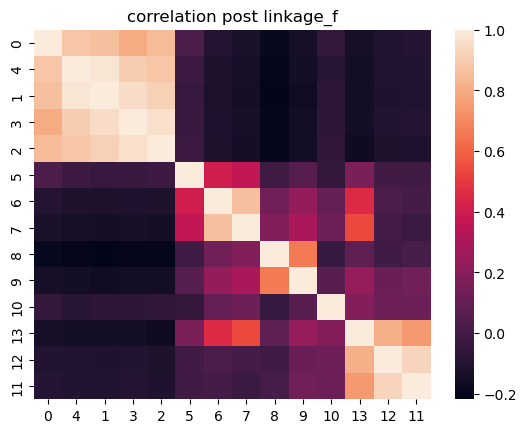

{1: 1, 5: 2, 2: 3, 4: 4, 3: 5, 6: 6, 7: 7, 8: 8, 9: 9, 10: 10, 11: 11, 14: 12, 13: 13, 12: 14}
[1 2 3 4 5 6 7 8 9 10 11 12 13 14]
len marker_Genes_sorted 103
len marker_genes_sorted_final 103
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 106, 252, 557, 868, 893, 918, 1012, 1338, 1375, 1600, 1657, 1744, 1863, 1960]
[0, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
12
[array([ 0,  1,  2,  3,  4, 29, 28, 11,  8]), array([17, 20, 19, 22, 21, 18,  5, 23, 10,  9,  7, 13, 14,  6, 16, 12]), array([15, 24, 25, 27, 26]), array([30, 31, 52, 34, 33, 36, 35, 32]), array([37, 38, 39, 40, 42, 41, 44, 43]), array([46, 45, 55, 54, 53, 51, 49, 50, 48, 47, 56]), array([64, 65, 63, 71, 61, 62, 59, 60, 57, 58]), array([74, 73, 66, 69, 68, 70, 72, 67]), array([79, 80, 83, 84, 76, 75, 78, 77, 81, 82]), array([85, 86]), array([95, 87, 94, 93, 92, 91, 90, 89, 88]), array([ 99,  98, 102, 100, 101,  96,  97])]
12
saving heatmap..


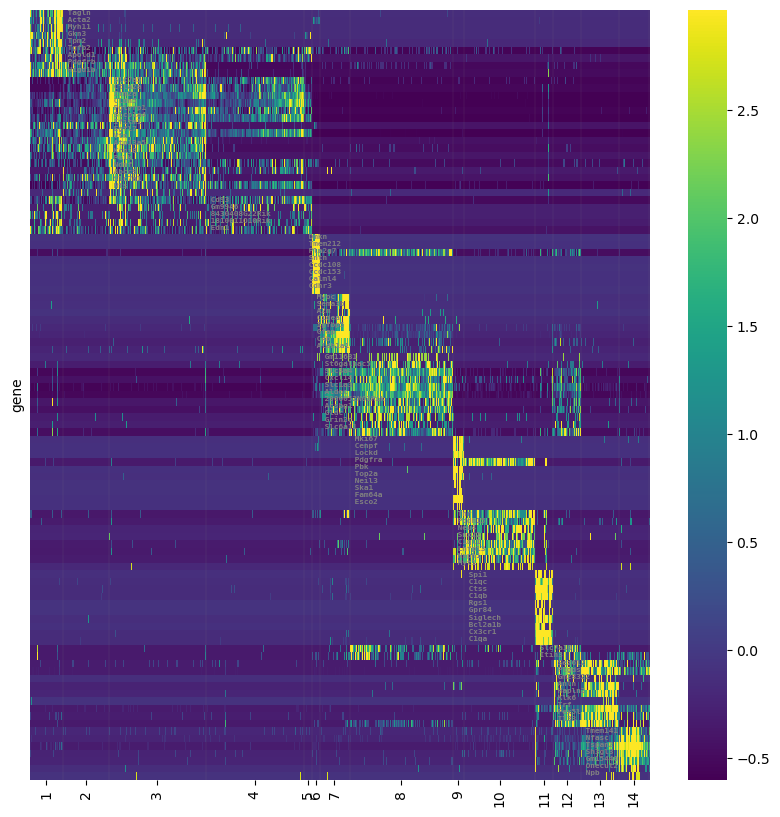

writing to file


In [192]:
NN_filtered_folder = '/bigdata/isaac/Nonneuronal_files/filtered/'
cell_class = 'Nonneuronal'
%matplotlib inline
NN_df_marker_f, NN_arr_tsne_f, NN_meta_data_df_plis_f, NN_meta_data_df_pca, NN_mgs_f, NN_ind_f, NN_ind_s_f, NN_df_marker_log_and_std_col_f, NN_pos_f, NN_linkage_cluster_order_filtered, NN_change_indices_f = dp_rc.reprocess(NN_df_ge,NN_meta_data_df_plis_filtered,NN_linkage_cluster_order_filtered,NN_filtered_folder,cell_class, sort = True, write_to_file=True)

/tmp/ipykernel_1329735/873032068.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order_filtered, rotation = 90)


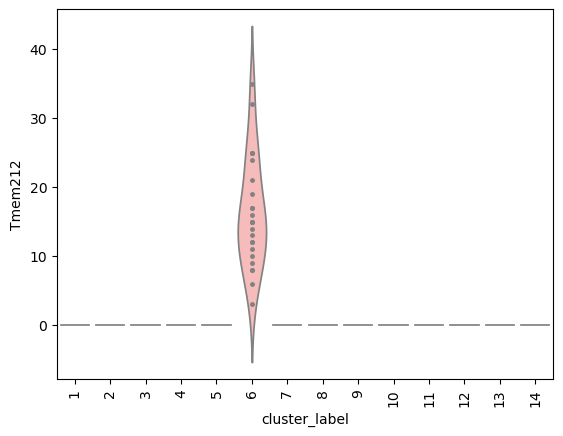

In [190]:
NN_df_plis_f = NN_df_plis.reindex(columns = NN_meta_data_df_plis_f.columns)

#check some specific expression of genes
gene = 'Tmem212'
%matplotlib inline
fig,ax = plt.subplots()
sns.violinplot(x=NN_meta_data_df_plis_f.T['cluster_label'], y=NN_df_plis_f.T[gene], inner = 'point')
#sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
ax.set_xticklabels(NN_linkage_cluster_order_filtered, rotation = 90)
plt.show()

/tmp/ipykernel_1329735/644247390.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)


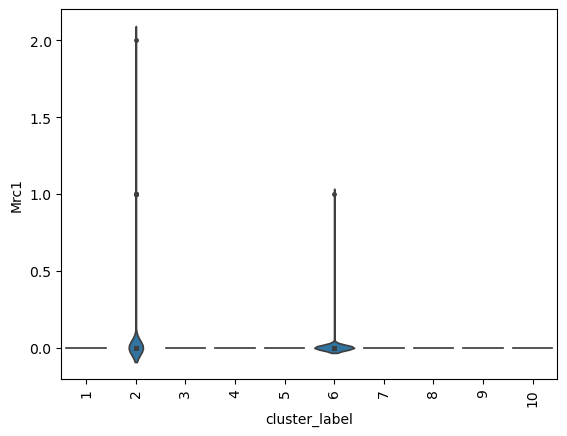

/tmp/ipykernel_1329735/644247390.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)


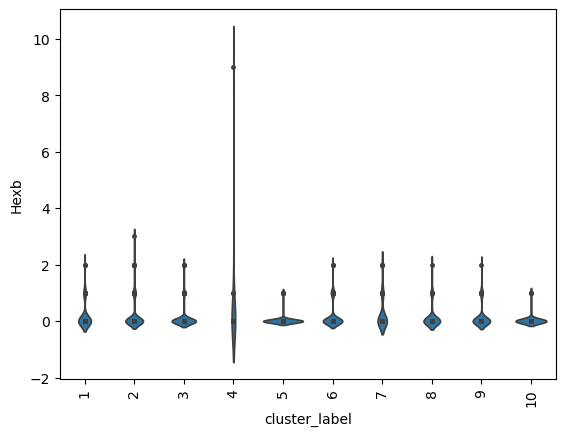

/tmp/ipykernel_1329735/644247390.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)


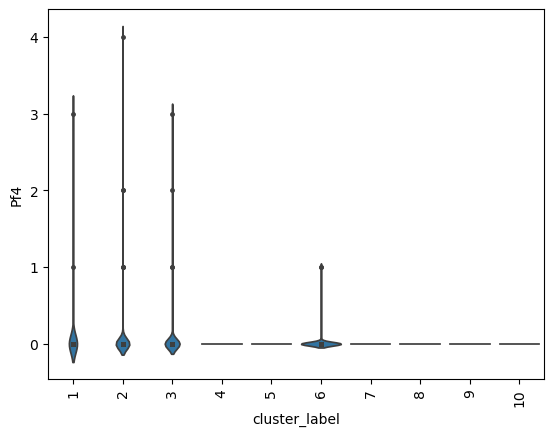

In [146]:
pvm_markers = ['Mrc1','Hexb','Pf4']
%matplotlib inline
for gene in pvm_markers:
    fig,ax = plt.subplots()
    sns.violinplot(x=NN_meta_data_df_plis_f.T['cluster_label'], y=NN_df_plis_f.T[gene], inner = 'point')
    #sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
    ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)
    plt.show()

In [145]:
np.unique(NN_meta_data_df_plis_f.loc['cluster_label',:])

array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], dtype=object)

In [49]:
NN_meta_data_df_plis_f.loc[:,NN_meta_data_df_plis_f.loc['cluster_label',:]==9]

,CATGCAAAGCTCACTA-1_10X36_2,CATACAGAGGTGCCAA-1_10X51_4,TTCCAATCAAGAGGCT-1_10X35_1,AACGAAAGTACCTATG-1_10X36_1,GGGTATTGTAACATCC-1_10X38_2,CAGATACTCGGCTTCT-1_10X52_2,TACTTACGTGCCTAAT-1_10X51_1,AGGTTACTCCCTCTCC-1_10X51_1,AGACCCGTCGCTCTAC-1_10X52_4,ATCACGAAGGACAACC-1_10X52_4,...,GTCCTCACAACCGTAT-1_10X51_1,TGCCGAGCAATATCCG-1_10X51_1,ACTTATCAGGTGGGTT-1_10X51_1,CAGGCCAAGAGTGTTA-1_10X51_1,ATCTCTACATTGTGCA-1_10X51_1,TTCTAGTAGCCATTCA-1_10X51_1,TCATGTTGTCGCGTCA-1_10X52_4,TATCAGGAGTACCCTA-1_10X51_3,TTTGATCCACCCTATC-1_10X51_1,GAGACCCGTAGACAAT-1_10X51_1
Serial_Number,66.0,100.0,63.0,65.0,70.0,102.0,97.0,97.0,104.0,104.0,...,97.0,97.0,97.0,97.0,97.0,97.0,104.0,99.0,97.0,97.0
Date_Captured,2019-11-24,05/31/20,2019-11-20,2019-11-24,2019-12-01,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,...,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,C57Bl/6,,,,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,...,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-M,Breeder-M,Naïve-F,Naïve-M,Naïve-F,Breeder-F,Breeder-F,Breeder-F,Breeder-M,Breeder-M,...,Breeder-F,Breeder-F,Breeder-F,Breeder-F,Breeder-F,Breeder-F,Breeder-M,Breeder-M,Breeder-F,Breeder-F
ChipID,10X36,10X51,10X35,10X36,10X38,10X52,10X51,10X51,10X52,10X52,...,10X51,10X51,10X51,10X51,10X51,10X51,10X52,10X51,10X51,10X51
SampleID,10X36_2,10X51_4,10X35_1,10X36_1,10X38_2,10X52_2,10X51_1,10X51_1,10X52_4,10X52_4,...,10X51_1,10X51_1,10X51_1,10X51_1,10X51_1,10X51_1,10X52_4,10X51_3,10X51_1,10X51_1
DonorID,DI3,DI-B1-M,"DI1,DI2",DI3,DI6,DI-B3-F,DI-B1-F,DI-B1-F,DI-B3-M,DI-B3-M,...,DI-B1-F,DI-B1-F,DI-B1-F,DI-B1-F,DI-B1-F,DI-B1-F,DI-B3-M,DI-B1-M,DI-B1-F,DI-B1-F


In [50]:
NN_meta_data_df_plis_f.loc[:,NN_meta_data_df_plis_f.loc['cluster_label',:]==10]

,TGTGCGGAGACTACCT-1_10X35_1,GACTATGTCGGAACTT-1_10X52_4,AGAGAATTCTTTGCGC-1_10X36_1,GTCATGATCAACTGGT-1_10X52_3,CAAAGAATCACGGGAA-1_10X37_2,TTGTGGAGTTCTTAGG-1_10X51_1,TACGGTATCCTACTGC-1_10X51_1,TTGGGTATCGCCATAA-1_10X51_2,GTGGAGACAAGGTCAG-1_10X51_4,TACGTCCAGTAGGAAG-1_10X52_3,...,ACGTAGTTCACAATGC-1_10X35_2,GCACTAATCCATGCAA-1_10X52_1,GTGGAAGAGGCATCGA-1_10X52_2,TCGGATACAGGGTCTC-1_10X51_1,TCGCAGGTCTATTTCG-1_10X51_2,ATGAGGGTCCTTCAGC-1_10X51_2,CAAGGGATCCTACCGT-1_10X37_2,GGAGATGGTACCCGCA-1_10X51_1,TGGGAGAAGTGTTCAC-1_10X52_1,TGTCAGAAGACATATG-1_10X38_1
Serial_Number,63.0,104.0,65.0,103.0,68.0,97.0,97.0,98.0,100.0,103.0,...,64.0,101.0,102.0,97.0,98.0,98.0,68.0,97.0,101.0,69.0
Date_Captured,2019-11-20,05/31/20,2019-11-24,05/31/20,2019-11-25,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,...,2019-11-20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,2019-11-25,05/31/20,05/31/20,2019-12-01
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,C57Bl/6,,C57Bl/6,,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,...,,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,,C57Bl/6,C57Bl/6,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-F,Breeder-M,Naïve-M,Breeder-M,Naïve-M,Breeder-F,Breeder-F,Breeder-F,Breeder-M,Breeder-M,...,Naïve-F,Breeder-F,Breeder-F,Breeder-F,Breeder-F,Breeder-F,Naïve-M,Breeder-F,Breeder-F,Naïve-F
ChipID,10X35,10X52,10X36,10X52,10X37,10X51,10X51,10X51,10X51,10X52,...,10X35,10X52,10X52,10X51,10X51,10X51,10X37,10X51,10X52,10X38
SampleID,10X35_1,10X52_4,10X36_1,10X52_3,10X37_2,10X51_1,10X51_1,10X51_2,10X51_4,10X52_3,...,10X35_2,10X52_1,10X52_2,10X51_1,10X51_2,10X51_2,10X37_2,10X51_1,10X52_1,10X38_1
DonorID,"DI1,DI2",DI-B3-M,DI3,DI-B3-M,"DI4,DI5",DI-B1-F,DI-B1-F,DI-B1-F,DI-B1-M,DI-B3-M,...,"DI1,DI2",DI-B3-F,DI-B3-F,DI-B1-F,DI-B1-F,DI-B1-F,"DI4,DI5",DI-B1-F,DI-B3-F,DI6


In [51]:
NN_meta_data_df_plis_f.loc['cluster_label',NN_meta_data_df_plis_f.loc['cluster_label',:]==10] = 9

In [52]:
NN_meta_data_df_plis_f.loc[:,NN_meta_data_df_plis_f.loc['cluster_label',:]==9]

,CATGCAAAGCTCACTA-1_10X36_2,CATACAGAGGTGCCAA-1_10X51_4,TTCCAATCAAGAGGCT-1_10X35_1,AACGAAAGTACCTATG-1_10X36_1,GGGTATTGTAACATCC-1_10X38_2,CAGATACTCGGCTTCT-1_10X52_2,TACTTACGTGCCTAAT-1_10X51_1,AGGTTACTCCCTCTCC-1_10X51_1,AGACCCGTCGCTCTAC-1_10X52_4,ATCACGAAGGACAACC-1_10X52_4,...,ACGTAGTTCACAATGC-1_10X35_2,GCACTAATCCATGCAA-1_10X52_1,GTGGAAGAGGCATCGA-1_10X52_2,TCGGATACAGGGTCTC-1_10X51_1,TCGCAGGTCTATTTCG-1_10X51_2,ATGAGGGTCCTTCAGC-1_10X51_2,CAAGGGATCCTACCGT-1_10X37_2,GGAGATGGTACCCGCA-1_10X51_1,TGGGAGAAGTGTTCAC-1_10X52_1,TGTCAGAAGACATATG-1_10X38_1
Serial_Number,66.0,100.0,63.0,65.0,70.0,102.0,97.0,97.0,104.0,104.0,...,64.0,101.0,102.0,97.0,98.0,98.0,68.0,97.0,101.0,69.0
Date_Captured,2019-11-24,05/31/20,2019-11-20,2019-11-24,2019-12-01,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,...,2019-11-20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,2019-11-25,05/31/20,05/31/20,2019-12-01
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,C57Bl/6,,,,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,...,,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,,C57Bl/6,C57Bl/6,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-M,Breeder-M,Naïve-F,Naïve-M,Naïve-F,Breeder-F,Breeder-F,Breeder-F,Breeder-M,Breeder-M,...,Naïve-F,Breeder-F,Breeder-F,Breeder-F,Breeder-F,Breeder-F,Naïve-M,Breeder-F,Breeder-F,Naïve-F
ChipID,10X36,10X51,10X35,10X36,10X38,10X52,10X51,10X51,10X52,10X52,...,10X35,10X52,10X52,10X51,10X51,10X51,10X37,10X51,10X52,10X38
SampleID,10X36_2,10X51_4,10X35_1,10X36_1,10X38_2,10X52_2,10X51_1,10X51_1,10X52_4,10X52_4,...,10X35_2,10X52_1,10X52_2,10X51_1,10X51_2,10X51_2,10X37_2,10X51_1,10X52_1,10X38_1
DonorID,DI3,DI-B1-M,"DI1,DI2",DI3,DI6,DI-B3-F,DI-B1-F,DI-B1-F,DI-B3-M,DI-B3-M,...,"DI1,DI2",DI-B3-F,DI-B3-F,DI-B1-F,DI-B1-F,DI-B1-F,"DI4,DI5",DI-B1-F,DI-B3-F,DI6


In [53]:
NN_linkage_cluster_order_filtered_tmp = np.delete(NN_linkage_cluster_order_filtered, 9)

In [55]:
NN_linkage_cluster_order_filtered_tmp

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 11, 12])

In [57]:
NN_meta_data_df_plis_f_tmp,linkage_cluster_order_filtered_tmp = dp.update_metadata_cluster_labels(NN_linkage_cluster_order_filtered_tmp,NN_meta_data_df_plis_f)

{1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9, 11: 10, 12: 11}
[1 2 3 4 5 6 7 8 9 11 12]


In [63]:
linkage_cluster_order_filtered_tmp

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])

In [65]:
np.unique(NN_meta_data_df_plis_f_tmp.loc['cluster_label',:])

array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], dtype=object)

### L3 recalc with filtered merged data

It contains 0 infinite values


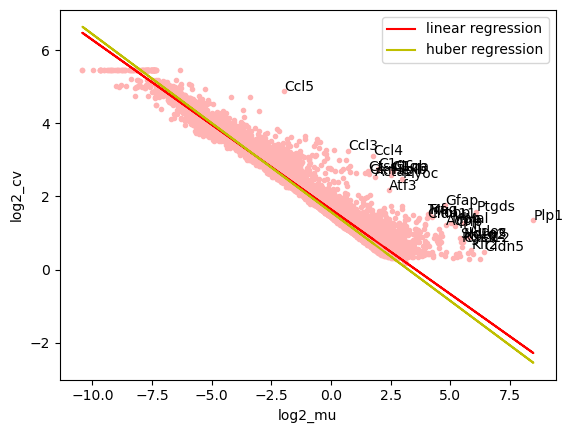

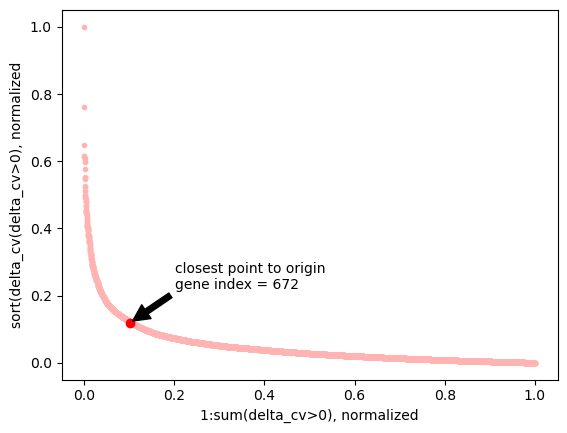

(672, 1961)
True
It contains 0 infinite values
#nan values 0
column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


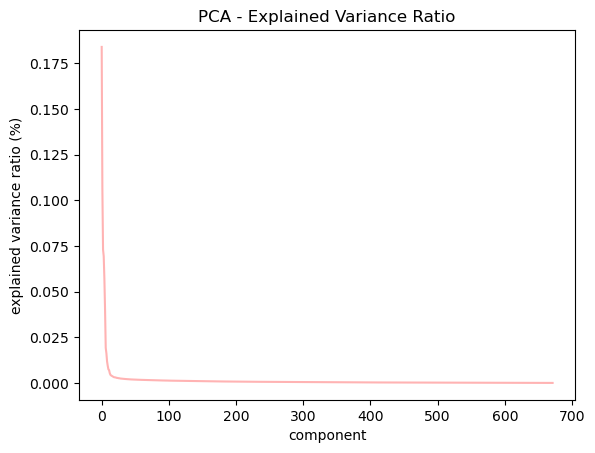

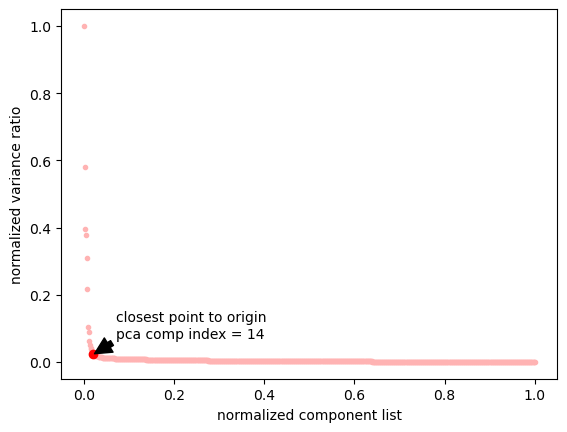

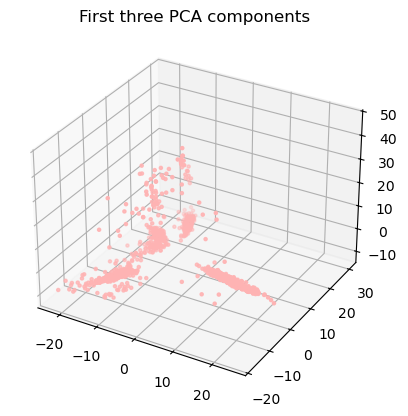

2025-02-17 14:05:53,928 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-02-17 14:05:54,157 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-02-17 14:05:54,161 - harmonypy - INFO - Iteration 1 of 20
2025-02-17 14:05:54,390 - harmonypy - INFO - Iteration 2 of 20
2025-02-17 14:05:54,622 - harmonypy - INFO - Iteration 3 of 20
2025-02-17 14:05:54,781 - harmonypy - INFO - Iteration 4 of 20
2025-02-17 14:05:54,876 - harmonypy - INFO - Iteration 5 of 20
2025-02-17 14:05:54,956 - harmonypy - INFO - Iteration 6 of 20
2025-02-17 14:05:55,036 - harmonypy - INFO - Iteration 7 of 20
2025-02-17 14:05:55,117 - harmonypy - INFO - Iteration 8 of 20
2025-02-17 14:05:55,207 - harmonypy - INFO - Iteration 9 of 20
2025-02-17 14:05:55,298 - harmonypy - INFO - Converged after 9 iterations


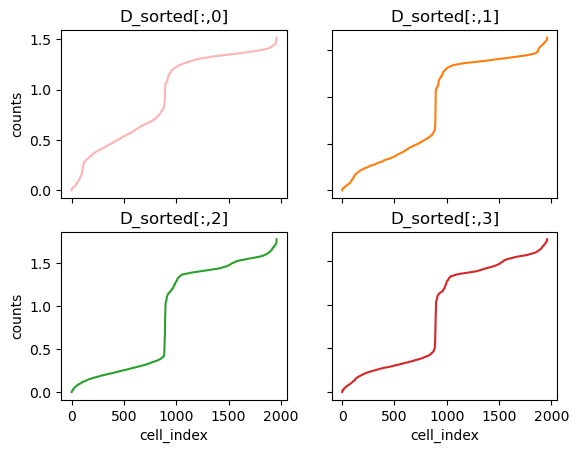

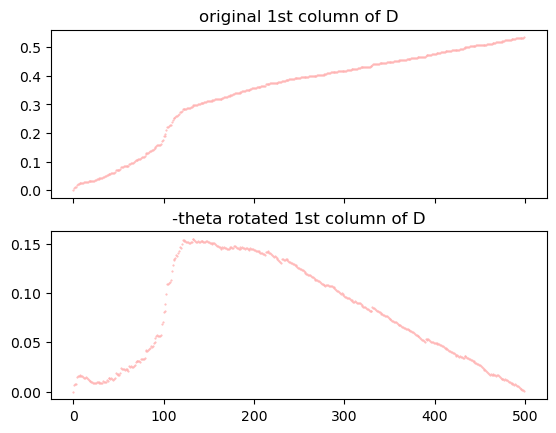

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 74.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


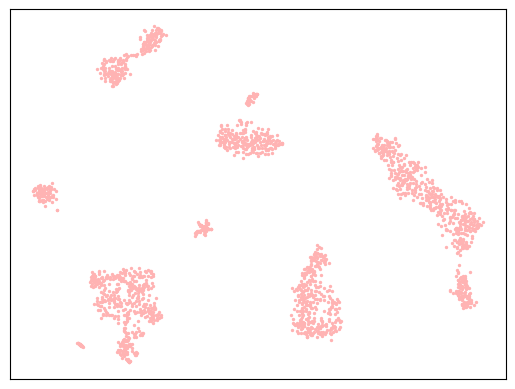

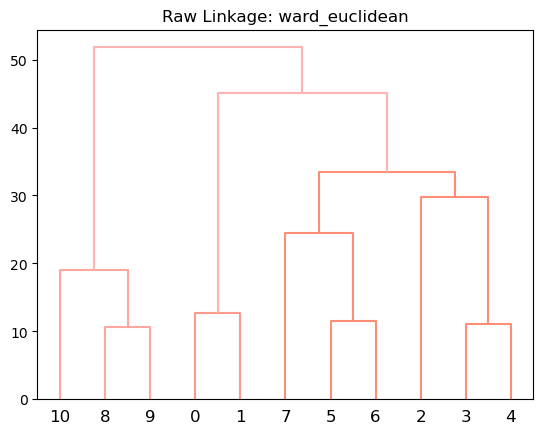

[ 8  9 10  2  3  4  5  6  7  1  0]


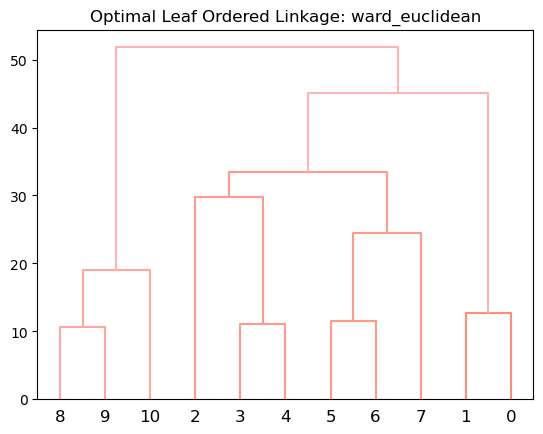

metadata df shape post inter cluster sort
(29, 1961)


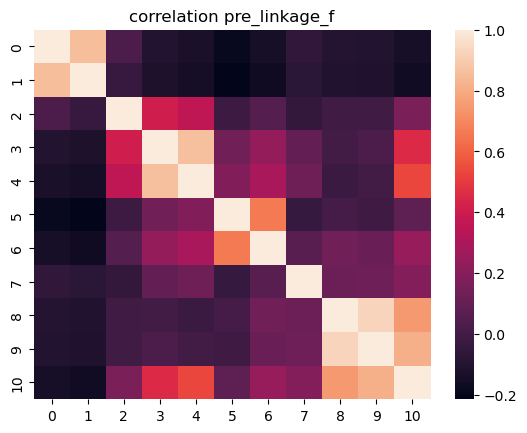

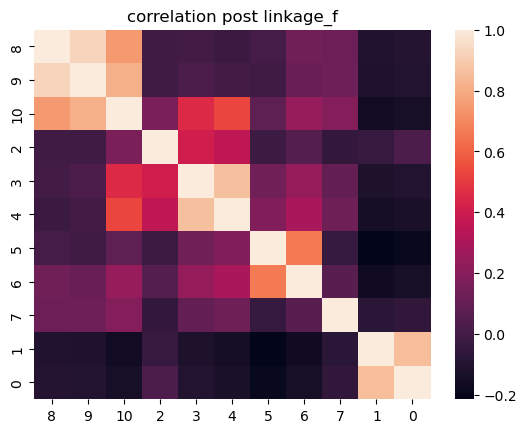

{9: 1, 10: 2, 11: 3, 3: 4, 4: 5, 5: 6, 6: 7, 7: 8, 8: 9, 2: 10, 1: 11}
[1 2 3 4 5 6 7 8 9 10 11]
len marker_Genes_sorted 87
len marker_genes_sorted_final 87
column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00
Indices where the value changes: [0, 98, 217, 304, 329, 423, 749, 786, 1011, 1068, 1855, 1960]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
11
[array([0, 1, 2, 3, 4, 5, 6]), array([16, 17, 11, 12, 13, 10,  7,  9,  8]), array([14, 15]), array([18, 19, 20, 21, 22, 40, 24, 23]), array([26, 25, 28, 29, 30, 27, 31, 32]), array([37, 38, 35, 34, 33, 36, 39, 41, 42, 43, 44]), array([50, 53, 52, 51, 48, 49, 47, 59, 45, 46]), array([62, 61, 56, 57, 60, 58, 55, 54]), array([63, 64, 67, 68, 65, 66, 72, 71, 69, 70]), array([81, 79, 80, 75, 78, 77, 73, 74, 76]), array([83, 84, 86, 82, 85])]
11
saving heatmap..


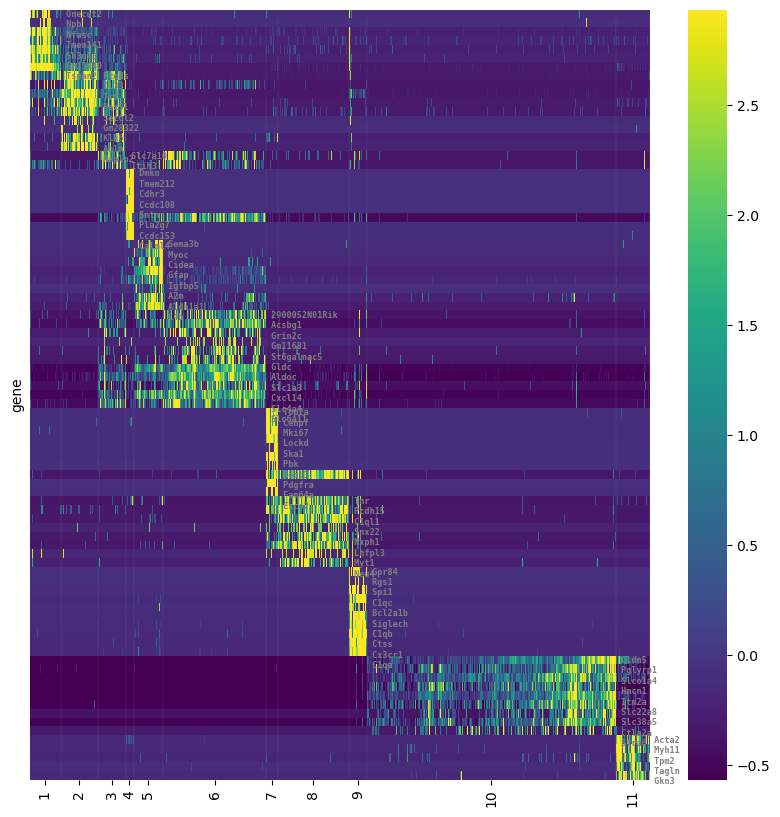

writing to file


In [226]:
NN_filtered_folder = '/bigdata/isaac/Nonneuronal_files/filtered_merged/'
cell_class = 'Nonneuronal'
%matplotlib inline
NN_df_marker_fm, NN_arr_tsne_fm, NN_meta_data_df_plis_fm, NN_meta_data_df_pca_m, NN_mgs_fm, NN_ind_fm, NN_ind_s_fm, NN_df_marker_log_and_std_col_fm, NN_pos_fm, NN_linkage_cluster_order_filtered_merged, NN_change_indices_fm = dp_rc.reprocess(NN_df_ge,
                                                                                                                                                                                                                                         NN_meta_data_df_plis_filtered_merged,
                                                                                                                                                                                                                                         NN_linkage_cluster_order_filtered_merged,
                                                                                                                                                                                                                                         NN_filtered_folder,
                                                                                                                                                                                                                                         cell_class, 
                                                                                                                                                                                                                                         sort = True, 
                                                                                                                                                                                                                                         write_to_file=True)

In [121]:
np.all(NN_df_marker_fm.columns == NN_meta_data_df_plis_fm.columns)

True

In [122]:
NN_df_plis_fm = NN_df_plis_filtered.reindex(columns = NN_df_marker_fm.columns)

/tmp/ipykernel_1329735/2224410124.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)


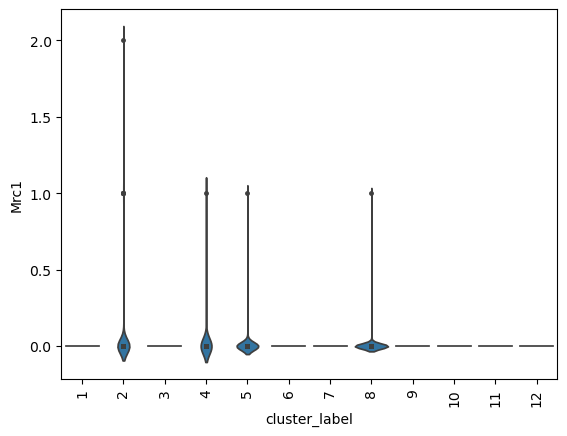

/tmp/ipykernel_1329735/2224410124.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)


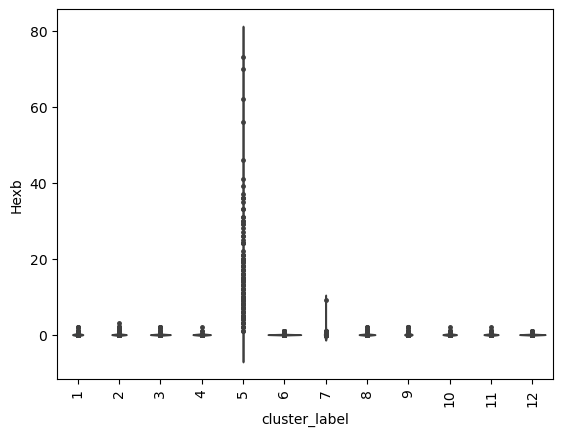

/tmp/ipykernel_1329735/2224410124.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)


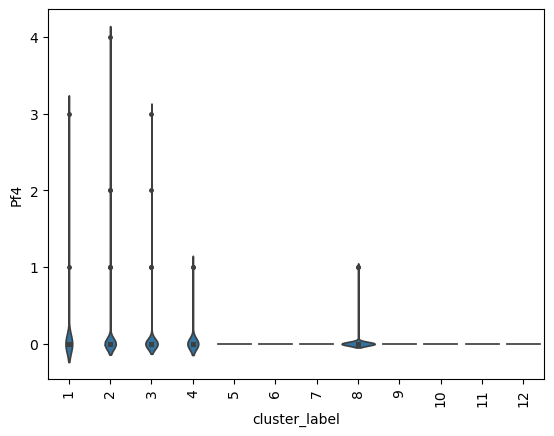

In [123]:
pvm_markers = ['Mrc1','Hexb','Pf4']
%matplotlib inline
for gene in pvm_markers:
    fig,ax = plt.subplots()
    sns.violinplot(x=NN_meta_data_df_plis_fm.T['cluster_label'], y=NN_df_plis_fm.T[gene], inner = 'point')
    #sns.stripplot(x=amy_vglut2_md.T['full_name'], y=amy_vglut2_ce_ge_cv_ls.T[gene], color="k", size=3)
    ax.set_xticklabels(NN_linkage_cluster_order, rotation = 90)
    plt.show()

## 4) Add cluster labels (manual)

In [232]:

NN_filtered_folder = '/bigdata/isaac/Nonneuronal_files/filtered_merged/'
NN_labels = dp.get_cluster_labels(NN_filtered_folder, 'Nonneuronal_filtered_labels_rc.csv')
NN_labels

['OL_1',
 'OL_2',
 'OL_3',
 'Epend',
 'Astro_gfap',
 'Astro',
 'Proliferating_cells',
 'OPC',
 'Microglia',
 'Endothelial',
 'VSM']

### add label markers to plis filtered metadata

In [ ]:
NN_linkage_cluster_order_filtered_merged

In [233]:
NN_filtered_folder = '/bigdata/isaac/Nonneuronal_files/filtered_merged/'
NN_meta_data_df_plis_fm_markers = dp.update_metadata_w_markers(NN_filtered_folder, 
                                                                         NN_meta_data_df_plis_fm,
                                                                         NN_linkage_cluster_order_filtered_merged,
                                                                         NN_labels,
                                                                         'NN',
                                                                        write_to_file = True)


In [ ]:
NN_df_marker_log_and_std_col_fm

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
11
[array([0, 1, 2, 3, 4, 5, 6]), array([16, 17, 11, 12, 13, 10,  7,  9,  8]), array([14, 15]), array([18, 19, 20, 21, 22, 40, 24, 23]), array([26, 25, 28, 29, 30, 27, 31, 32]), array([37, 38, 35, 34, 33, 36, 39, 41, 42, 43, 44]), array([50, 53, 52, 51, 48, 49, 47, 59, 45, 46]), array([62, 61, 56, 57, 60, 58, 55, 54]), array([63, 64, 67, 68, 65, 66, 72, 71, 69, 70]), array([81, 79, 80, 75, 78, 77, 73, 74, 76]), array([83, 84, 86, 82, 85])]
11
saving heatmap..


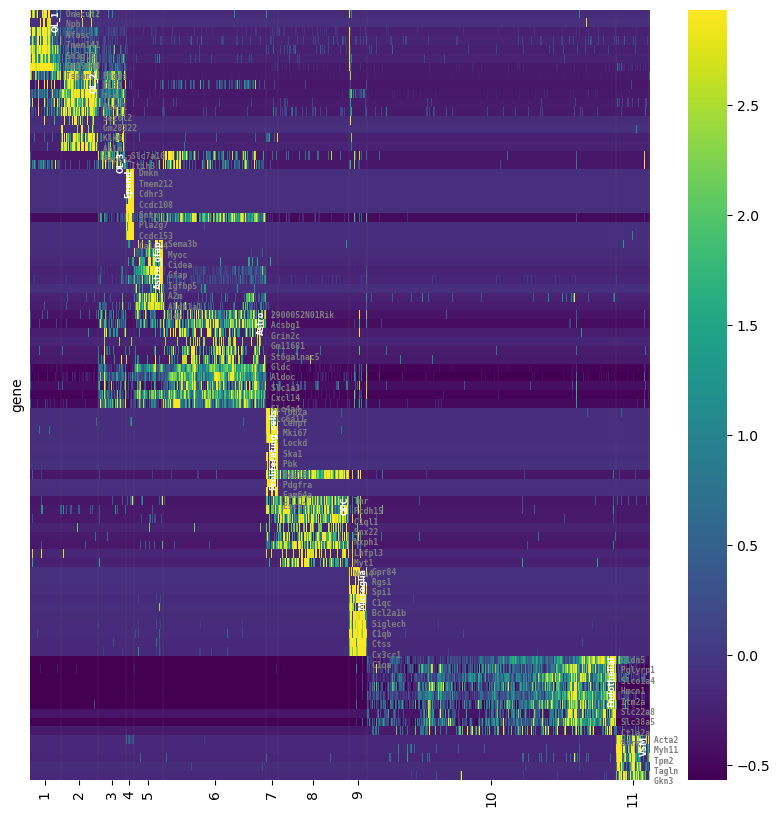

In [234]:
#plot heatmap w/ labels
NN_filtered_folder = '/bigdata/isaac/Nonneuronal_files/filtered_merged/'
%matplotlib inline
linkage_alg = 'ward'
dist_metric = 'euclidean'
NN_tg_f, NN_tgfs_f = dp.get_heatmap_labels(NN_mgs_fm, NN_ind_fm, NN_ind_s_fm)
#sanity check - plotting only filtered gaba_df (clusters removed)
dp.plot_marker_heatmap(NN_df_marker_log_and_std_col_fm, 
                       NN_pos_fm, 
                       NN_linkage_cluster_order_filtered_merged, 
                       NN_change_indices_fm, 
                       NN_tg_f, 
                       NN_tgfs_f, 
                       linkage_alg,
                       dist_metric,
                       NN_filtered_folder,
                       fs_waterfall = 5.8,
                       cluster_labels = NN_labels,
                       savefig = True,
                       cell_class = 'NN_filtered_merged_tg_reenrich_labeled')

In [235]:
NN_filtered_folder

'/bigdata/isaac/Nonneuronal_files/filtered_merged/'

In [162]:
#generate colormap
np.all(NN_meta_data_df_plis_f.columns == NN_meta_data_df_plis_f_markers.columns)

True

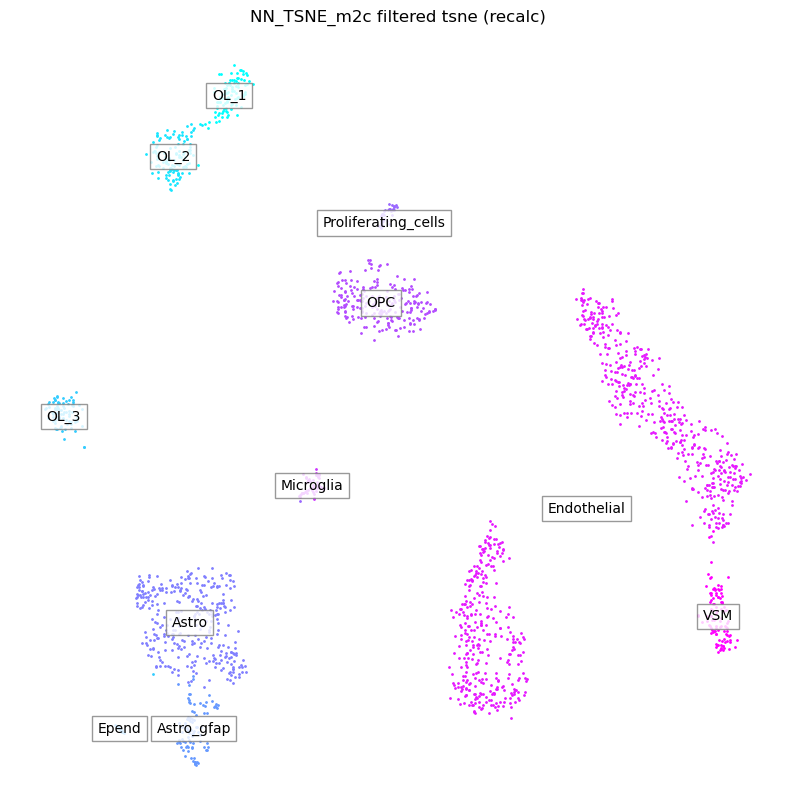

In [237]:
NN_label_color_df = pd.read_csv(NN_filtered_folder + 'Nonneuronal_filtered_labels_rc.csv')
NN_m_2_c_dict = dict(zip(NN_label_color_df.loc[:,'markers'],NN_label_color_df.loc[:,'hex']))

#NN_meta_data_df_plis_filtered_tsne = dp.update_metadata_w_markers(folder, NN_meta_data_df_plis_filtered, NN_linkage_cluster_order_filtered, NN_labels, 'NN_TSNE', write_to_file = False)
#resort tsne index to match index of final labeled metadata
NN_tsne_arr_tmp = pd.DataFrame(index=NN_meta_data_df_plis_filtered.columns, data=NN_arr_tsne_f)
NN_tsne_arr_tmp_ri = NN_tsne_arr_tmp.reindex(index = NN_meta_data_df_plis_fm_markers.columns)

dp.plot_rc_tsne(NN_meta_data_df_plis_fm_markers,NN_tsne_arr_tmp_ri.values,'NN_TSNE_m2c', NN_filtered_folder,m_2_c_dict=NN_m_2_c_dict,savefig=True)


In [242]:
NN_adata_f = ad.AnnData(NN_df_marker_fm.T)
#or use full gene list to get
#add aligned metadata
for x in NN_meta_data_df_plis_fm_markers.index:
    NN_adata_f.obs[str(x)] = NN_meta_data_df_plis_fm_markers.loc[str(x),:]

NN_markers = NN_adata_f.obs['markers']
_, idx = np.unique(NN_adata_f.obs['markers'], return_index=True)
NN_markers = list(NN_markers[np.sort(idx)])
NN_violin_markers = ['Tspan2','Ptgds','Tmem212','Gfap','Aldoc','Pdgfra','C1qa','Cldn5','Acta2']

/tmp/ipykernel_1329735/1015458449.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  NN_markers = list(NN_markers[np.sort(idx)])


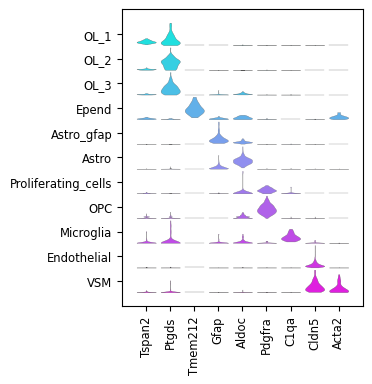

In [243]:
%matplotlib inline
sc.settings.figdir = "/bigdata/isaac/Nonneuronal_files/filtered"
# Create a custom color palette
NN_palette = {k: f"#{v}" for k, v in NN_m_2_c_dict.items()}
NN_custom_palette = sns.color_palette(list(NN_palette.values()))
sns.set_palette(NN_custom_palette)

sc.pl.stacked_violin(NN_adata_f, 
                     NN_violin_markers, 
                     groupby='markers', 
                     categories_order= NN_markers, 
                     #colorbar_title = 'Log/Std Expression', 
                     #vmax=2, 
                     #density_norm = 'width', 
                     row_palette = NN_custom_palette, 
                     save = 'NN_violin_markers_m2c.pdf')